<span style="font-size:20px;">P5 : Segmentation des clients d’un Site E-Commerce 

<span style="font-size:18px;">Qu'est-ce que la segmentation client ? 
    
<span style="font-size:18px;">Comprendre le paysage du marché dans les entreprises et élaborer des stratégies commerciales ou marketing ciblées adaptées à chaque groupe. La segmentation est l'action de découpage de la population (les clients) en sous-ensembles homogènes, selon différents critères de segmentation.

Dans ce Notebook, la méthodologie générale est la suivante :  
    
1. Features Engineering : premièrement, nous établissons différents critères de segmentation, comme la récence, la fréquence, le montant monétaire, le prix moyen, les versements échelonnés moyens, le nombre moyen de jours de livraison, etc.
    
2. Clustering : Méthode RFM; RFM + Reviews; RFM + Reviews + Behavior; RFM + Reviews + Behavior + Catégories; All columns.
    
3. Pour chaque méthodes: Nous utiliserons les algorithmes KMeans, DBSCAN et C.A.H.  
    
4. Visualisation des clusters : Boxplot, Barplot, Distributions, Réduction de dimension. 
    

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Imports" data-toc-modified-id="Imports-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#Importation-du-fichier" data-toc-modified-id="Importation-du-fichier-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Importation du fichier</a></span></li><li><span><a href="#Functions" data-toc-modified-id="Functions-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Functions</a></span></li><li><span><a href="#Features-Engineering" data-toc-modified-id="Features-Engineering-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Features Engineering</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Recency" data-toc-modified-id="Recency-4.0.1"><span class="toc-item-num">4.0.1&nbsp;&nbsp;</span><strong>Recency</strong></a></span></li><li><span><a href="#Frequency" data-toc-modified-id="Frequency-4.0.2"><span class="toc-item-num">4.0.2&nbsp;&nbsp;</span><strong>Frequency</strong></a></span></li><li><span><a href="#Monetary" data-toc-modified-id="Monetary-4.0.3"><span class="toc-item-num">4.0.3&nbsp;&nbsp;</span><strong>Monetary</strong></a></span></li><li><span><a href="#Average-price" data-toc-modified-id="Average-price-4.0.4"><span class="toc-item-num">4.0.4&nbsp;&nbsp;</span><strong>Average price</strong></a></span></li><li><span><a href="#Average-freight-value" data-toc-modified-id="Average-freight-value-4.0.5"><span class="toc-item-num">4.0.5&nbsp;&nbsp;</span><strong>Average freight value</strong></a></span></li><li><span><a href="#Mean-payment-installments" data-toc-modified-id="Mean-payment-installments-4.0.6"><span class="toc-item-num">4.0.6&nbsp;&nbsp;</span><strong>Mean payment installments</strong></a></span></li><li><span><a href="#Nombre-d'article-par-commande" data-toc-modified-id="Nombre-d'article-par-commande-4.0.7"><span class="toc-item-num">4.0.7&nbsp;&nbsp;</span><strong>Nombre d'article par commande</strong></a></span></li><li><span><a href="#Mean-reviews-scores" data-toc-modified-id="Mean-reviews-scores-4.0.8"><span class="toc-item-num">4.0.8&nbsp;&nbsp;</span><strong>Mean reviews scores</strong></a></span></li><li><span><a href="#Mean-days-delivery" data-toc-modified-id="Mean-days-delivery-4.0.9"><span class="toc-item-num">4.0.9&nbsp;&nbsp;</span><strong>Mean days delivery</strong></a></span></li><li><span><a href="#Nombre-de--catégories-achetées" data-toc-modified-id="Nombre-de--catégories-achetées-4.0.10"><span class="toc-item-num">4.0.10&nbsp;&nbsp;</span><strong>Nombre de  catégories achetées</strong></a></span></li><li><span><a href="#Merging" data-toc-modified-id="Merging-4.0.11"><span class="toc-item-num">4.0.11&nbsp;&nbsp;</span>Merging</a></span></li><li><span><a href="#Analyse-graphiques" data-toc-modified-id="Analyse-graphiques-4.0.12"><span class="toc-item-num">4.0.12&nbsp;&nbsp;</span>Analyse graphiques</a></span></li></ul></li></ul></li><li><span><a href="#Clustering" data-toc-modified-id="Clustering-5"><span class="toc-item-num">5&nbsp;&nbsp;</span><strong>Clustering</strong></a></span></li><li><span><a href="#Méthode-RFM" data-toc-modified-id="Méthode-RFM-6"><span class="toc-item-num">6&nbsp;&nbsp;</span><strong>Méthode RFM</strong></a></span><ul class="toc-item"><li><span><a href="#RFM-Score-(manuellement)" data-toc-modified-id="RFM-Score-(manuellement)-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span><strong>RFM Score (manuellement)</strong></a></span><ul class="toc-item"><li><span><a href="#over-time" data-toc-modified-id="over-time-6.1.1"><span class="toc-item-num">6.1.1&nbsp;&nbsp;</span>over time</a></span></li><li><span><a href="#generalisation" data-toc-modified-id="generalisation-6.1.2"><span class="toc-item-num">6.1.2&nbsp;&nbsp;</span>generalisation</a></span><ul class="toc-item"><li><span><a href="#Exemple" data-toc-modified-id="Exemple-6.1.2.1"><span class="toc-item-num">6.1.2.1&nbsp;&nbsp;</span>Exemple</a></span></li></ul></li><li><span><a href="#Visualisations-des-clusters" data-toc-modified-id="Visualisations-des-clusters-6.1.3"><span class="toc-item-num">6.1.3&nbsp;&nbsp;</span>Visualisations des clusters</a></span></li></ul></li><li><span><a href="#K-means" data-toc-modified-id="K-means-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span><strong>K-means</strong></a></span><ul class="toc-item"><li><span><a href="#Préparation-des-données" data-toc-modified-id="Préparation-des-données-6.2.1"><span class="toc-item-num">6.2.1&nbsp;&nbsp;</span>Préparation des données</a></span></li><li><span><a href="#Choix-du-nombre-de-clusters" data-toc-modified-id="Choix-du-nombre-de-clusters-6.2.2"><span class="toc-item-num">6.2.2&nbsp;&nbsp;</span>Choix du nombre de clusters</a></span><ul class="toc-item"><li><span><a href="#Elbow-method-avec-visualiseur-:-KElbowVisualizer" data-toc-modified-id="Elbow-method-avec-visualiseur-:-KElbowVisualizer-6.2.2.1"><span class="toc-item-num">6.2.2.1&nbsp;&nbsp;</span>Elbow method avec visualiseur : KElbowVisualizer</a></span></li><li><span><a href="#silhouette_score" data-toc-modified-id="silhouette_score-6.2.2.2"><span class="toc-item-num">6.2.2.2&nbsp;&nbsp;</span>silhouette_score</a></span></li><li><span><a href="#Optimisation-des-hyperparametrs-:" data-toc-modified-id="Optimisation-des-hyperparametrs-:-6.2.2.3"><span class="toc-item-num">6.2.2.3&nbsp;&nbsp;</span>Optimisation des hyperparametrs :</a></span></li></ul></li><li><span><a href="#Entraînement-model" data-toc-modified-id="Entraînement-model-6.2.3"><span class="toc-item-num">6.2.3&nbsp;&nbsp;</span>Entraînement model</a></span></li><li><span><a href="#Visualisations-des-clusters" data-toc-modified-id="Visualisations-des-clusters-6.2.4"><span class="toc-item-num">6.2.4&nbsp;&nbsp;</span>Visualisations des clusters</a></span><ul class="toc-item"><li><span><a href="#Analyse-graphique-:-Distributions" data-toc-modified-id="Analyse-graphique-:-Distributions-6.2.4.1"><span class="toc-item-num">6.2.4.1&nbsp;&nbsp;</span>Analyse graphique : Distributions</a></span></li><li><span><a href="#Avec-réduction-de-dimension" data-toc-modified-id="Avec-réduction-de-dimension-6.2.4.2"><span class="toc-item-num">6.2.4.2&nbsp;&nbsp;</span>Avec réduction de dimension</a></span></li><li><span><a href="#umap-visualisation" data-toc-modified-id="umap-visualisation-6.2.4.3"><span class="toc-item-num">6.2.4.3&nbsp;&nbsp;</span>umap visualisation</a></span></li><li><span><a href="#TSNE-visualisation" data-toc-modified-id="TSNE-visualisation-6.2.4.4"><span class="toc-item-num">6.2.4.4&nbsp;&nbsp;</span>TSNE visualisation</a></span></li><li><span><a href="#PCA-visualisation" data-toc-modified-id="PCA-visualisation-6.2.4.5"><span class="toc-item-num">6.2.4.5&nbsp;&nbsp;</span>PCA visualisation</a></span></li><li><span><a href="#Radar-Chart" data-toc-modified-id="Radar-Chart-6.2.4.6"><span class="toc-item-num">6.2.4.6&nbsp;&nbsp;</span>Radar Chart</a></span></li><li><span><a href="#Distribution-Clusters-Categories" data-toc-modified-id="Distribution-Clusters-Categories-6.2.4.7"><span class="toc-item-num">6.2.4.7&nbsp;&nbsp;</span>Distribution Clusters Categories</a></span></li></ul></li></ul></li><li><span><a href="#DBSCAN" data-toc-modified-id="DBSCAN-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span><strong>DBSCAN</strong></a></span><ul class="toc-item"><li><span><a href="#Entraînement-model-et-visualisation-des-clusters" data-toc-modified-id="Entraînement-model-et-visualisation-des-clusters-6.3.1"><span class="toc-item-num">6.3.1&nbsp;&nbsp;</span>Entraînement model et visualisation des clusters</a></span><ul class="toc-item"><li><span><a href="#Avec-réduction-de-dimension" data-toc-modified-id="Avec-réduction-de-dimension-6.3.1.1"><span class="toc-item-num">6.3.1.1&nbsp;&nbsp;</span>Avec réduction de dimension</a></span></li></ul></li></ul></li><li><span><a href="#Clustering-hiérarchique" data-toc-modified-id="Clustering-hiérarchique-6.4"><span class="toc-item-num">6.4&nbsp;&nbsp;</span><strong>Clustering hiérarchique</strong></a></span><ul class="toc-item"><li><span><a href="#Choix-du-nombre-de-clusters" data-toc-modified-id="Choix-du-nombre-de-clusters-6.4.1"><span class="toc-item-num">6.4.1&nbsp;&nbsp;</span>Choix du nombre de clusters</a></span></li><li><span><a href="#Entraînement-model" data-toc-modified-id="Entraînement-model-6.4.2"><span class="toc-item-num">6.4.2&nbsp;&nbsp;</span>Entraînement model</a></span></li><li><span><a href="#Visualisations-des-clusters" data-toc-modified-id="Visualisations-des-clusters-6.4.3"><span class="toc-item-num">6.4.3&nbsp;&nbsp;</span>Visualisations des clusters</a></span><ul class="toc-item"><li><span><a href="#Analyse-graphique-:-Distributions" data-toc-modified-id="Analyse-graphique-:-Distributions-6.4.3.1"><span class="toc-item-num">6.4.3.1&nbsp;&nbsp;</span>Analyse graphique : Distributions</a></span></li><li><span><a href="#Radar-Chart" data-toc-modified-id="Radar-Chart-6.4.3.2"><span class="toc-item-num">6.4.3.2&nbsp;&nbsp;</span>Radar Chart</a></span></li><li><span><a href="#Dendrogram" data-toc-modified-id="Dendrogram-6.4.3.3"><span class="toc-item-num">6.4.3.3&nbsp;&nbsp;</span>Dendrogram</a></span></li><li><span><a href="#Avec-réduction-de-dimension" data-toc-modified-id="Avec-réduction-de-dimension-6.4.3.4"><span class="toc-item-num">6.4.3.4&nbsp;&nbsp;</span>Avec réduction de dimension</a></span></li><li><span><a href="#umap-visualisation" data-toc-modified-id="umap-visualisation-6.4.3.5"><span class="toc-item-num">6.4.3.5&nbsp;&nbsp;</span>umap visualisation</a></span></li></ul></li></ul></li><li><span><a href="#Evaluation-models" data-toc-modified-id="Evaluation-models-6.5"><span class="toc-item-num">6.5&nbsp;&nbsp;</span>Evaluation models</a></span></li></ul></li><li><span><a href="#Méthode-RFM-(plus)-reviews_scores" data-toc-modified-id="Méthode-RFM-(plus)-reviews_scores-7"><span class="toc-item-num">7&nbsp;&nbsp;</span><strong>Méthode RFM (plus) reviews_scores</strong></a></span><ul class="toc-item"><li><span><a href="#K-means" data-toc-modified-id="K-means-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span><strong>K-means</strong></a></span><ul class="toc-item"><li><span><a href="#Préparation-des-données" data-toc-modified-id="Préparation-des-données-7.1.1"><span class="toc-item-num">7.1.1&nbsp;&nbsp;</span>Préparation des données</a></span></li><li><span><a href="#Choix-du-nombre-de-clusters" data-toc-modified-id="Choix-du-nombre-de-clusters-7.1.2"><span class="toc-item-num">7.1.2&nbsp;&nbsp;</span>Choix du nombre de clusters</a></span><ul class="toc-item"><li><span><a href="#Elbow-method-avec-visualiseur-:-KElbowVisualizer" data-toc-modified-id="Elbow-method-avec-visualiseur-:-KElbowVisualizer-7.1.2.1"><span class="toc-item-num">7.1.2.1&nbsp;&nbsp;</span>Elbow method avec visualiseur : KElbowVisualizer</a></span></li><li><span><a href="#silhouette_score" data-toc-modified-id="silhouette_score-7.1.2.2"><span class="toc-item-num">7.1.2.2&nbsp;&nbsp;</span>silhouette_score</a></span></li></ul></li><li><span><a href="#Entraînement-model" data-toc-modified-id="Entraînement-model-7.1.3"><span class="toc-item-num">7.1.3&nbsp;&nbsp;</span>Entraînement model</a></span></li><li><span><a href="#Visualisations-des-clusters" data-toc-modified-id="Visualisations-des-clusters-7.1.4"><span class="toc-item-num">7.1.4&nbsp;&nbsp;</span>Visualisations des clusters</a></span><ul class="toc-item"><li><span><a href="#Analyse-graphique-:-Distributions" data-toc-modified-id="Analyse-graphique-:-Distributions-7.1.4.1"><span class="toc-item-num">7.1.4.1&nbsp;&nbsp;</span>Analyse graphique : Distributions</a></span></li><li><span><a href="#Distribution-Clusters-Categories" data-toc-modified-id="Distribution-Clusters-Categories-7.1.4.2"><span class="toc-item-num">7.1.4.2&nbsp;&nbsp;</span>Distribution Clusters Categories</a></span></li><li><span><a href="#Avec-réduction-de-dimension" data-toc-modified-id="Avec-réduction-de-dimension-7.1.4.3"><span class="toc-item-num">7.1.4.3&nbsp;&nbsp;</span>Avec réduction de dimension</a></span></li><li><span><a href="#umap-visualisation" data-toc-modified-id="umap-visualisation-7.1.4.4"><span class="toc-item-num">7.1.4.4&nbsp;&nbsp;</span>umap visualisation</a></span></li><li><span><a href="#Radar-Chart" data-toc-modified-id="Radar-Chart-7.1.4.5"><span class="toc-item-num">7.1.4.5&nbsp;&nbsp;</span>Radar Chart</a></span></li></ul></li></ul></li><li><span><a href="#DBSCAN" data-toc-modified-id="DBSCAN-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span><strong>DBSCAN</strong></a></span><ul class="toc-item"><li><span><a href="#Entraînement-model-et-visualisation-des-clusters" data-toc-modified-id="Entraînement-model-et-visualisation-des-clusters-7.2.1"><span class="toc-item-num">7.2.1&nbsp;&nbsp;</span>Entraînement model et visualisation des clusters</a></span><ul class="toc-item"><li><span><a href="#Avec-réduction-de-dimension" data-toc-modified-id="Avec-réduction-de-dimension-7.2.1.1"><span class="toc-item-num">7.2.1.1&nbsp;&nbsp;</span>Avec réduction de dimension</a></span></li></ul></li></ul></li><li><span><a href="#Clustering-hiérarchique" data-toc-modified-id="Clustering-hiérarchique-7.3"><span class="toc-item-num">7.3&nbsp;&nbsp;</span><strong>Clustering hiérarchique</strong></a></span><ul class="toc-item"><li><span><a href="#Choix-du-nombre-de-clusters" data-toc-modified-id="Choix-du-nombre-de-clusters-7.3.1"><span class="toc-item-num">7.3.1&nbsp;&nbsp;</span>Choix du nombre de clusters</a></span></li><li><span><a href="#Entraînement-model" data-toc-modified-id="Entraînement-model-7.3.2"><span class="toc-item-num">7.3.2&nbsp;&nbsp;</span>Entraînement model</a></span></li><li><span><a href="#Visualisations-des-clusters" data-toc-modified-id="Visualisations-des-clusters-7.3.3"><span class="toc-item-num">7.3.3&nbsp;&nbsp;</span>Visualisations des clusters</a></span><ul class="toc-item"><li><span><a href="#Analyse-graphique-:-Distributions" data-toc-modified-id="Analyse-graphique-:-Distributions-7.3.3.1"><span class="toc-item-num">7.3.3.1&nbsp;&nbsp;</span>Analyse graphique : Distributions</a></span></li><li><span><a href="#Avec-réduction-de-dimension" data-toc-modified-id="Avec-réduction-de-dimension-7.3.3.2"><span class="toc-item-num">7.3.3.2&nbsp;&nbsp;</span>Avec réduction de dimension</a></span></li><li><span><a href="#umap-visualisation" data-toc-modified-id="umap-visualisation-7.3.3.3"><span class="toc-item-num">7.3.3.3&nbsp;&nbsp;</span>umap visualisation</a></span></li><li><span><a href="#Radar-Chart" data-toc-modified-id="Radar-Chart-7.3.3.4"><span class="toc-item-num">7.3.3.4&nbsp;&nbsp;</span>Radar Chart</a></span></li><li><span><a href="#Dendrogram" data-toc-modified-id="Dendrogram-7.3.3.5"><span class="toc-item-num">7.3.3.5&nbsp;&nbsp;</span>Dendrogram</a></span></li></ul></li></ul></li><li><span><a href="#Evaluation-models" data-toc-modified-id="Evaluation-models-7.4"><span class="toc-item-num">7.4&nbsp;&nbsp;</span>Evaluation models</a></span></li></ul></li><li><span><a href="#Méthode-RFM-+-Reviews-+-Behavior" data-toc-modified-id="Méthode-RFM-+-Reviews-+-Behavior-8"><span class="toc-item-num">8&nbsp;&nbsp;</span><strong>Méthode RFM + Reviews + Behavior</strong></a></span><ul class="toc-item"><li><span><a href="#K-means" data-toc-modified-id="K-means-8.1"><span class="toc-item-num">8.1&nbsp;&nbsp;</span><strong>K-means</strong></a></span><ul class="toc-item"><li><span><a href="#Préparation-des-données" data-toc-modified-id="Préparation-des-données-8.1.1"><span class="toc-item-num">8.1.1&nbsp;&nbsp;</span>Préparation des données</a></span></li><li><span><a href="#Choix-du-nombre-de-clusters" data-toc-modified-id="Choix-du-nombre-de-clusters-8.1.2"><span class="toc-item-num">8.1.2&nbsp;&nbsp;</span>Choix du nombre de clusters</a></span><ul class="toc-item"><li><span><a href="#Elbow-method-avec-visualiseur-:-KElbowVisualizer" data-toc-modified-id="Elbow-method-avec-visualiseur-:-KElbowVisualizer-8.1.2.1"><span class="toc-item-num">8.1.2.1&nbsp;&nbsp;</span>Elbow method avec visualiseur : KElbowVisualizer</a></span></li><li><span><a href="#silhouette_score" data-toc-modified-id="silhouette_score-8.1.2.2"><span class="toc-item-num">8.1.2.2&nbsp;&nbsp;</span>silhouette_score</a></span></li></ul></li><li><span><a href="#Entraînement-model" data-toc-modified-id="Entraînement-model-8.1.3"><span class="toc-item-num">8.1.3&nbsp;&nbsp;</span>Entraînement model</a></span></li><li><span><a href="#Visualisations-des-clusters" data-toc-modified-id="Visualisations-des-clusters-8.1.4"><span class="toc-item-num">8.1.4&nbsp;&nbsp;</span>Visualisations des clusters</a></span><ul class="toc-item"><li><span><a href="#Analyse-graphique-:-Distributions" data-toc-modified-id="Analyse-graphique-:-Distributions-8.1.4.1"><span class="toc-item-num">8.1.4.1&nbsp;&nbsp;</span>Analyse graphique : Distributions</a></span></li><li><span><a href="#Distribution-Clusters-Categories" data-toc-modified-id="Distribution-Clusters-Categories-8.1.4.2"><span class="toc-item-num">8.1.4.2&nbsp;&nbsp;</span>Distribution Clusters Categories</a></span></li><li><span><a href="#Avec-réduction-de-dimension" data-toc-modified-id="Avec-réduction-de-dimension-8.1.4.3"><span class="toc-item-num">8.1.4.3&nbsp;&nbsp;</span>Avec réduction de dimension</a></span></li><li><span><a href="#umap-visualisation" data-toc-modified-id="umap-visualisation-8.1.4.4"><span class="toc-item-num">8.1.4.4&nbsp;&nbsp;</span>umap visualisation</a></span></li></ul></li></ul></li><li><span><a href="#DBSCAN" data-toc-modified-id="DBSCAN-8.2"><span class="toc-item-num">8.2&nbsp;&nbsp;</span><strong>DBSCAN</strong></a></span></li><li><span><a href="#Clustering-hiérarchique" data-toc-modified-id="Clustering-hiérarchique-8.3"><span class="toc-item-num">8.3&nbsp;&nbsp;</span><strong>Clustering hiérarchique</strong></a></span><ul class="toc-item"><li><span><a href="#Choix-du-nombre-de-clusters" data-toc-modified-id="Choix-du-nombre-de-clusters-8.3.1"><span class="toc-item-num">8.3.1&nbsp;&nbsp;</span>Choix du nombre de clusters</a></span></li><li><span><a href="#Entraînement-model" data-toc-modified-id="Entraînement-model-8.3.2"><span class="toc-item-num">8.3.2&nbsp;&nbsp;</span>Entraînement model</a></span></li><li><span><a href="#Visualisations-des-clusters" data-toc-modified-id="Visualisations-des-clusters-8.3.3"><span class="toc-item-num">8.3.3&nbsp;&nbsp;</span>Visualisations des clusters</a></span><ul class="toc-item"><li><span><a href="#Analyse-graphique-:-Distributions" data-toc-modified-id="Analyse-graphique-:-Distributions-8.3.3.1"><span class="toc-item-num">8.3.3.1&nbsp;&nbsp;</span>Analyse graphique : Distributions</a></span></li><li><span><a href="#umap-visualisation" data-toc-modified-id="umap-visualisation-8.3.3.2"><span class="toc-item-num">8.3.3.2&nbsp;&nbsp;</span>umap visualisation</a></span></li><li><span><a href="#Dendrogram" data-toc-modified-id="Dendrogram-8.3.3.3"><span class="toc-item-num">8.3.3.3&nbsp;&nbsp;</span>Dendrogram</a></span></li></ul></li></ul></li><li><span><a href="#Evaluation-models" data-toc-modified-id="Evaluation-models-8.4"><span class="toc-item-num">8.4&nbsp;&nbsp;</span>Evaluation models</a></span></li></ul></li><li><span><a href="#Recap" data-toc-modified-id="Recap-9"><span class="toc-item-num">9&nbsp;&nbsp;</span><strong>Recap</strong></a></span></li><li><span><a href="#All-columns" data-toc-modified-id="All-columns-10"><span class="toc-item-num">10&nbsp;&nbsp;</span><strong>All columns</strong></a></span><ul class="toc-item"><li><span><a href="#K-means" data-toc-modified-id="K-means-10.1"><span class="toc-item-num">10.1&nbsp;&nbsp;</span><strong>K-means</strong></a></span><ul class="toc-item"><li><span><a href="#Préparation-des-données" data-toc-modified-id="Préparation-des-données-10.1.1"><span class="toc-item-num">10.1.1&nbsp;&nbsp;</span>Préparation des données</a></span></li><li><span><a href="#Choix-du-nombre-de-clusters" data-toc-modified-id="Choix-du-nombre-de-clusters-10.1.2"><span class="toc-item-num">10.1.2&nbsp;&nbsp;</span>Choix du nombre de clusters</a></span><ul class="toc-item"><li><span><a href="#Elbow-method-avec-visualiseur-:-KElbowVisualizer" data-toc-modified-id="Elbow-method-avec-visualiseur-:-KElbowVisualizer-10.1.2.1"><span class="toc-item-num">10.1.2.1&nbsp;&nbsp;</span>Elbow method avec visualiseur : KElbowVisualizer</a></span></li><li><span><a href="#Avec-réduction-de-dimension" data-toc-modified-id="Avec-réduction-de-dimension-10.1.2.2"><span class="toc-item-num">10.1.2.2&nbsp;&nbsp;</span>Avec réduction de dimension</a></span></li><li><span><a href="#Avec-les-colonnes-catégories" data-toc-modified-id="Avec-les-colonnes-catégories-10.1.2.3"><span class="toc-item-num">10.1.2.3&nbsp;&nbsp;</span>Avec les colonnes catégories</a></span></li></ul></li></ul></li></ul></li></ul></div>

# Imports

Importons dans un premier temps l'ensemble des librairies qui vont nous servir durant l'entièreté de ce Notebook :

In [1]:
# builtin
import os
# datetime 
import datetime as dt

#data
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

#feature engineering
from sklearn.feature_selection import mutual_info_regression

#Afficher toutes le colonnes du data frame : 
pd.set_option('display.max_columns', 80)
pd.set_option("display.max_row", 80)

sns.set(style='whitegrid', palette='muted', color_codes=True)
print('OK!! ')

OK!! 


In [2]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn import decomposition
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import davies_bouldin_score, silhouette_score, calinski_harabasz_score

In [3]:
from sklearn.cluster import AgglomerativeClustering

# Importation du fichier

In [4]:
# Liste des fichiers dans le sous dossier : cleaned
liste_data_cleaned = os.listdir("data/cleaned") 

In [5]:
liste_data_cleaned

['cleaned_customers_orders_payments_dataset.csv',
 'cleaned_merged_customer_dataset.csv',
 'cleaned_rfm_dataset.csv']

In [6]:
# Récupération des noms de datasets
# initializing substrings
sub1 = ""
sub2 = "_dataset.csv"
idx1 = 0
idx2 = 0
liste_name = []
for name in liste_data_cleaned:
    #  index des substrings
    name = str(name)
    idx1 = name.index(sub1)
    idx2 = name.index(sub2)
    res = ''
    for idx in range(idx1 + len(sub1) , idx2):
        res = res + name[idx]
    # liste des data frame
    name_= str(res)
    liste_name.append(name_)

In [7]:
liste_name

['cleaned_customers_orders_payments', 'cleaned_merged_customer', 'cleaned_rfm']

In [8]:
# Récupération des data frame et attribution des noms
path = "./data/cleaned/"
for i, name in enumerate(liste_name):
    exec(f"{name} = pd.read_csv(path + liste_data_cleaned[i])")

# Functions

In [9]:
def plot_category(data, col_name="", num_categories = 4, labels = None, plot_name ="",save_fig=False):
    
    """
    plot_category() : Création de catégories de la colonne col_name. 
    
    Paramètres: 
    ***********
    data : données à visualiser 
    col_name : le nom de la colonne. 
    num_categories : Nombre de catégories. par défaut : 4.
    labels : Résultat labels des clusters. 
    plot_name : Nom du graphique pour l'enregistrement. Spécifier le chemin du dossier dans lequel enregistrer le graphique. 
    save_fig : True : sauvagrder de la figure au format PNG. 
    
    
    return:
    *******
    graphique : distribution des catégories en pourcentage (%) pour chaque cluster selon la variable col_name.
    
    """
    # Copie du data original. 
    data_plot = data.copy()
    
    # Création de la colonne cluster. 
    data_plot['cluster'] = labels
    
    # Utilisez la fonction pd.cut() pour créer les catégories basées sur la colonne col_name.
    data_plot[f'{col_name}_category'] = pd.cut(data_plot[col_name], bins= num_categories, include_lowest=True , precision = 0)
    
    # groupby by = 'cluser' et col_name_category et renomage de la colonne par Total
    df_to_plot = data_plot.groupby(['cluster', f'{col_name}_category']).size().reset_index(name='Total')
    
    # Calcul du pourcentage pour chaque catégorie. 
    df_to_plot['Percentage'] = round(100* df_to_plot['Total'] / df_to_plot.groupby(['cluster'])['Total'].transform('sum'), 2)
    
    # Pivot pour traçer le graphique
    df_to_plot = df_to_plot.pivot_table('Percentage', 'cluster', f'{col_name}_category')
    
    # --- Visualisation ---
    #--Config figure------: 
    xy_label = dict(fontweight='bold', fontsize=9)
    colors = generate_colors(num_categories)
    suptitle = dict(fontweight='heavy', x=0.124, y=0.98, ha='left', fontsize=12)
    title = dict(style='italic', fontsize=8, loc='left')
    tick_params = dict(length=3, width=1, color='#CAC9CD')
    
    #----Catégories----:
    categories_ = list(df_to_plot)[:]
    
    
    #----Plot---------:
    ax = df_to_plot.plot(kind='barh', 
                         stacked=True, 
                         figsize=(9, 5), 
                         edgecolor='black', 
                         color=colors, 
                         linewidth=0.5, 
                         alpha=0.85, 
                         zorder=3)
    
    plt.ylabel('Cluster\n', **xy_label)
    for rect in ax.patches:
        width, height = rect.get_width(), rect.get_height()
        x, y = rect.get_xy()
        if width > 5:
            ax.text(x+width/2, y+height/2, '{:.1f}%'.format(width), fontsize=6, horizontalalignment='center', verticalalignment='center')
    plt.xticks(fontsize=7)
    plt.yticks(fontsize=7)
    plt.grid(axis='y', alpha=0, zorder=2)
    plt.grid(axis='x', which='major', alpha=0.3, color='#9B9A9C', linestyle='dotted', zorder=1)
    plt.legend(categories_, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4, borderpad=2, frameon=False, fontsize=8, columnspacing=3)
    plt.suptitle(f'Distribution des Cluster selon : {col_name}') 
    plt.tick_params(bottom='on', **tick_params)
    for spine in ax.spines.values():
        spine.set_color('None')
    for spine in ['bottom']:
        ax.spines[spine].set_visible(True)
        ax.spines[spine].set_color('#CAC9CD')
        
        
    # Save Figure:
    if save_fig:
        plt.savefig(f"figures/EDA/plot_{plot_name}.png", transparent=True, bbox_inches='tight', dpi=200)
    plt.show()

In [10]:
# Fonction pour générer les couleurs pour les cluster
def generate_colors(num_clusters, palette='colorblind'):
    
    """
    Selon le nombre de Cluster : num_cluster, on vas générer des couleurs au format hex.
    
    deep, muted, bright, pastel, dark, colorblind
    """
    
    colors = color = sns.color_palette(palette= palette, n_colors= num_clusters, desat=None, as_cmap=False).as_hex()
    return colors

In [11]:
def scale_transform_sample(df, n= 10000, transformer=None, inverse_transform=False):
    
    """
    scale_transform_sample : permet de scaler les données et générer un sample de la taille n. 
    
    Paramètres: 
    ***********
    df : data à scaler. 
    n : nombre de samples.
    transformer : la transformation à utiliser : par défaut None. valeurs possible : standard, minmax, robust.
    inverse_transform : renvoie l'inverse d'un transfromation.
    
    Return:
    *******
    data_scaled : données scalées. 
    data_sample : sample des données scalées. 
    """
    
    df_ = df.copy()
    
    #------Transformation-----:
    scaler = StandardScaler()
    
    if transformer == "standard":
        scaler = StandardScaler()
    if transformer == "minmax":
        scaler = MinMaxScaler()
    if transformer == "robust":
        scaler = RobustScaler()
    
    #------fit_transform-----------:
    data_scaled_ = scaler.fit_transform(df_)
    data_scaled = pd.DataFrame(data_scaled_, columns=df_.columns, index=df_.index)
    
    #-----sampling-------:
    data_sample = data_scaled.sample(n, random_state=42)
    
    
    #-----inverse-------:
    if inverse_transform:
        # inverse standardize the data
        data_origine = scaler.inverse_transform(data_scaled_)
    
    #-----return-------:
    return data_scaled, data_sample

In [12]:
# Code Copié : https://github.com/samirhinojosa/OC-P4-consumption-needs-of-buildings/blob/master/analysis_notebook.ipynb
def plot_distribution(df, columns, hue=None):
    
    """
    Cette fonction permet de traçer les distribution des colonnnes :columns.
    Utilisation des transformation log, log2 et log10. 
    
    """
    df_ = df.copy()

    for col in columns:
        df_[col + "_log"] = np.log(df_[col] + 1)
        df_[col + "_log2"] = np.log2(df_[col] + 1)
        df_[col + "_log10"] = np.log10(df_[col] + 1)

    for var in columns:

        # We are going to work only with the rows without missing-values for the features
        df_subset = pd.DataFrame(df_[df_[[col]].notnull().all(axis=1)]).reset_index(drop=True)

        var_cols = [var + "", var + "_log", var + "_log2", var + "_log10"]

        fig = plt.figure(constrained_layout=True, figsize=[15,10])
        fig.suptitle(var, size=25, fontweight="bold", y=1.05)
        spec = fig.add_gridspec(ncols=2, nrows=4, width_ratios=[1,1], height_ratios=[0.3,2,0.3,2])

        # to cycle through the columns 
        col_boxplot, col_histplot = 0, 0

        for i in range(4):

            for j in range(2):

                if i % 2 == 0:

                    if col_boxplot > len(var_cols) - 1:
                        break

                    ax_box = fig.add_subplot(spec[i, j])
                    boxplot = sns.boxplot(data=df_subset, x=var_cols[col_boxplot], ax=ax_box)

                    # Remove x axis name for the boxplot
                    ax_box.set(xlabel="", xticks=[])
                    ax_box.set(yticks=[])

                    boxplot.set_title(var_cols[col_boxplot], fontdict={ "fontsize": 15, "fontweight": "bold" })

                    col_boxplot += 1

                elif i % 2 != 0:

                    if col_histplot > len(columns) - 1:
                        break

                    ax_hist = fig.add_subplot(spec[i, j])
                    sns.histplot(data=df_subset, x=var_cols[col_histplot], bins=100,  kde=True,  ax=ax_hist, hue = hue, palette='deep')
                    ax_hist.set(xlabel=var_cols[col_histplot])

                    col_histplot += 1

    #     plt.savefig("figures/transformation-" + var + ".png", transparent=True, bbox_inches='tight', dpi=200)
        sns.despine(fig)  
        plt.show()

In [13]:
def rapport_df(df): 
    
    """
    rapport_df : renvoie des informations de remplissage du df, le taux de remplissage, nombre de colonnes vides
    liste des noms des colonnes vides, nombre de catégories ou de valeurs uniques pour chaque colonne. 
    """
    
    
    #Valeurs manquantes
    def check_missing(df):
    # Total NaN/Features: 
        total = df.isnull().sum().sort_values(ascending = False) 
        # Pourcentage NaN/Features:
        percent = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False)
        # Sortie sous forme d'un data frame: 
        df_missing  = pd.concat([total, percent], axis=1, keys=['Total_NAN', 'Percent'])
        return df_missing

    missing_data= check_missing(df)
    liste_features_vides = list((missing_data[missing_data.Percent == 100 ]).index)
    nombre_col_vides = len(liste_features_vides)
    
    # calcul du taux de valeurs manquantes : 
    taux_remplissage = (df.notnull().sum().sum()/np.product(df.shape)) * 100
    
    # Nombre de valeurs en double : 
#     valeurDoubl = df.duplicated(subset=["customer_unique_id"]).sum()

    print('Le Taux de remplissage total est égal à :', taux_remplissage, "%")   
    print('Le Nombre de features vides est égal à :', nombre_col_vides, "Features")
    print('Les Features vides sont :', liste_features_vides)
#     print('Le Nombre de Valeurs en double est égal à :', valeurDoubl, "valeurs")
    print()
    print("*****Nombre de catégorie features catégorielles******\n")
    # Nombre de catégories par varaible qualitatives
    for col in df.select_dtypes('object'):
        print(f'{col :-<50} {df[col].unique().size}')

In [14]:
import datetime as dt

def calculate_recency(df, col_date, id_, ref_date):  
    
    """
    calculate_recency : fonction pour calcuer la Recency. 
    
    return:
    *******
    le df Recency, en index id_. 
    
    """
    
    df_ = df.copy()
    df_[col_date] = pd.to_datetime(df_[col_date])
        

    recency_df = df_.groupby(id_)[col_date].max().reset_index()
    
    recency_df[col_date] = recency_df[col_date].apply(lambda x: x.strftime('%Y-%m-%d'))
    recency_df[col_date] = pd.to_datetime(recency_df[col_date])
    

    recency_df['recency'] = (ref_date - recency_df[col_date]).dt.days

    recency_df.drop(col_date, axis=1, inplace=True)


    recency_df.columns = [id_, 'recency']
    
    return recency_df

Nous allons à présent calculer calcuer les trois variables R,F,M, pour ce faire nous allons prendre en compte la connexion du clients usr le site, car selon le nombre d'article d'une commande, on peut avoir des lignes qui se répètent : 

In [15]:
def calculate_frequency(df, id_):
    
    """
    calculate_frequency : fonction pour calcuer la Frequency. 
    
    return:
    *******
    le df Frequency, en index id_. 
    
    """
        
    df_=df.copy()
    
    frequency_df = df_[id_].value_counts().reset_index()
    frequency_df.columns = [id_, 'frequency']
    return frequency_df

In [16]:
def calculate_monetary(df, id_, price_col):
    
    """
    calculate_monetary : fonction pour calcuer la Monetary. 
    
    return:
    *******
    le df Monetary, en index id_. 
    
    """
        
        
    df_= df.copy()
    monetary_df = df_.groupby(id_)[price_col].mean().reset_index()
    monetary_df.columns = [id_, 'monetary']
    return monetary_df

In [17]:
def calculate_avergae_price(df, id_, price_col):
    
    """
    calculate_avergae_price : fonction pour calcuer le prix moyen de toutes les commandes. 
    
    return:
    *******
    le df average price, en index id_. 
    
    """
        
        
    df_= df.copy()
    avergae_order = df_.groupby(id_)[price_col].mean().reset_index()
    avergae_order.columns = [id_, 'average_price']
    return avergae_order

In [18]:
def calculate_avergae_freight(df, id_, price_col):
    
    """
    calculate_avergae_freight : fonction pour calcuer la valeur moyenne des frais de port pour toutes les commandes. 
    
    return:
    *******
    le df average freight, en index id_. 
    
    """
    df_= df.copy()
    avergae_order = df_.groupby(id_)[price_col].mean().reset_index()
    avergae_order.columns = [id_, 'average_freight']
    return avergae_order

In [19]:
def reviews_score(df):
    
    """
    reviews_score : fonction pour calcuer la valeur moyenne des reviews scores. 
    
    return:
    *******
    le df reviews_scores , en index id_. 
    
    """
        
    df_= df.copy()
    df_ = df.groupby('customer_unique_id')['review_score'].mean().reset_index()
    df_.columns = ['customer_unique_id', 'mean_reviews_scores']
    return df_

In [20]:
def save_transformed_df(df, path, filename, columns_to_save):
    """
    save_transformed_df : fonction pour sauvegarder le df. 
    
    Paramètres:
    ***********
    df : données à sauvgarder. 
    path : dossier de sauvegarde. 
    filename : noms du ficheir.
    columns_to_save: les colonnes à garder dans le df. 
    
    """
    
    df[columns_to_save].to_csv(path + filename, index=False)

In [21]:
def plot_Elbow_CalinskiHarabasz_H(scaled_data):
    
    """
    Fonction pour visualiser Elbow avec la metric 'calinski_harabasz' selon le nombre de clusters k. 
    Algorithme : AgglomerativeClustering
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    visualizer = KElbowVisualizer(AgglomerativeClustering(linkage='ward'), k=(2, 10), ax=ax1, metric='distortion')
    visualizer_2 = KElbowVisualizer(AgglomerativeClustering(linkage='ward'), k=(2,10), metric='calinski_harabasz', ax=ax2)
    visualizer.fit(scaled_data)
    visualizer_2.fit(scaled_data)
    visualizer.finalize()
    visualizer_2.finalize()
    plt.tight_layout()
    plt.show()

In [22]:
def silhouette_score_visualisation_H(scaled_data):
    
    """
    Fonction pour visualisez les sillhouette score selon le nombre de clusters k. 
    Algorithme : AgglomerativeClustering
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    visualizer = KElbowVisualizer(AgglomerativeClustering(linkage='ward'), k=(2, 10), ax=ax1, metric = 'silhouette')
    visualizer_2 = KElbowVisualizer(AgglomerativeClustering(linkage='ward'), k=(2,10), metric='calinski_harabasz', ax=ax2)
    visualizer.fit(scaled_data)
    visualizer_2.fit(scaled_data)
    visualizer.finalize()
    visualizer_2.finalize()
    plt.tight_layout()
    plt.show()

In [23]:
def plot_Elbow_CalinskiHarabasz(scaled_data):
    
    """
    Fonction pour visualiser Elbow avec la metric 'calinski_harabasz' selon le nombre de clusters k. 
    Algorithme : KMeans
    """

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    visualizer = KElbowVisualizer(KMeans(), k=(2, 10), ax=ax1, metric='distortion')
    visualizer_2 = KElbowVisualizer(KMeans(), k=(2,10), metric='calinski_harabasz', ax=ax2)
    visualizer.fit(scaled_data)
    visualizer_2.fit(scaled_data)
    visualizer.finalize()
    visualizer_2.finalize()
    plt.tight_layout()
    plt.show()

In [24]:
def silhouette_score_visualisation(sample_data):
    
    """
    Fonction pour visualisez les sillhouette score selon le nombre de clusters k. 
    Algorithme : KMeans
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    visualizer = KElbowVisualizer(KMeans(), k=(2, 10), ax=ax1, metric = 'silhouette')
    visualizer_2 = KElbowVisualizer(KMeans(), k=(2,10), metric='calinski_harabasz', ax=ax2)
    visualizer.fit(sample_data)
    visualizer_2.fit(sample_data)
    visualizer.finalize()
    visualizer_2.finalize()
    plt.tight_layout()
    plt.show()

In [25]:
def plot_slihouette_score(sample_data, range_n_clusters):
    
    # Tracer les scores de silhouette pour chaque valeur k
    for n_clusters in range_n_clusters:
        
        #Initialiser le clustering k-means
        clusterer = KMeans(n_clusters=n_clusters)
        cluster_labels = clusterer.fit_predict(sample_data)

        # Compute silhouette score for each sample
        silhouette_avg = silhouette_score(sample_data, cluster_labels)
        print(f"For n_clusters = {n_clusters}, the average silhouette score is : {silhouette_avg}")

        # Compute silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(sample_data, cluster_labels)

        # Create a subplot with 1 row and 2 columns
        fig, ax1 = plt.subplots(1, 1)
        fig.set_size_inches(18, 7)

        # Set x-axis range to [-1, 1]
        ax1.set_xlim([-0.1, 1])

        # Compute y-axis bounds for each cluster
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            # Compute the new y-axis bound for cluster i
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            # Set the color of the plot for cluster i
            color = plt.cm.Spectral(float(i) / n_clusters)

            # Fill the plot with the silhouette scores for samples belonging to cluster i
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the plot with the cluster number and silhouette score
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            ax1.text(0.95, y_lower + 0.5 * size_cluster_i, f"{silhouette_avg:.2f}")

            # Compute the new y-axis bound for the next cluster
            y_lower = y_upper + 10

        # Label the plot
        ax1.set_title(f"The silhouette plot for the various clusters - n_clusters = {n_clusters}")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # Draw a vertical line at the average silhouette score across all samples
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        # Show the plot
        plt.show()


In [26]:
import matplotlib.cm as cm

def slihouette_plot(range_n_clusters, sample, col1, col2, col3):
    
    for n_clusters in range_n_clusters:
        
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(sample) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters)
        cluster_labels = clusterer.fit_predict(sample)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clustersrfm_sample
        silhouette_avg = silhouette_score(sample, cluster_labels)
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(sample, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2 = fig.add_subplot(1, 2, 2, projection='3d')
        ax2.scatter(sample[col1].values, sample[col2].values, sample[col3].values, marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"        )

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0],
                    centers[:, 1],
                    centers[:, 2],
                    marker="o",
                    c="white",
                    alpha=1,
                    s=200,
                    edgecolor="k")


        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], c[2], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel(f"Feature space for  {col1}")
        ax2.set_ylabel(f"Feature space for {col2}")
        ax2.set_zlabel(f"Feature space for {col3}")

        plt.suptitle(
            "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

In [27]:
import umap

def plot_umap_clusters(
    data,
    cluster_labels,
    size=30,
    n_neighbors=15,
    title="UMAP visualization",
):
    """
    Carry out dimensionality reduction using UMAP and plot 2-dimensional clusters.

    Parameters
    -----------
    data : numpy array
        data as a numpy array
    cluster_labels : list
        cluster labels for each row in the dataset
    size : int
        size of points in the scatterplot
    n_neighbors : int
        n_neighbors hyperparameter of UMAP. See the documentation.
    title : str
        title for the visualization plot

    Returns
    -----------
    None. Shows the clusters.
    """

    reducer = umap.UMAP(n_neighbors=n_neighbors)
    Z = reducer.fit_transform(data)  # reduce dimensionality
    umap_df = pd.DataFrame(data=Z, columns=["dim1", "dim2"])
    umap_df["cluster"] = cluster_labels

    labels = np.unique(umap_df["cluster"])

    fig, ax = plt.subplots(figsize=(10, 7))
    ax.set_title(title)

    scatter = ax.scatter(
        umap_df["dim1"],
        umap_df["dim2"],
        c=umap_df["cluster"],
        cmap="tab20b",
        s=size,
        edgecolors="k",
        linewidths=0.1,
    )

    legend = ax.legend(*scatter.legend_elements(), loc="best", title="Clusters")
    ax.add_artist(legend)

    plt.show()

In [28]:
# --- Visualiser les Cluster ---
# Utilisation des données transformées avec une méthode de réduction de dimension. 


def visualizer(model, clusters_tag):
    
    # --- Figures Settings ---
    cluster_colors= generate_colors(n_cluster)
    labels = ['Cluster {}'.format(i+1) for i in range(len(np.unique(clusters_tag)))]
    labels.append('Centroids')
    
    # Configuration des Titre et legend. 
    title=dict(fontsize=12, fontweight='bold', style='italic', fontfamily='serif')
    text_style=dict(fontweight='bold', fontfamily='serif')
    scatter_style=dict(linewidth=0.65, edgecolor='#100C07', alpha=0.85)
    legend_style=dict(borderpad=2, frameon=False, fontsize=8)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
    
    # --- Silhouette Plots ---
    s_viz = SilhouetteVisualizer(model, ax=ax1, colors=cluster_colors)
    s_viz.fit(X)
    s_viz.finalize()
        
    # --- Distribution des Cluster  ---
    
    y_kmeans_labels = list(set(clusters_tag.tolist()))
    
    for i in y_kmeans_labels:
        ax2.scatter(X[clusters_tag==i, 0], X[clusters_tag == i, 1], s=50, c=cluster_colors[i], **scatter_style)
    ax2.scatter(model.cluster_centers_[:, 0], model.cluster_centers_[:, 1], s=65, c='#0353A4', label='Centroids', **scatter_style)
    for spine in ax2.spines.values():
        spine.set_color('None')
    ax2.set_title('Scatter Plot Clusters Distributions\n', **title)
    ax2.legend(labels, bbox_to_anchor=(0.95, -0.05), ncol=5, **legend_style)
    ax2.grid(axis='both', alpha=0.5, color='#9B9A9C', linestyle='dotted')
    ax2.tick_params(left=False, right=False , labelleft=False , labelbottom=False, bottom=False)
    ax2.spines['bottom'].set_visible(True)
    ax2.spines['bottom'].set_color('#CAC9CD')
    
    # --- Suptitle & WM ---
    plt.suptitle('RFM Clustering avec K-Means\n', fontsize=14, **text_style)
   
    plt.tight_layout()
    plt.show();

In [29]:
def plot_radar_chart(centroids, n_clusters):
    import math
    df_centers = pd.DataFrame(centroids, columns=data_to_cluster.columns)
    df_centers['cluster'] = ['Cluster {}'.format(i+1) for i in range(len(centroids))]
    variables = list(df_centers)[:-1]
    N = len(variables)
    angles = [n / float(N) * 2 * math.pi for n in range(N)]
    angles += angles[:1]
    color_cluster = generate_colors(n_clusters)
    fig = plt.figure(1, figsize=(18, 20))
    for i, segment in enumerate(df_centers['cluster'].unique()):
        ax = fig.add_subplot(4, 3, i + 1, polar=True)

        # Nous allons tracer la première ligne du dataframe..
        # Mais nous devons répéter la première valeur pour fermer le graphique circulaire :

        values = list(df_centers.loc[i][variables].values)
        values += values[:1]

        ax.set_title(segment, fontdict={ "fontsize": 15, "fontweight": "bold" })
        ax.set_theta_offset(math.pi / 2)
        ax.set_theta_direction(-1)
        ax.set_rlabel_position(0)

        # Dessinez un axe par variable + ajoutez des noms de varaibles
        plt.xticks(angles[:-1], variables, color="grey", size=8)
        ax.set_xticklabels(variables, size=12)
        ax.set_rlabel_position(0)

        # Dessiner ylabels
        ax.set_rlabel_position(0)
        plt.yticks([-6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6], ['-6','-5', '-4', '-3', '-2', '-1', '0', '1','2','3','4','5','6'], color="grey", size=7)
        plt.ylim(-5, 8)

        # Plot data
        ax.plot(angles, values, color_cluster[i], "o-", linewidth=1, linestyle="solid")

        # Fill area
        ax.fill(angles, values, color_cluster[i], alpha=.25)
    
    # Show 
    plt.show()
    

In [30]:
def plot_parallel_coordinate(centroids): 
    
    centers = pd.DataFrame(centroids, columns=data_to_cluster.columns)
    centers['cluster'] = ['Cluster {}'.format(i+1) for i in range(len(centroids))]
    plt.figure(figsize=(10,6))
    parallel_coordinates(centers, 'cluster', colormap='Set2')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

In [31]:
def means_center_clusters_CAH(data_sample, labels):
    
    data_sample_radar = data_sample.copy()
    data_sample_radar['cluster'] = labels
    cluster_means = data_sample_radar.groupby('cluster').mean()
    cluster_means = cluster_means.reset_index()
    return cluster_means

on initialise les dates de référence et les colonnes : 

In [32]:
ref_date = dt.datetime(2019, 1, 1)
col_date = 'order_purchase_timestamp'
id_ = 'customer_unique_id'
price_col = 'payment_value'

# Features Engineering

### **Recency**

In [33]:
recency_df = calculate_recency(cleaned_customers_orders_payments, col_date, id_, ref_date)
recency_df

,customer_unique_id,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,236
1,0000b849f77a49e4a4ce2b2a4ca5be3f,239
2,0000f46a3911fa3c0805444483337064,662
3,0000f6ccb0745a6a4b88665a16c9f078,446
4,0004aac84e0df4da2b147fca70cf8255,413
...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,572
95416,fffea47cd6d3cc0a88bd621562a9d061,387
95417,ffff371b4d645b6ecea244b27531430a,693
95418,ffff5962728ec6157033ef9805bacc48,244


### **Frequency**

In [34]:
frequency_df = calculate_frequency(cleaned_customers_orders_payments, id_)
frequency_df 

,customer_unique_id,frequency
0,c8460e4251689ba205045f3ea17884a1,24
1,4546caea018ad8c692964e3382debd19,21
2,c402f431464c72e27330a67f7b94d4fb,20
3,698e1cf81d01a3d389d96145f7fa6df8,20
4,0f5ac8d5c31de21d2f25e24be15bbffb,18
...,...,...
95415,26f86c5c538345963514703d119afb15,1
95416,f3b539185a3c4b4a13f7d32b7444e963,1
95417,2fc793a35097875f735d9d9605148f9a,1
95418,b87f39d1bac620613ed4f616ab997120,1


### **Monetary**

In [35]:
monetary_df = calculate_monetary(cleaned_customers_orders_payments, id_, price_col)
monetary_df 

,customer_unique_id,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0000f46a3911fa3c0805444483337064,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,43.62
4,0004aac84e0df4da2b147fca70cf8255,196.89
...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,2067.42
95416,fffea47cd6d3cc0a88bd621562a9d061,84.58
95417,ffff371b4d645b6ecea244b27531430a,112.46
95418,ffff5962728ec6157033ef9805bacc48,133.69


### **Average price**

In [36]:
price_col = 'price'
avergae_price_df = calculate_avergae_price(cleaned_customers_orders_payments, id_, price_col)
avergae_price_df 

,customer_unique_id,average_price
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,18.90
2,0000f46a3911fa3c0805444483337064,69.00
3,0000f6ccb0745a6a4b88665a16c9f078,25.99
4,0004aac84e0df4da2b147fca70cf8255,180.00
...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,785.00
95416,fffea47cd6d3cc0a88bd621562a9d061,64.89
95417,ffff371b4d645b6ecea244b27531430a,89.90
95418,ffff5962728ec6157033ef9805bacc48,115.00


### **Average freight value**

In [37]:
price_col = 'freight_value'
avergae_freight_df = calculate_avergae_freight(cleaned_customers_orders_payments, id_, price_col)
avergae_freight_df 

,customer_unique_id,average_freight
0,0000366f3b9a7992bf8c76cfdf3221e2,12.00
1,0000b849f77a49e4a4ce2b2a4ca5be3f,8.29
2,0000f46a3911fa3c0805444483337064,17.22
3,0000f6ccb0745a6a4b88665a16c9f078,17.63
4,0004aac84e0df4da2b147fca70cf8255,16.89
...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,248.71
95416,fffea47cd6d3cc0a88bd621562a9d061,19.69
95417,ffff371b4d645b6ecea244b27531430a,22.56
95418,ffff5962728ec6157033ef9805bacc48,18.69


### **Mean payment installments**

In [38]:
mean_installments_df = cleaned_customers_orders_payments[[
    'customer_unique_id',
    'payment_installments'
]].groupby('customer_unique_id').mean().reset_index()

mean_installments_df

,customer_unique_id,payment_installments
0,0000366f3b9a7992bf8c76cfdf3221e2,8.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1.0
2,0000f46a3911fa3c0805444483337064,8.0
3,0000f6ccb0745a6a4b88665a16c9f078,4.0
4,0004aac84e0df4da2b147fca70cf8255,6.0
...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,10.0
95416,fffea47cd6d3cc0a88bd621562a9d061,1.0
95417,ffff371b4d645b6ecea244b27531430a,1.0
95418,ffff5962728ec6157033ef9805bacc48,5.0


### **Nombre d'article par commande**

In [39]:
items_per_order_df = cleaned_customers_orders_payments.groupby('customer_unique_id')['order_item_id'].max().reset_index()
items_per_order_df.columns = ['customer_unique_id', 'quantity_of_items']
items_per_order_df 

,customer_unique_id,quantity_of_items
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1
...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,2
95416,fffea47cd6d3cc0a88bd621562a9d061,1
95417,ffff371b4d645b6ecea244b27531430a,1
95418,ffff5962728ec6157033ef9805bacc48,1


### **Mean reviews scores**

In [40]:
reviews_score_df = reviews_score(cleaned_customers_orders_payments)
reviews_score_df

,customer_unique_id,mean_reviews_scores
0,0000366f3b9a7992bf8c76cfdf3221e2,5.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4.0
2,0000f46a3911fa3c0805444483337064,3.0
3,0000f6ccb0745a6a4b88665a16c9f078,4.0
4,0004aac84e0df4da2b147fca70cf8255,5.0
...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,5.0
95416,fffea47cd6d3cc0a88bd621562a9d061,4.0
95417,ffff371b4d645b6ecea244b27531430a,5.0
95418,ffff5962728ec6157033ef9805bacc48,5.0


### **Mean days delivery**

In [41]:
mean_days_delivery_df = cleaned_customers_orders_payments.groupby('customer_unique_id')['days_to_delivery'].mean().reset_index()
mean_days_delivery_df.columns = ['customer_unique_id', 'mean_days_delivery']
mean_days_delivery_df

,customer_unique_id,mean_days_delivery
0,0000366f3b9a7992bf8c76cfdf3221e2,6.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,3.0
2,0000f46a3911fa3c0805444483337064,25.0
3,0000f6ccb0745a6a4b88665a16c9f078,20.0
4,0004aac84e0df4da2b147fca70cf8255,13.0
...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,27.0
95416,fffea47cd6d3cc0a88bd621562a9d061,30.0
95417,ffff371b4d645b6ecea244b27531430a,14.0
95418,ffff5962728ec6157033ef9805bacc48,11.0


### **Nombre de  catégories achetées**

In [42]:
categories_df = pd.get_dummies(
    data= cleaned_customers_orders_payments[[
        'customer_unique_id',
        'product_category'
    ]], 
    columns= ['product_category'],
    prefix= 'catg'
).groupby([
    'customer_unique_id',
    
]).sum()

categories_df = categories_df.reset_index()
categories_df

,customer_unique_id,catg_construction,catg_electronics,catg_fashion,catg_furniture,catg_home,catg_others,catg_sports_leisure
0,0000366f3b9a7992bf8c76cfdf3221e2,0,0,0,1,0,0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0,0,1,0,0,0,0
2,0000f46a3911fa3c0805444483337064,0,0,0,0,0,1,0
3,0000f6ccb0745a6a4b88665a16c9f078,0,1,0,0,0,0,0
4,0004aac84e0df4da2b147fca70cf8255,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,0,0,2,0,0,0,0
95416,fffea47cd6d3cc0a88bd621562a9d061,0,0,0,0,0,1,0
95417,ffff371b4d645b6ecea244b27531430a,0,0,0,0,0,1,0
95418,ffff5962728ec6157033ef9805bacc48,0,0,1,0,0,0,0


### Merging

In [43]:
from functools import reduce

# list of dataframes to merge
dfs_to_merge = [recency_df,
                frequency_df,
                monetary_df,
                avergae_price_df,
                avergae_freight_df,
                mean_installments_df,
                items_per_order_df,
                reviews_score_df,
                mean_days_delivery_df,
                categories_df
               ] 

# merge the dataframes on the 'customer_unique_id' column
cutomer_merged_df = reduce(lambda left, right: pd.merge(left, right, on='customer_unique_id'), dfs_to_merge)

# display the resulting dataframe
cutomer_merged_df


,customer_unique_id,recency,frequency,monetary,average_price,average_freight,payment_installments,quantity_of_items,mean_reviews_scores,mean_days_delivery,catg_construction,catg_electronics,catg_fashion,catg_furniture,catg_home,catg_others,catg_sports_leisure
0,0000366f3b9a7992bf8c76cfdf3221e2,236,1,141.90,129.90,12.00,8.0,1,5.0,6.0,0,0,0,1,0,0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,239,1,27.19,18.90,8.29,1.0,1,4.0,3.0,0,0,1,0,0,0,0
2,0000f46a3911fa3c0805444483337064,662,1,86.22,69.00,17.22,8.0,1,3.0,25.0,0,0,0,0,0,1,0
3,0000f6ccb0745a6a4b88665a16c9f078,446,1,43.62,25.99,17.63,4.0,1,4.0,20.0,0,1,0,0,0,0,0
4,0004aac84e0df4da2b147fca70cf8255,413,1,196.89,180.00,16.89,6.0,1,5.0,13.0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,572,2,2067.42,785.00,248.71,10.0,2,5.0,27.0,0,0,2,0,0,0,0
95416,fffea47cd6d3cc0a88bd621562a9d061,387,1,84.58,64.89,19.69,1.0,1,4.0,30.0,0,0,0,0,0,1,0
95417,ffff371b4d645b6ecea244b27531430a,693,1,112.46,89.90,22.56,1.0,1,5.0,14.0,0,0,0,0,0,1,0
95418,ffff5962728ec6157033ef9805bacc48,244,1,133.69,115.00,18.69,5.0,1,5.0,11.0,0,0,1,0,0,0,0


In [44]:
rapport_df(cutomer_merged_df)

Le Taux de remplissage total est égal à : 100.0 %
Le Nombre de features vides est égal à : 0 Features
Les Features vides sont : []

*****Nombre de catégorie features catégorielles******

customer_unique_id-------------------------------- 95420


In [45]:
cutomer_merged_df.isna().mean().sort_values(ascending=False) * 100

customer_unique_id      0.0
mean_days_delivery      0.0
catg_others             0.0
catg_home               0.0
catg_furniture          0.0
catg_fashion            0.0
catg_electronics        0.0
catg_construction       0.0
mean_reviews_scores     0.0
recency                 0.0
quantity_of_items       0.0
payment_installments    0.0
average_freight         0.0
average_price           0.0
monetary                0.0
frequency               0.0
catg_sports_leisure     0.0
dtype: float64

Le customer_merged_df contient maintenant toutes les colonnes (critères de segmentation), dans les prochaines étapes, nous sélectionnons un certain nombre de colonnes pour effectuer la segmentation, et vérifier les changements et les résultats. 

Après avoir essayé plusieurs configurations et différentes colonnes, nous constatons que selon l'ensemble de données, la segmentation renvoie des groupes de différentes tailles, mais aussi de différentes stabilités

Les sillouhettes scores pour toutes les bases de données varient entre 0,45 et 0,48. 

### Analyse graphiques

In [46]:
cutomer_merged_df.describe().T

,count,mean,std,min,25%,50%,75%,max
recency,95420.0,363.501457,153.160850,120.00,239.00,344.00,473.0000,849.00
frequency,95420.0,1.180570,0.621450,1.00,1.00,1.00,1.0000,24.00
monetary,95420.0,161.209010,221.362388,9.59,62.44,105.84,177.2925,13664.08
average_price,95420.0,126.516509,191.743686,0.85,42.90,79.08,139.9000,6735.00
average_freight,95420.0,20.226742,15.821514,0.00,13.37,16.40,21.2200,409.68
payment_installments,95420.0,2.969410,2.720122,0.00,1.00,2.00,4.0000,29.00
quantity_of_items,95420.0,1.144131,0.542735,1.00,1.00,1.00,1.0000,21.00
mean_reviews_scores,95420.0,4.109017,1.324204,1.00,4.00,5.00,5.0000,5.00
mean_days_delivery,95420.0,12.103665,9.482828,0.00,6.00,10.00,15.0000,209.00
catg_construction,95420.0,0.070415,0.338323,0.00,0.00,0.00,0.0000,15.00


In [47]:
cutomer_merged_df.columns

Index(['customer_unique_id', 'recency', 'frequency', 'monetary',
       'average_price', 'average_freight', 'payment_installments',
       'quantity_of_items', 'mean_reviews_scores', 'mean_days_delivery',
       'catg_construction', 'catg_electronics', 'catg_fashion',
       'catg_furniture', 'catg_home', 'catg_others', 'catg_sports_leisure'],
      dtype='object')

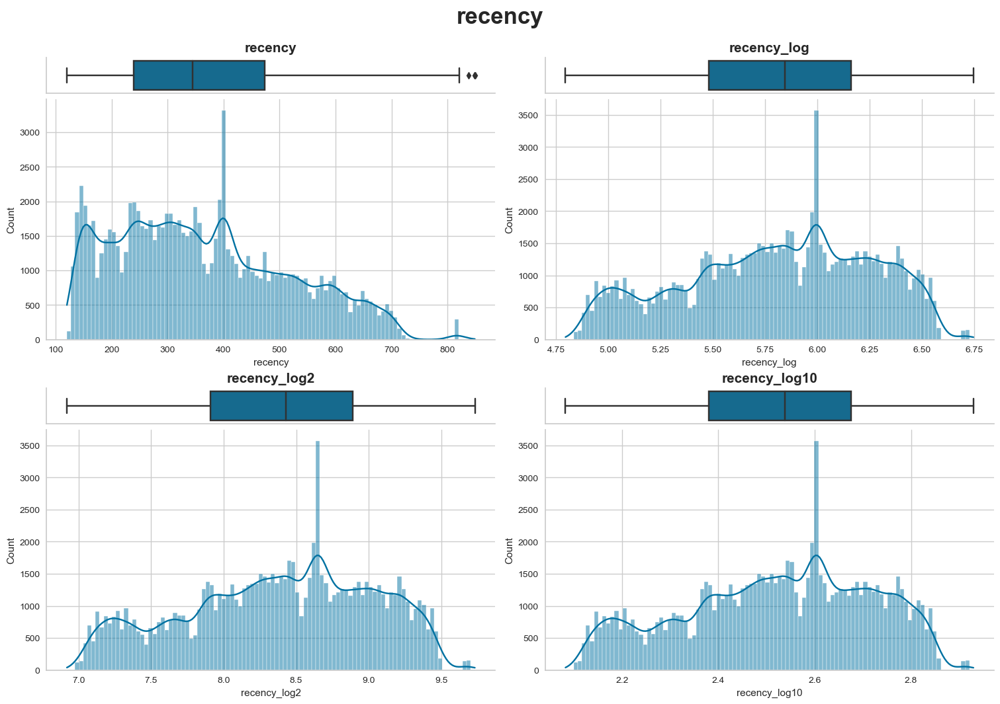

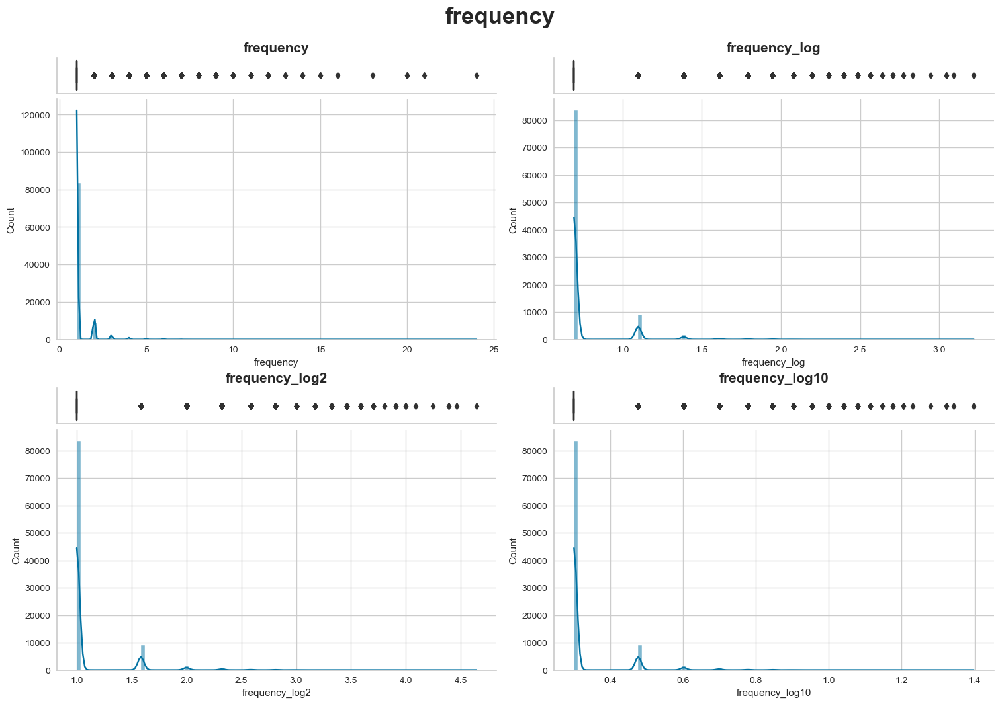

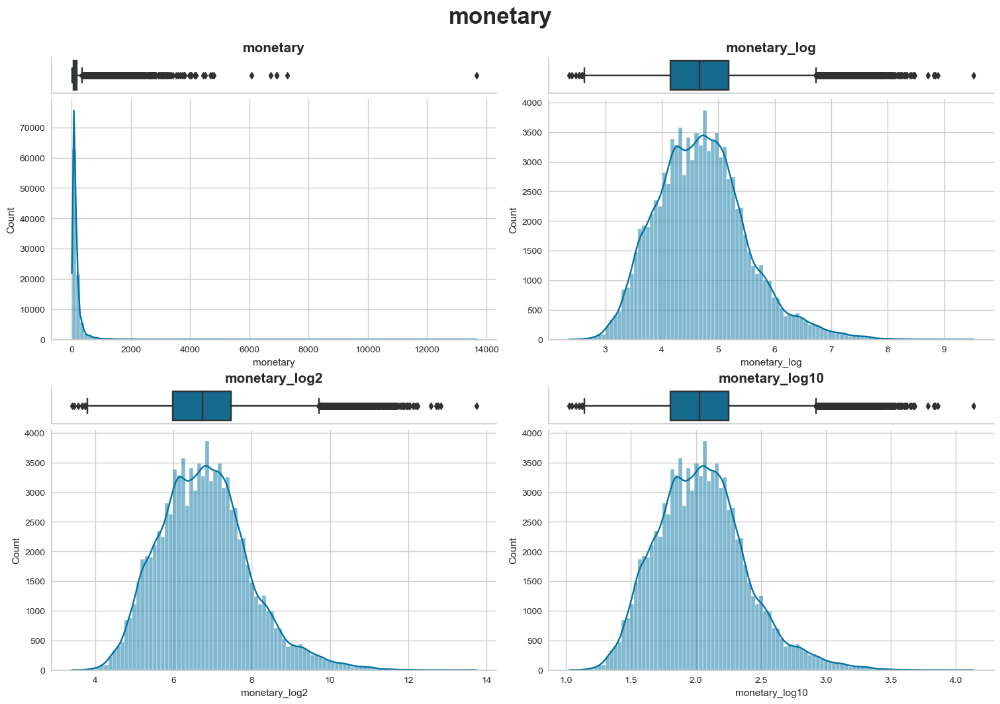

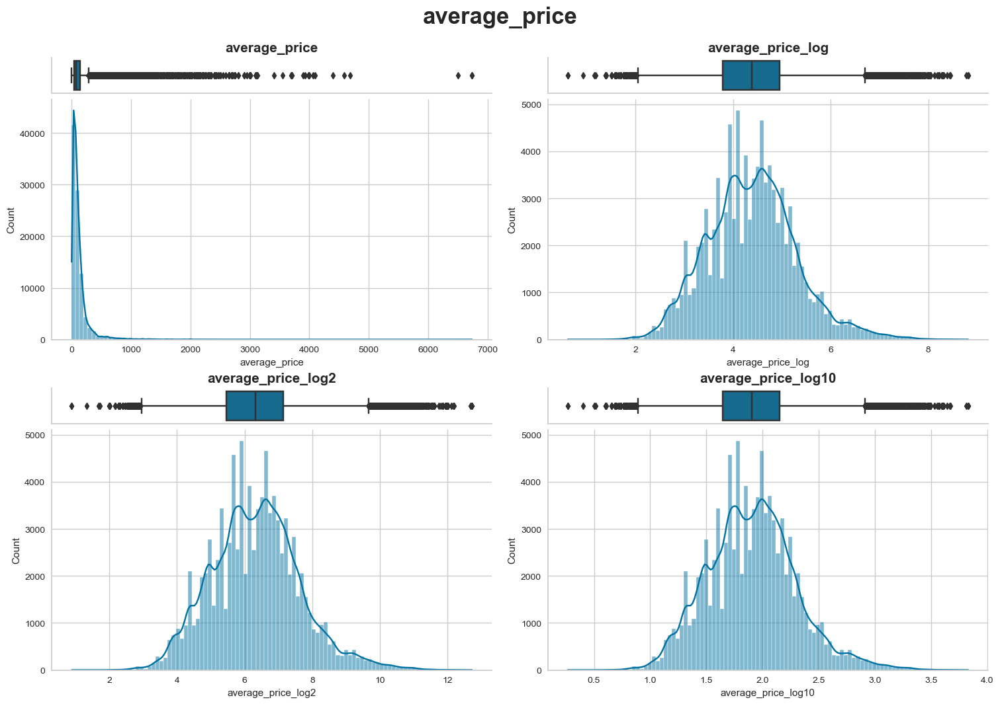

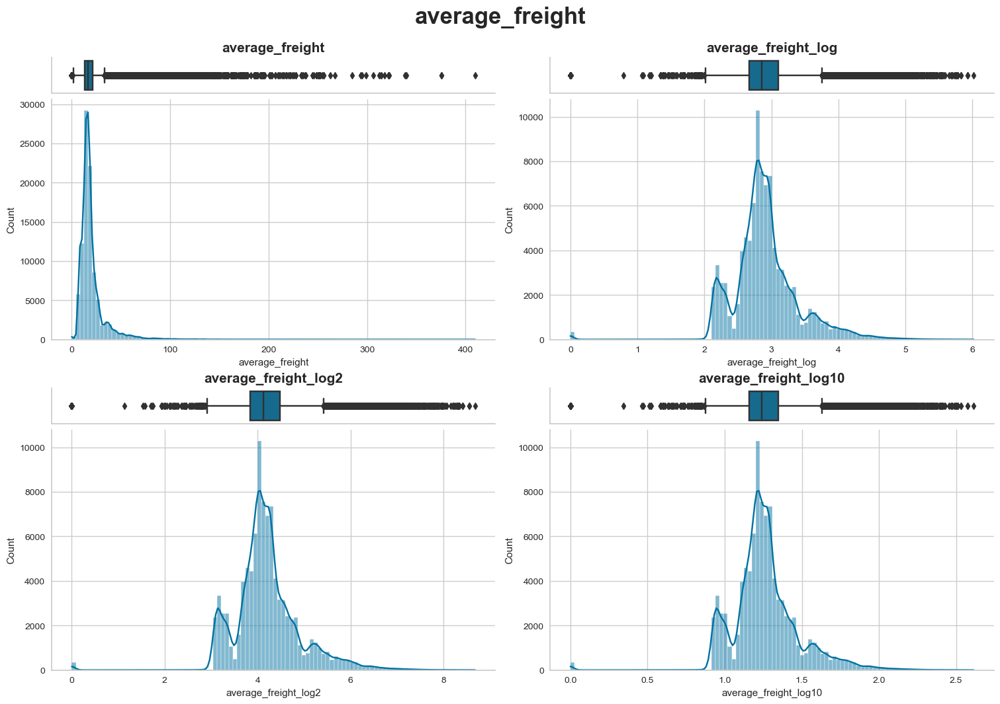

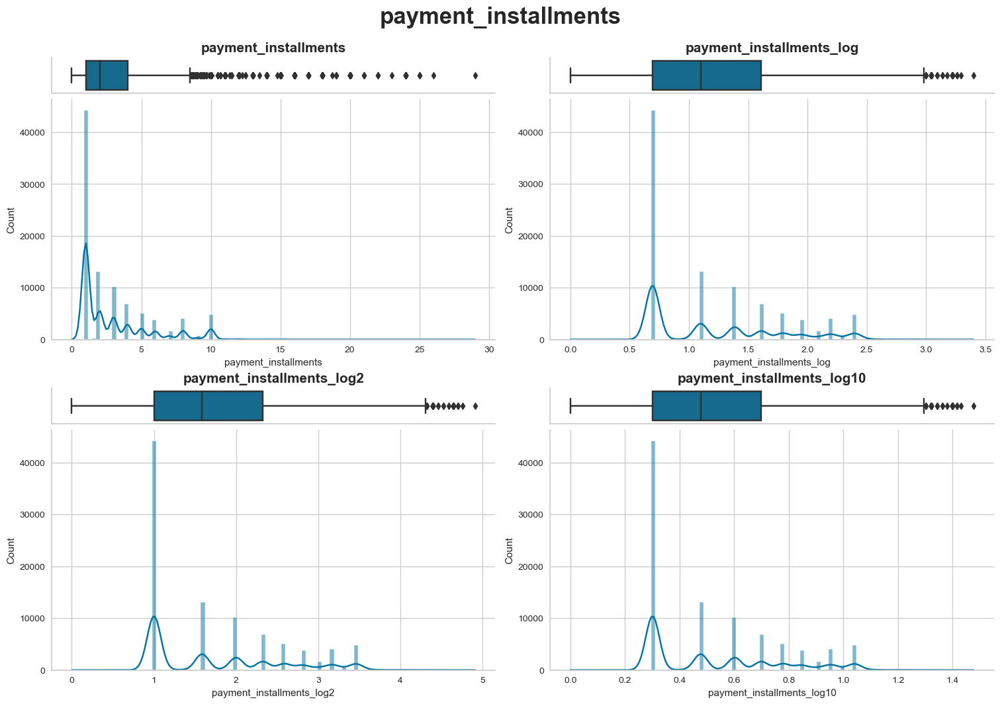

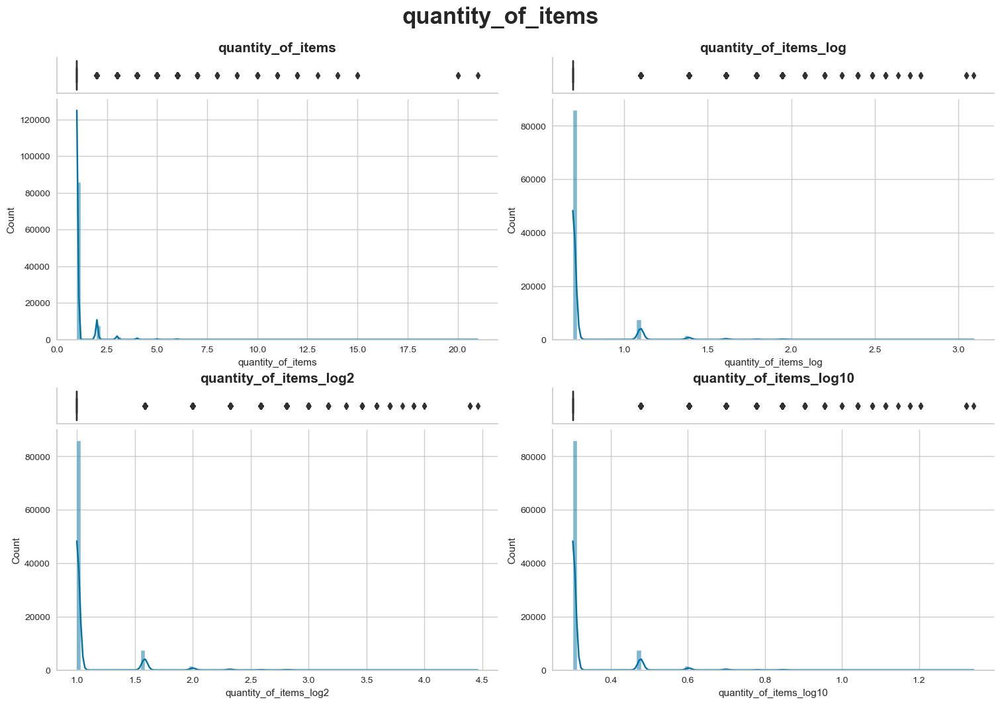

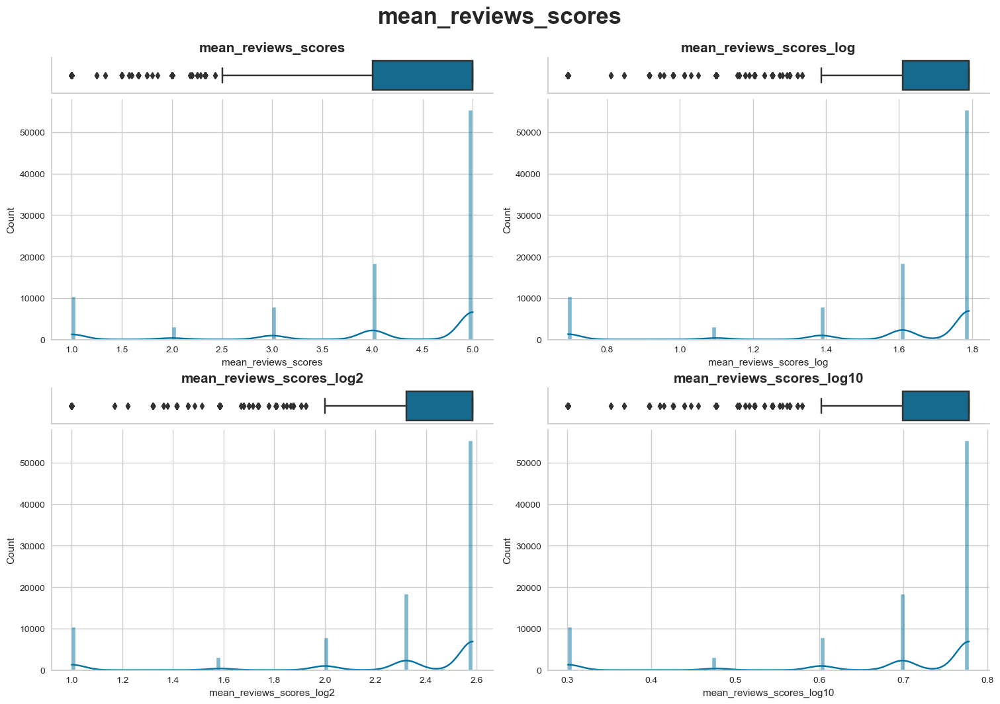

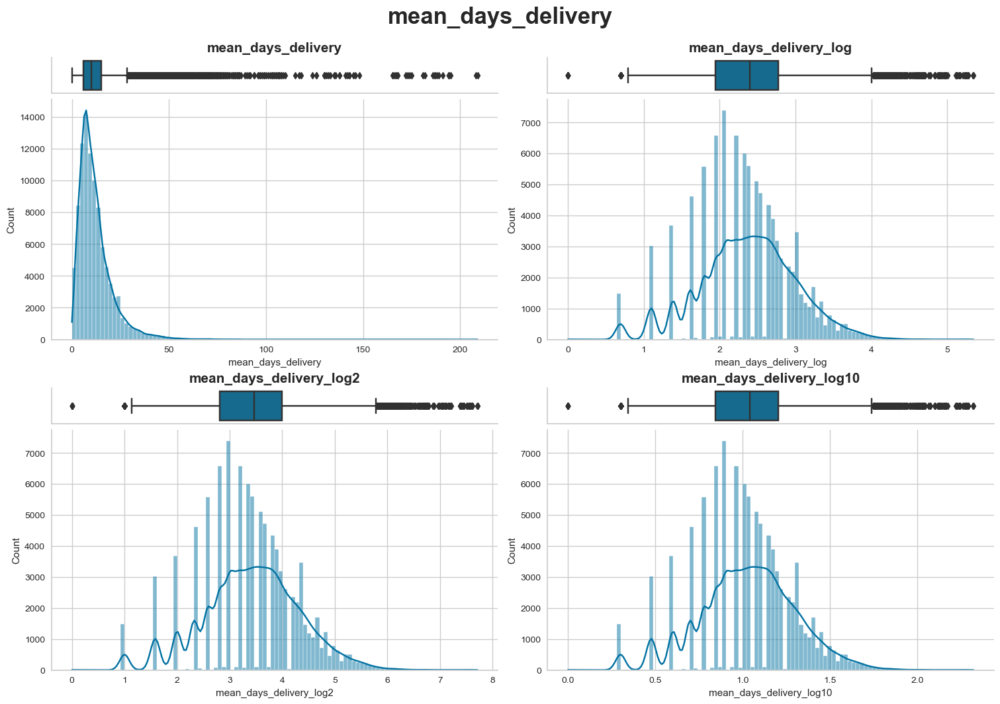

In [48]:
# Distributions 
columns = [ 'recency', 'frequency', 'monetary',
       'average_price', 'average_freight', 'payment_installments',
       'quantity_of_items', 'mean_reviews_scores', 'mean_days_delivery']
plot_distribution(cutomer_merged_df, columns)

In [49]:
msk = cutomer_merged_df['monetary'] > 2000
df__customer_test = cutomer_merged_df[msk]

In [50]:
df__customer_test

,customer_unique_id,recency,frequency,monetary,average_price,average_freight,payment_installments,quantity_of_items,mean_reviews_scores,mean_days_delivery,catg_construction,catg_electronics,catg_fashion,catg_furniture,catg_home,catg_others,catg_sports_leisure
259,00adeda9b742746c0c66e10d00ea1b74,420,2,2148.40,1039.25,34.95,10.0,2,1.0,7.0,0,0,2,0,0,0,0
292,00c07da5ba0e07b4f248a3a373b07476,158,1,2304.68,2258.00,46.68,10.0,1,5.0,14.0,0,0,0,0,0,1,0
422,011875f0176909c5cf0b14a9138bb691,654,1,4016.91,3999.90,17.01,8.0,1,5.0,5.0,0,0,1,0,0,0,0
992,02b6ef845021b8fefe19c8d200f3ee06,273,1,2024.31,1914.58,109.73,1.0,1,4.0,15.0,0,0,0,1,0,0,0
1039,02ccceb879088a0253e1e46e0200bdb8,145,1,2512.53,2338.08,174.45,1.0,1,4.0,6.0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94041,fc54c2c09aee36da48881e5bf37ef795,382,2,2732.06,1340.00,26.03,10.0,2,4.0,6.0,0,2,0,0,0,0,0
95046,ff0ae98646e7bbb41cf0f0d3991fef98,575,1,3048.27,2999.89,48.38,10.0,1,5.0,10.0,0,1,0,0,0,0,0
95131,ff4159b92c40ebe40454e3e6a7c35ed6,587,1,6726.66,6499.00,227.66,1.0,1,5.0,11.0,0,0,1,0,0,0,0
95407,fff5eb4918b2bf4b2da476788d42051c,183,6,2844.96,175.00,299.16,1.0,6,5.0,13.0,0,0,0,0,0,6,0


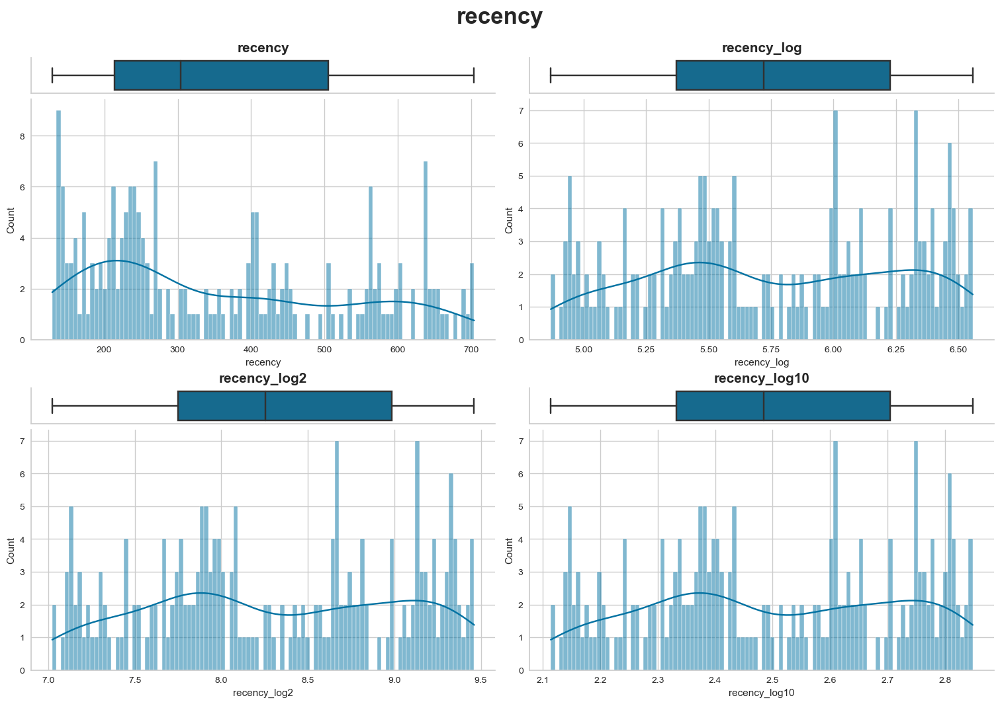

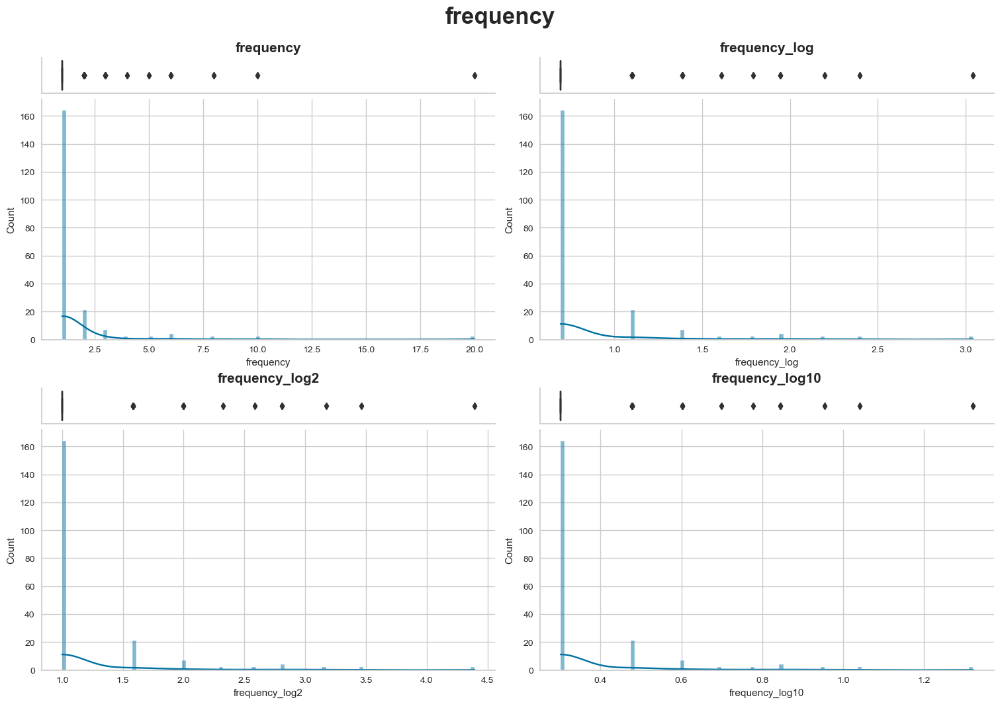

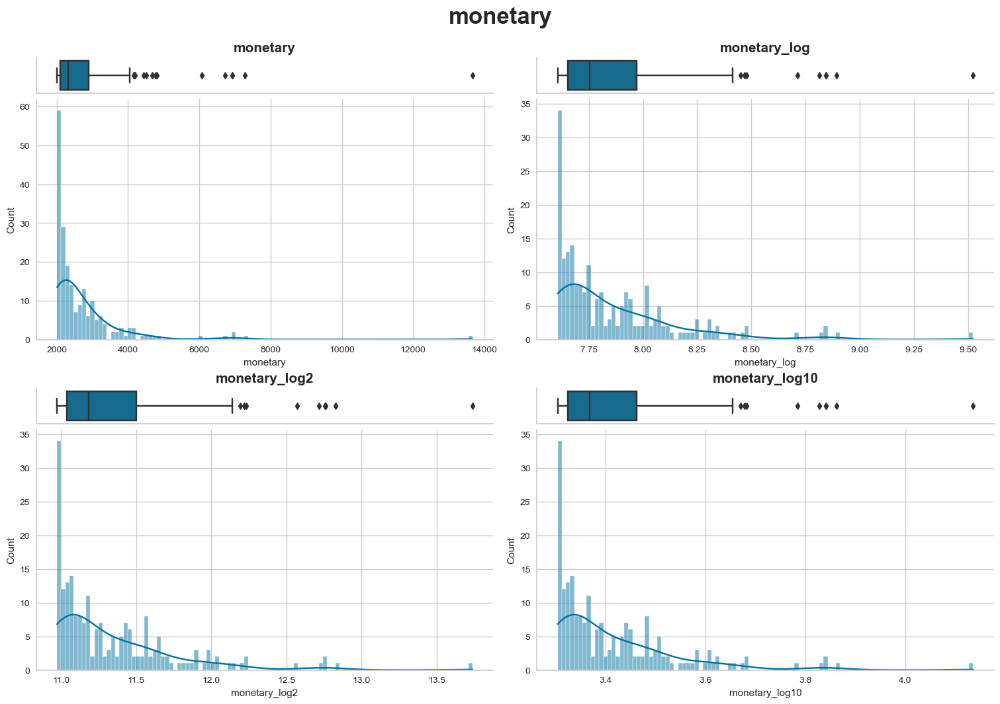

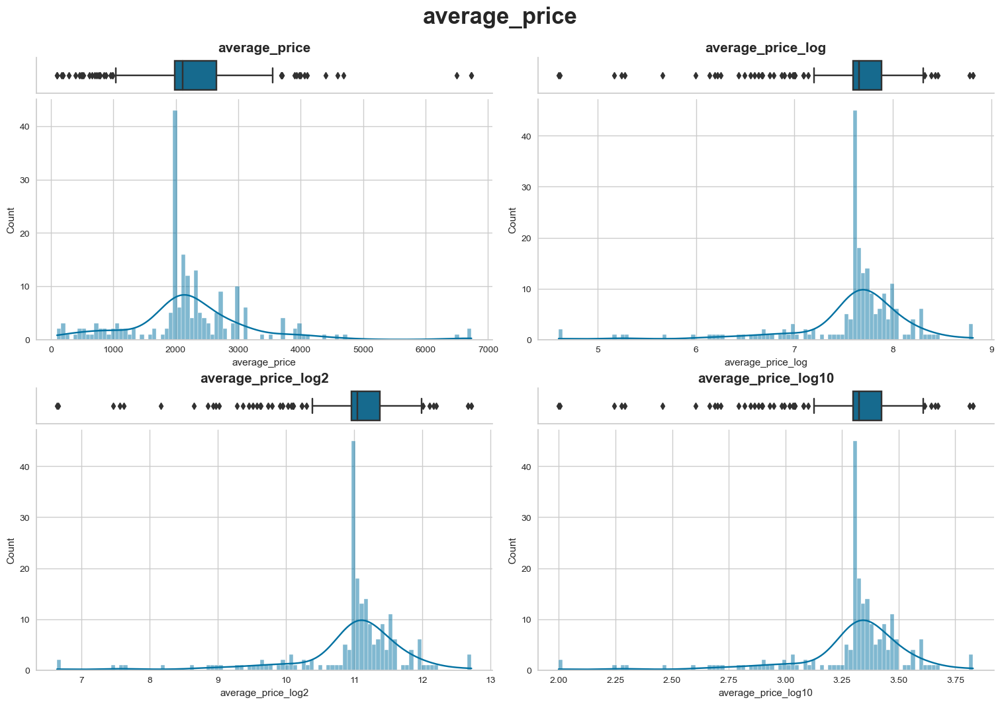

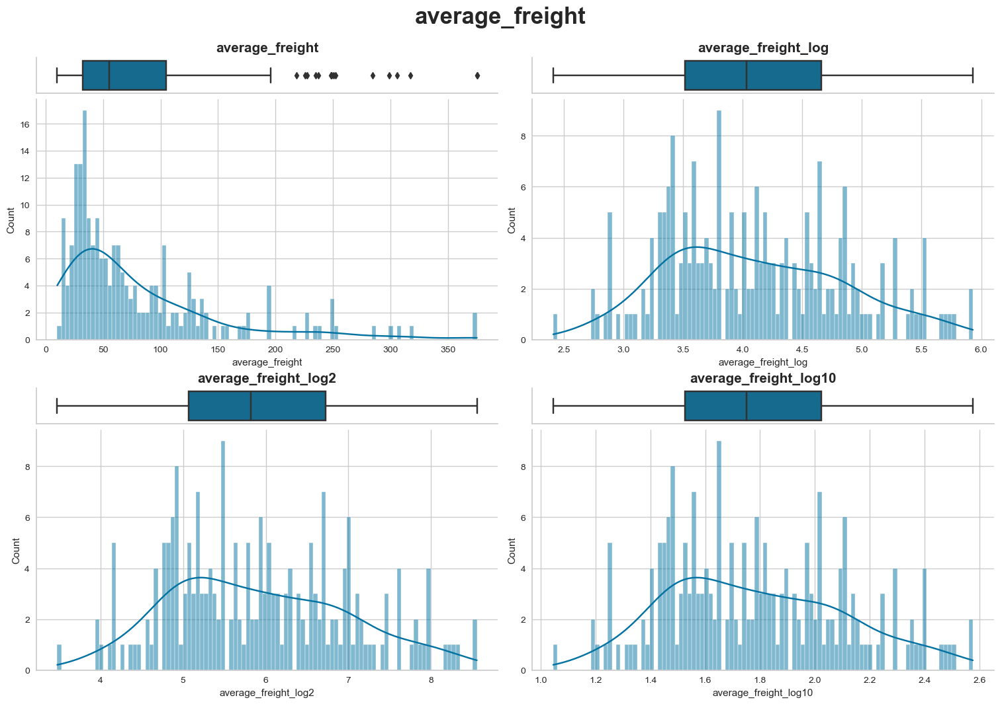

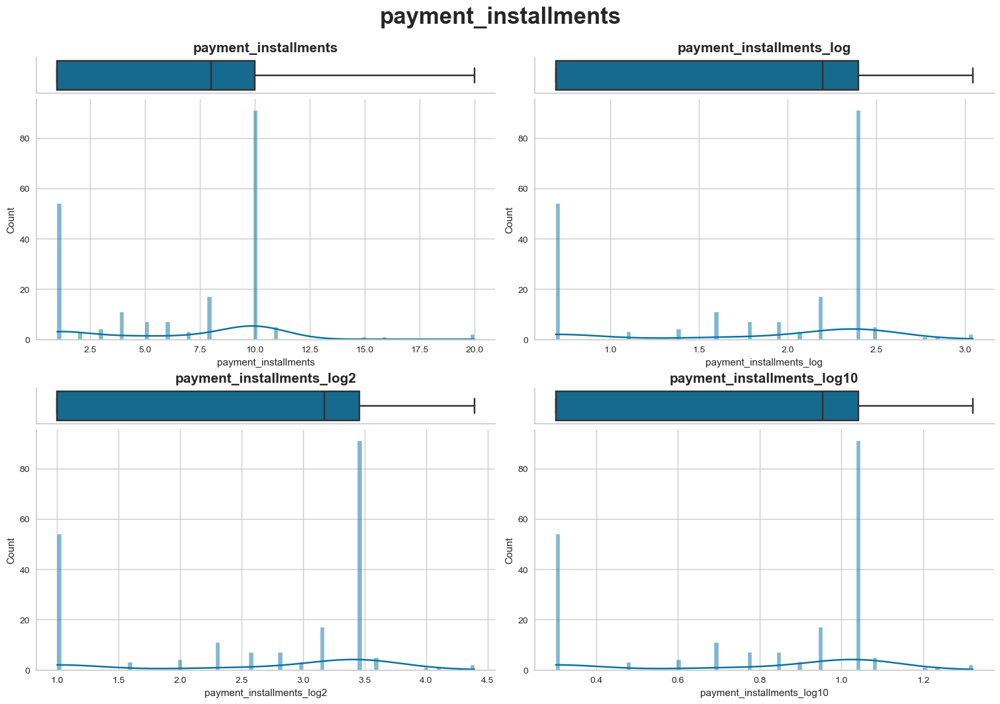

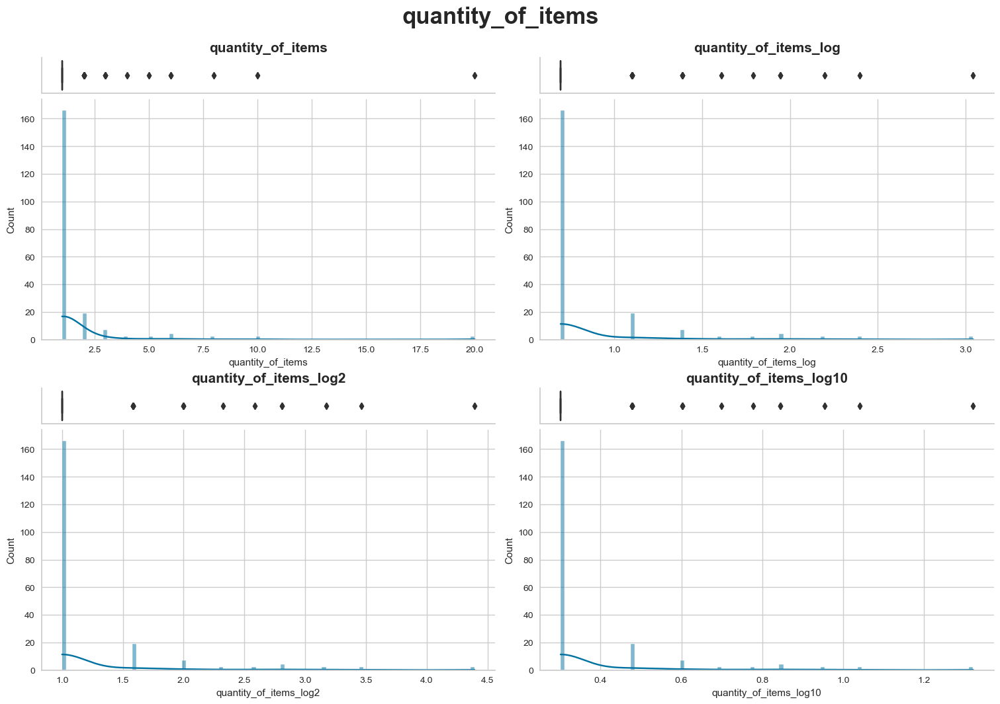

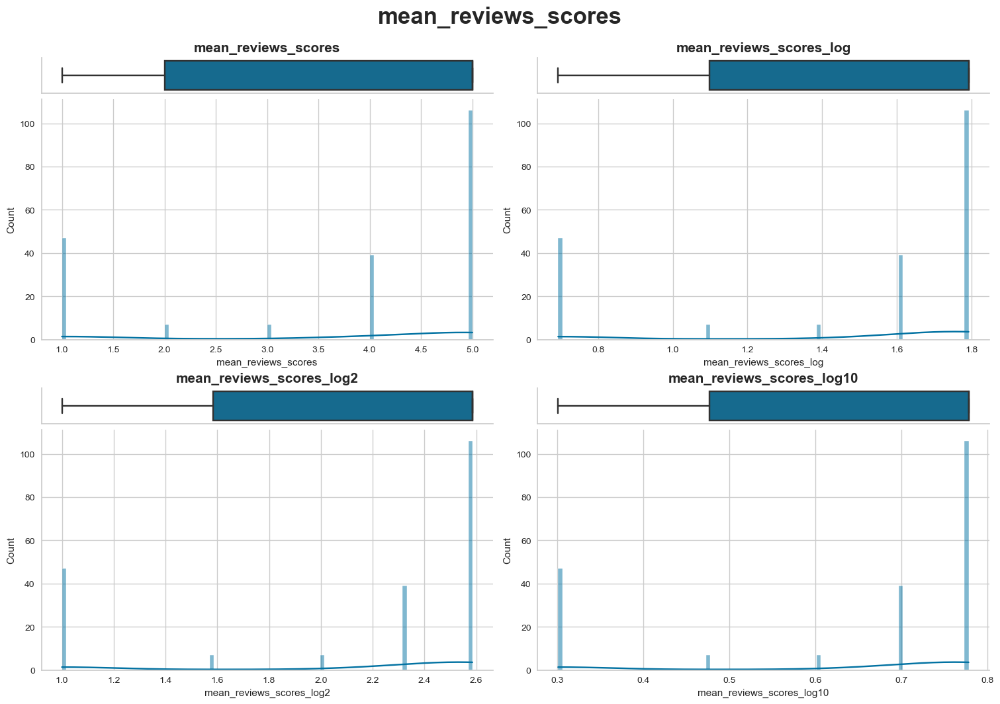

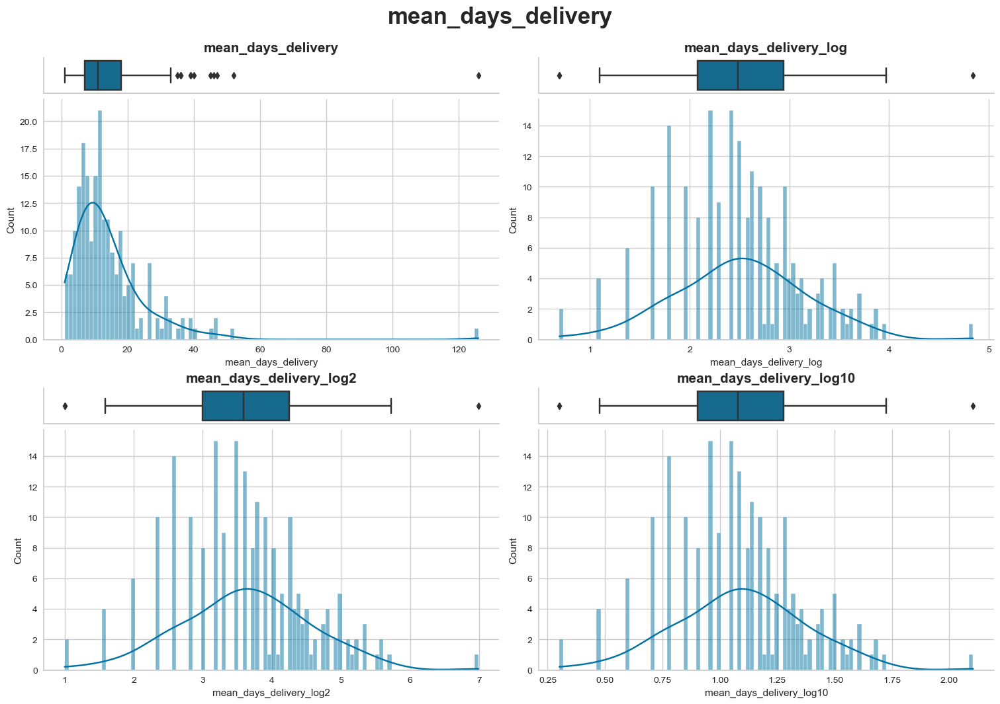

In [51]:
# Distributions 
columns = [ 'recency', 'frequency', 'monetary',
       'average_price', 'average_freight', 'payment_installments',
       'quantity_of_items', 'mean_reviews_scores', 'mean_days_delivery']
plot_distribution(df__customer_test, columns)

In [52]:

df = cutomer_merged_df
path = "./data/cleaned/"
filename = "cleaned_merged_customer_dataset.csv"
columns_to_save = list(cutomer_merged_df.columns)

# Save
save_transformed_df(df, path, filename, columns_to_save)

# **Clustering**

Nous divisons les données en plusieurs thématiques afin d'essayer plusieurs scénarios de segmentation : 

- rfm_columns : segmentation RFM.
- satisfaction : moyennes des satisfactions de chaque client.
- behavior : comportement d'achat.
- catégories : représente le nombre de fois que le client a acheté cette catégorie.

In [53]:
# Colonnes pour éxécuté une segmentation RFM
rfm_columns = ['recency', 'frequency', 'monetary']

# Colonne Satisfaction
satisfaction = ['mean_reviews_scores']

# Colonne comportement d'achat
behavior = ['payment_installments', 'quantity_of_items','mean_reviews_scores', 'mean_days_delivery']

# Catégories achetées : ici les catégories sont issues d'une réduction préalable dans le notebook 00_data
categories = ['catg_construction', 'catg_electronics', 'catg_fashion',
       'catg_furniture', 'catg_home', 'catg_others', 'catg_sports_leisure']

In [54]:
cleaned_merged_customer.head()

,customer_unique_id,recency,frequency,monetary,average_price,average_freight,payment_installments,quantity_of_items,mean_reviews_scores,mean_days_delivery,catg_construction,catg_electronics,catg_fashion,catg_furniture,catg_home,catg_others,catg_sports_leisure
0,0000366f3b9a7992bf8c76cfdf3221e2,236,1,141.90,129.90,12.00,8.0,1,5.0,6.0,0,0,0,1,0,0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,239,1,27.19,18.90,8.29,1.0,1,4.0,3.0,0,0,1,0,0,0,0
2,0000f46a3911fa3c0805444483337064,662,1,86.22,69.00,17.22,8.0,1,3.0,25.0,0,0,0,0,0,1,0
3,0000f6ccb0745a6a4b88665a16c9f078,446,1,43.62,25.99,17.63,4.0,1,4.0,20.0,0,1,0,0,0,0,0
4,0004aac84e0df4da2b147fca70cf8255,413,1,196.89,180.00,16.89,6.0,1,5.0,13.0,0,1,0,0,0,0,0


In [55]:
cleaned_merged_customer = cleaned_merged_customer.set_index('customer_unique_id')

<AxesSubplot:>

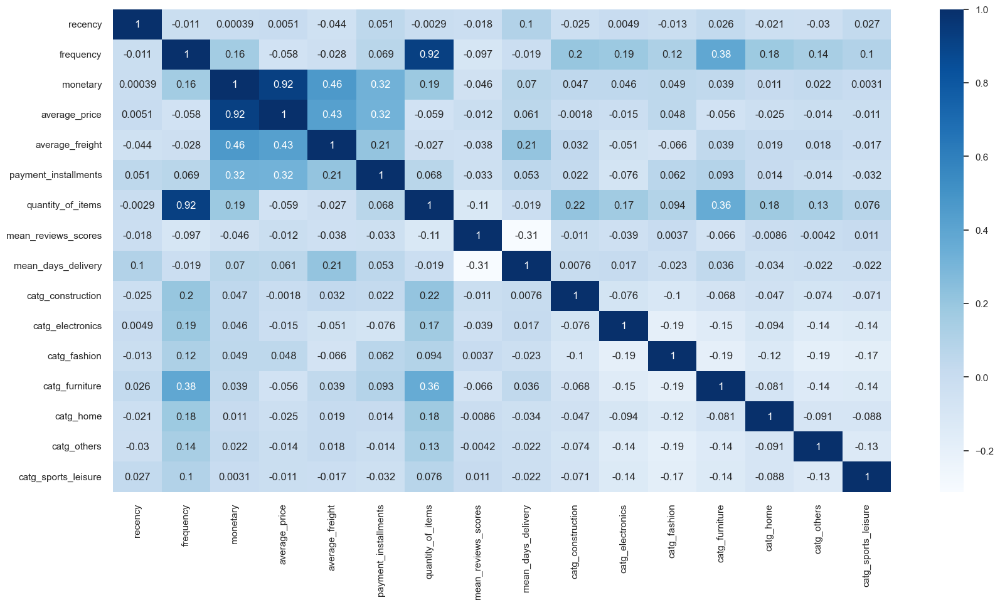

In [56]:
cor = cleaned_merged_customer.corr()
plt.figure(figsize=(20, 10))
sns.set(font_scale=1)
sns.heatmap(cor, annot=True, cmap=plt.cm.Blues)

In [57]:
#Code copié-Coller pour afficher les corrélation pair à pair 
# https://stackoverflow.com/questions/17778394/list-highest-correlation-pairs-from-a-large-correlation-matrix-in-pandas

threshold = 0.5
corr_1 = cor.unstack().sort_values(kind="quicksort")
strong_corr = (pd.DataFrame(corr_1[(abs(corr_1) > threshold)])
               .reset_index().rename(columns={0:'corr_coeff'}))
strong_corr = strong_corr[(strong_corr.index%2 == 0) & (strong_corr['level_0'] != strong_corr['level_1'])]
strong_corr.sort_values('corr_coeff', ascending=False)

,level_0,level_1,corr_coeff
2,monetary,average_price,0.921471
0,quantity_of_items,frequency,0.920873


Nous remarquons les corrélations suivantes : 

- Forte corrélation : (`quantity_of_items` vs `frequency` ; `avergae_price` vs `monetary`), ceci est dû au fait que les clients n'ont pas acheté plusieurs fois. 

# **Méthode RFM**

In [58]:
# 1er itération : avec les colonnes R,F,M
data_to_cluster = cleaned_merged_customer[rfm_columns]

In [59]:
data_to_cluster

,recency,frequency,monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,236,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,239,1,27.19
0000f46a3911fa3c0805444483337064,662,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,446,1,43.62
0004aac84e0df4da2b147fca70cf8255,413,1,196.89
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,572,2,2067.42
fffea47cd6d3cc0a88bd621562a9d061,387,1,84.58
ffff371b4d645b6ecea244b27531430a,693,1,112.46


## **RFM Score (manuellement)**

Dans cette partie nous utiliserons une segmentation manuelle, en suivant les exemples trouvés dans les liens suivants : 

- [https://www.actioniq.com/blog/what-is-rfm-analysis/](https://www.actioniq.com/blog/what-is-rfm-analysis/)
- [https://www.actioniq.com/blog/behavioral-segmentation-a-powerful-technique-for-modern-marketing-and-customer-experiences/](https://www.actioniq.com/blog/behavioral-segmentation-a-powerful-technique-for-modern-marketing-and-customer-experiences/)
- [https://documentation.bloomreach.com/engagement/docs/rfm-segmentation](https://documentation.bloomreach.com/engagement/docs/rfm-segmentation)

Projet Kaggle: 
- [https://www.kaggle.com/code/drindeng/detailed-rfm-analysis-and-k-means-clustering#Clustering-with-K-Means](https://www.kaggle.com/code/drindeng/detailed-rfm-analysis-and-k-means-clustering#Clustering-with-K-Means)



In [60]:
# Copie du df original
df_ = data_to_cluster.copy()

In [61]:
# Définir les bins pour la récence, la fréquence et la monetary
recency_bins = pd.qcut(df_['recency'], q=5, labels=[5, 4, 3, 2, 1])
frequency_bins = pd.qcut(df_['frequency'].rank(method="first"), 5, labels=[1, 2, 3, 4, 5])
monetary_bins = pd.qcut(df_['monetary'], q=5, labels=[1, 2, 3, 4, 5])

In [62]:
# Créer de nouvelles colonnes pour les scores RFM
df_['R'] = recency_bins
df_['F'] = frequency_bins
df_['M'] = monetary_bins

In [63]:
# Combinez les scores RFM dans une seule colonne
df_['RFM'] = df_['R'].astype(str) + df_['F'].astype(str) + df_['M'].astype(str)

In [64]:
df_.head()

,recency,frequency,monetary,R,F,M,RFM
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,236,1,141.90,4,1,4,414
0000b849f77a49e4a4ce2b2a4ca5be3f,239,1,27.19,4,1,1,411
0000f46a3911fa3c0805444483337064,662,1,86.22,1,1,3,113
0000f6ccb0745a6a4b88665a16c9f078,446,1,43.62,2,1,1,211
0004aac84e0df4da2b147fca70cf8255,413,1,196.89,2,1,4,214


In [65]:
# Affectation des ségments manuellement

seg_map= {
    r'111|112|121|131|141|151': 'Lost customers',
    r'332|322|233|232|223|222|132|123|122|212|211': 'Hibernating customers', 
    r'155|154|144|214|215|115|114|113': 'Cannot Lose Them',
    r'255|254|245|244|253|252|243|242|235|234|225|224|153|152|145|143|142|135|134|133|125|124': 'At Risk',
    r'331|321|312|221|213|231|241|251': 'About To Sleep',
    r'535|534|443|434|343|334|325|324': 'Need Attention',
    r'525|524|523|522|521|515|514|513|425|424|413|414|415|315|314|313': 'Promising',
    r'512|511|422|421|412|411|311': 'New Customers',
    r'553|551|552|541|542|533|532|531|452|451|442|441|431|453|433|432|423|353|352|351|342|341|333|323': 'Potential Loyalist',
    r'543|444|435|355|354|345|344|335': 'Loyal',
    r'555|554|544|545|454|455|445': 'Champions'
}

# Remplacement des segments 
df_['Segment'] = df_['RFM'].replace(seg_map, regex=True)


df_.head()

,recency,frequency,monetary,R,F,M,RFM,Segment
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,236,1,141.90,4,1,4,414,Promising
0000b849f77a49e4a4ce2b2a4ca5be3f,239,1,27.19,4,1,1,411,New Customers
0000f46a3911fa3c0805444483337064,662,1,86.22,1,1,3,113,Cannot Lose Them
0000f6ccb0745a6a4b88665a16c9f078,446,1,43.62,2,1,1,211,Hibernating customers
0004aac84e0df4da2b147fca70cf8255,413,1,196.89,2,1,4,214,Cannot Lose Them


In [66]:
# Code COpié : voir sources
RFMStats = df_[["Segment", "recency", "frequency", "monetary"]].groupby("Segment").agg(['mean','median', 'min', 'max', 'count'])

In [67]:
# Code COpié : voir sources
RFMStats['Ratio']= (100*RFMStats['monetary']["count"]/RFMStats['monetary']["count"].sum()).round(2)

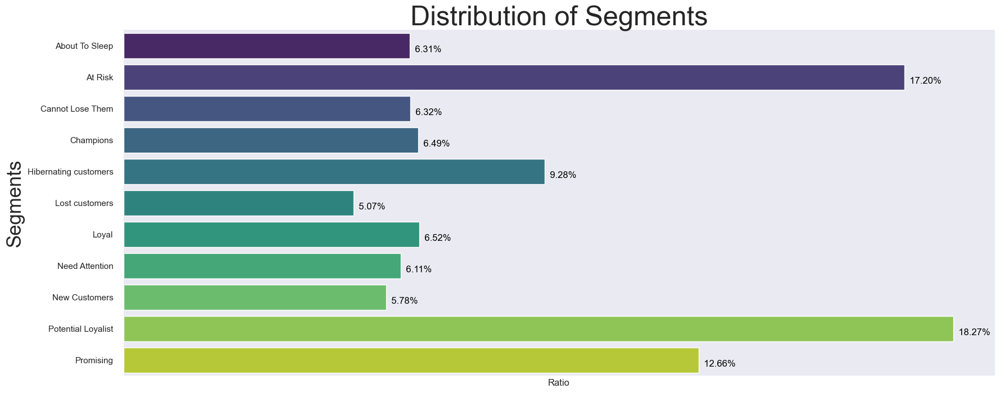

In [68]:
# Code COpié : voir sources
plt.figure(figsize=(20,8))
#plt.rc('font', size=20)
per= sns.barplot(x=RFMStats['Ratio'], y=RFMStats.index, data=RFMStats, palette="viridis")
sns.despine(bottom = True, left = True)
for i, v in enumerate(RFMStats['Ratio']):
    per.text(v, i+.20,"  {:.2f}".format(v)+"%", color='black', ha="left")
per.set_ylabel('Segments', fontsize=25)
per.set(xticks=[])
plt.title('Distribution of Segments', fontsize=35)
plt.show()

### over time

Regardons à présent l'évolution de la taille des ségments sur plusieurs périodes données

### generalisation

Pour ce faire, commençons par construire une fonction, qui généralisera la construction d'un data frame RFM sur plusieurs périodes de temps : 

In [69]:
cleaned_customers_orders_payments.head()

,customer_unique_id,order_id,customer_id,order_status,time_to_delivery,days_to_delivery,day_of_week_purchase,time_purchase,estimated_days_to_delivery,order_purchase_timestamp,order_item_id,product_id,price,freight_value,product_category_name_english,product_category_name,payment_installments,payment_value,product_category,review_score
0,7c396fd4830fd04220f754e42b4e5bff,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,8 days 10:28:40,8,Monday,10,15,2017-10-02 10:56:33,1,87285b34884572647811a353c7ac498a,29.99,8.72,housewares,utilidades_domesticas,3.0,38.71,home,4.0
1,3a51803cc0d012c3b5dc8b7528cb05f7,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2 days 20:15:12,2,Tuesday,18,12,2017-08-15 18:29:31,1,87285b34884572647811a353c7ac498a,29.99,7.78,housewares,utilidades_domesticas,3.0,37.77,home,4.0
2,ef0996a1a279c26e7ecbd737be23d235,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,5 days 00:05:14,5,Wednesday,18,12,2017-08-02 18:24:47,1,87285b34884572647811a353c7ac498a,29.99,7.78,housewares,utilidades_domesticas,1.0,37.77,home,5.0
3,e781fdcc107d13d865fc7698711cc572,bfc39df4f36c3693ff3b63fcbea9e90a,53904ddbea91e1e92b2b3f1d09a7af86,delivered,14 days 18:38:13,14,Monday,23,20,2017-10-23 23:26:46,1,87285b34884572647811a353c7ac498a,29.99,14.10,housewares,utilidades_domesticas,1.0,44.09,home,3.0
4,af07308b275d755c9edb36a90c618231,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,13 days 18:46:08,13,Tuesday,20,19,2018-07-24 20:41:37,1,595fac2a385ac33a80bd5114aec74eb8,118.70,22.76,perfumery,perfumaria,1.0,141.46,fashion,4.0


In [70]:
# La fonction suivante, généralise les étapes qu'on a vues précédemment 

from functools import reduce

def rfm_df_generator(customer_df=None, col_date=None, datetime_refs=None, id_=None, price_col=None, seg_map=None):
    
    
    
    #Initialisation du df à retourner
    df = pd.DataFrame()
    
    
    #Boucle sur les dates de références
    for ref in datetime_refs:
        
        #Copie du data frame clients
        df_ = customer_df.copy()
        
        # Vérification du typage de  la colonne col_date 
        df_[col_date] = pd.to_datetime(df_[col_date])
        
        #Séléction des lignes 
        df_ = df_[df_[col_date] < ref]
        
        # Recency : 
        recency_df = calculate_recency(df_, col_date, id_, ref)
        
        # Frequency : 
        frequecy_df = calculate_frequency(df_, id_)
        
        # Monetary : 
        monetary_df = calculate_monetary(df_, id_, price_col)
        
        # list of dataframes to merge
        dfs_to_merge = [recency_df, frequecy_df, monetary_df]

        # merge the dataframes on the 'customer_unique_id' column
        rfm_df = reduce(lambda left, right: pd.merge(left, right, on=id_), dfs_to_merge)
                
        #RFM for ref periode
        rfm_df['datetime_ref'] = ref


        #RFM Scores and segmentation
        recency_bins = pd.qcut(rfm_df['recency'], q=5, labels=[5, 4, 3, 2, 1])
        frequency_bins = pd.qcut(rfm_df['frequency'].rank(method="first"), q=5, labels=[1, 2, 3, 4, 5])
        monetary_bins = pd.qcut(rfm_df['monetary'], q=5, labels=[1, 2, 3, 4, 5])

        # Create new columns for the RFM scores
        rfm_df['R'] = recency_bins
        rfm_df['F'] = frequency_bins
        rfm_df['M'] = monetary_bins

        # Combine the RFM scores into a single column
        rfm_df['RFM'] = rfm_df['R'].astype(str) + rfm_df['F'].astype(str) + rfm_df['M'].astype(str)

        # Remplacement des segments 
        rfm_df['Segment'] = rfm_df['RFM'].replace(seg_map, regex=True)
        df = pd.concat([df, rfm_df])
        
    return df

#### Exemple

In [71]:
# Initialisation des paramètres : 

#----Colonne date d'achat---------:
col_date = 'order_purchase_timestamp'

#-----Colonne Id_Client---:
id_ = 'customer_unique_id'

#----Colonne prix----:
price_col = 'payment_value'

# Déterminer les datetime de référence  pour l'analyse RFM
datetime_refs = [ 
                 dt.datetime(2016, 12, 31), 
                 dt.datetime(2017, 6, 30),
                 dt.datetime(2017, 12, 31),
                 dt.datetime(2018, 6, 30),
                 dt.datetime(2018, 12, 31)
                ]

#----Attribution des ségments--------:

seg_map= {
    r'111|112|121|131|141|151': 'Lost customers',
    r'332|322|233|232|223|222|132|123|122|212|211': 'Hibernating customers', 
    r'155|154|144|214|215|115|114|113': 'Cannot Lose Them',
    r'255|254|245|244|253|252|243|242|235|234|225|224|153|152|145|143|142|135|134|133|125|124': 'At Risk',
    r'331|321|312|221|213|231|241|251': 'About To Sleep',
    r'535|534|443|434|343|334|325|324': 'Need Attention',
    r'525|524|523|522|521|515|514|513|425|424|413|414|415|315|314|313': 'Promising',
    r'512|511|422|421|412|411|311': 'New Customers',
    r'553|551|552|541|542|533|532|531|452|451|442|441|431|453|433|432|423|353|352|351|342|341|333|323': 'Potential Loyalist',
    r'543|444|435|355|354|345|344|335': 'Loyal',
    r'555|554|544|545|454|455|445': 'Champions'
}

In [72]:
# Application

df = rfm_df_generator(customer_df= cleaned_customers_orders_payments, 
                      col_date= col_date, 
                      datetime_refs= datetime_refs, 
                      id_= id_, 
                      price_col= price_col,
                     seg_map= seg_map)

In [73]:
df

,customer_unique_id,recency,frequency,monetary,datetime_ref,R,F,M,RFM,Segment
0,0032c76b20340da25249092a268ce66c,86,1,144.94,2016-12-31,3,1,4,314,Promising
1,01f156677184504063bd19739f924af1,82,1,784.80,2016-12-31,5,1,5,515,Promising
2,0313291a6f4f16df04dcf819d88c38ef,83,1,112.78,2016-12-31,5,1,3,513,Promising
3,0636d30c77f0f9cfad81f1c9b58c791f,84,1,971.96,2016-12-31,4,1,5,415,Promising
4,0659f2d6cabae94afd4d009c6d0e07dc,83,2,459.14,2016-12-31,5,5,5,555,Champions
...,...,...,...,...,...,...,...,...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,571,2,2067.42,2018-12-31,1,5,5,155,Cannot Lose Them
95416,fffea47cd6d3cc0a88bd621562a9d061,386,1,84.58,2018-12-31,3,5,2,352,Potential Loyalist
95417,ffff371b4d645b6ecea244b27531430a,692,1,112.46,2018-12-31,1,5,3,153,At Risk
95418,ffff5962728ec6157033ef9805bacc48,243,1,133.69,2018-12-31,4,5,4,454,Champions


In [74]:
segment_sizes = df.groupby(['datetime_ref', 'Segment']).size().reset_index(name='Size')
segment_sizes.head(20)

,datetime_ref,Segment,Size
0,2016-12-31,About To Sleep,19
1,2016-12-31,At Risk,59
2,2016-12-31,Cannot Lose Them,15
3,2016-12-31,Champions,23
4,2016-12-31,Hibernating customers,25
5,2016-12-31,Lost customers,6
6,2016-12-31,Loyal,20
7,2016-12-31,Need Attention,20
8,2016-12-31,New Customers,25
9,2016-12-31,Potential Loyalist,61


### Visualisations des clusters

À présent, nous visualisons les tailles des segments pour chaque période : 

Text(0.5, 1.0, 'Segment sizes over time')

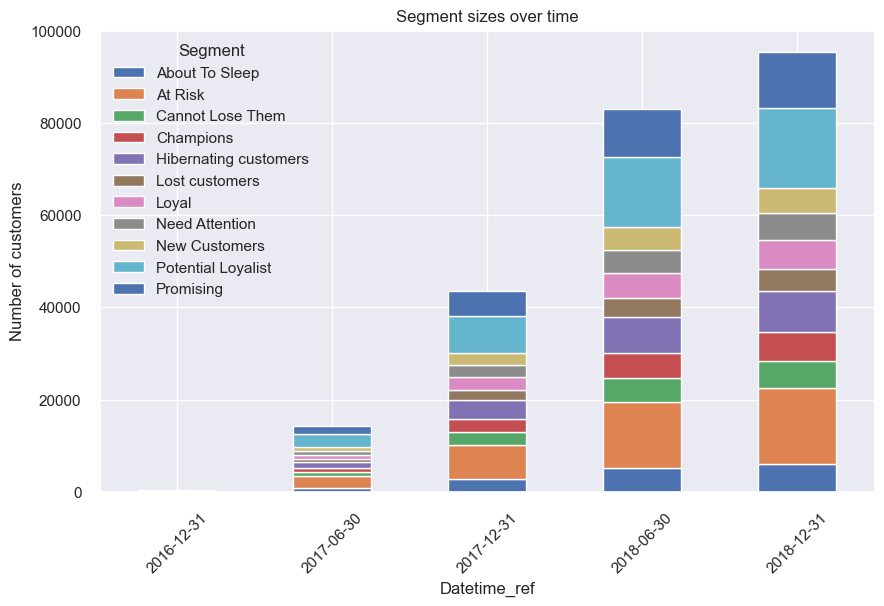

In [75]:
segment_sizes_pivot = segment_sizes.pivot(index='datetime_ref', columns='Segment', values='Size')
labesls = ['2016-12-31', '2017-06-30', '2017-12-31', '2018-06-30','2018-12-31']
ax = segment_sizes_pivot.plot(kind='bar', stacked=True, figsize=(10, 6))
ax.set_xlabel('Datetime_ref')
ax.set_xticklabels(labesls, rotation=45)
ax.set_ylabel('Number of customers')
ax.set_title('Segment sizes over time')


##  **K-means**

<span style="font-size:15px;">Le clustering K-means est un algorithme d'apprentissage non supervisé qui divise un ensemble de données en k clusters, où k est le nombre de clusters spécifié par le chercheur. Le but de l'algorithme est de minimiser la somme des distances au carré entre les points d'un cluster et le centroïde du cluster.

### Préparation des données

In [76]:
# Préparation des données pour le clustering avec différents Algo : 

#---Data Scaled------: 
# data_scaled

#-----Sample data scaled----: 
# data_sample avec n = 10000 Clients

#----Transformation-----: 
# Nous utiliserons un StandarScaler() : transformer = 'standard'
#                     MinMaxScaler()  : transformer = 'minmax'
#                     RobustScaler()  : transformer = 'robust'

#----Inverse_transform-----: 
# La fonction nous permet aussi de récupérer l'inverse de la transformation avec inverse_transform = True
# Ne pas oublier d'ajouter data_origine dans les return

data_scaled, data_sample = scale_transform_sample(data_to_cluster, n= 10000, transformer="standard", inverse_transform=False)

### Choix du nombre de clusters

#### Elbow method avec visualiseur : KElbowVisualizer

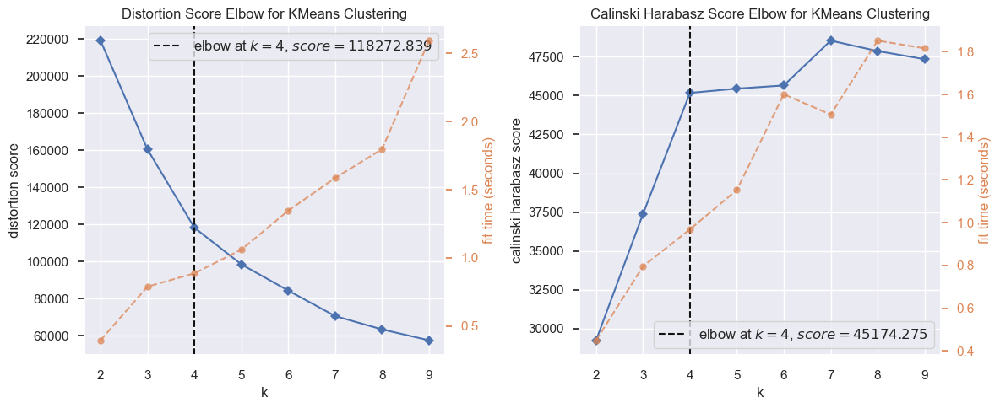

In [77]:
plot_Elbow_CalinskiHarabasz(data_scaled)

#### silhouette_score

##### Méthode 01

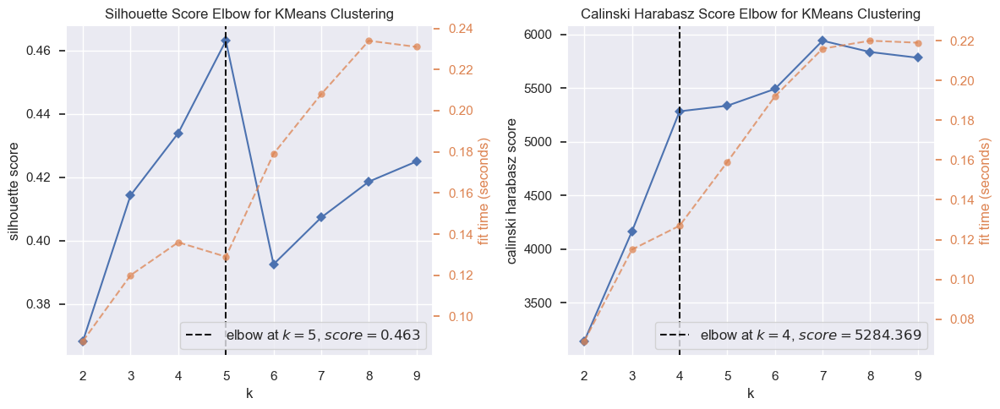

In [78]:
silhouette_score_visualisation(data_sample)

***
Contrairement à l'inertie, les valeurs plus grandes sont meilleures car elles indiquent que le point est plus éloigné des clusters voisins


L'épaisseur de chaque silhouette indique la taille du cluster.

La forme de chaque silhouette indique la « qualité » des points de chaque groupe.

La longueur (ou la surface) de chaque silhouette indique la qualité de chaque cluster.
***


##### Méthode 02

***
Ici nous, implimentons une autre méthode pour analyser les silhouettes de chaque cluster, et interpréter le changement du nombre de clusters
***

For n_clusters = 2, the average silhouette score is : 0.3682413808213161


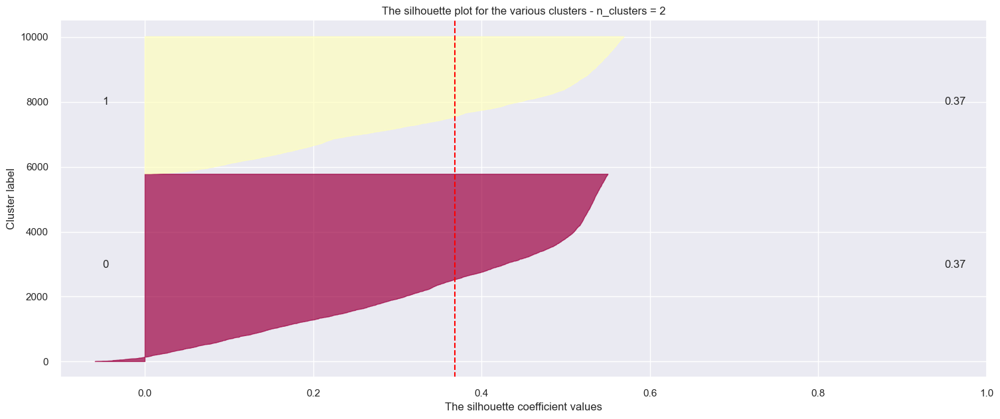

For n_clusters = 3, the average silhouette score is : 0.41429701173718714


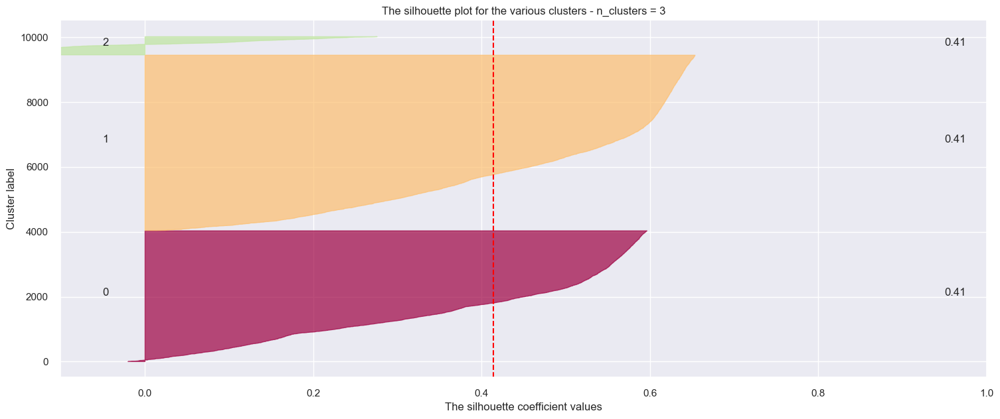

For n_clusters = 4, the average silhouette score is : 0.4339003289955361


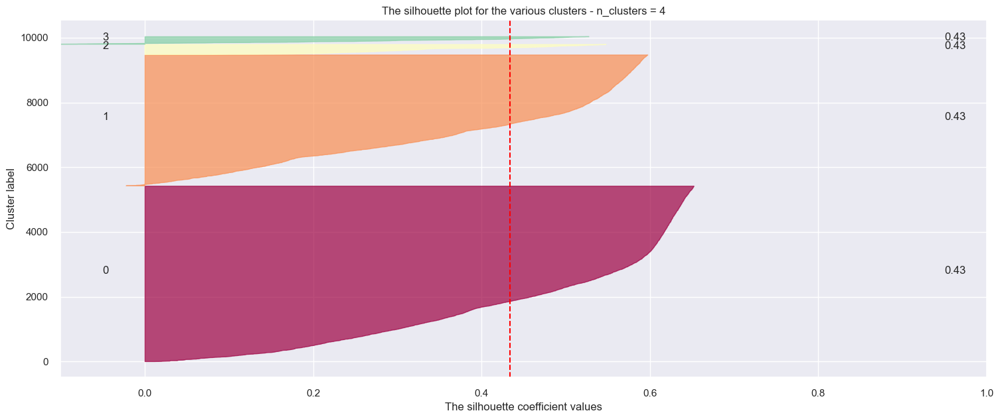

For n_clusters = 5, the average silhouette score is : 0.46307702578867865


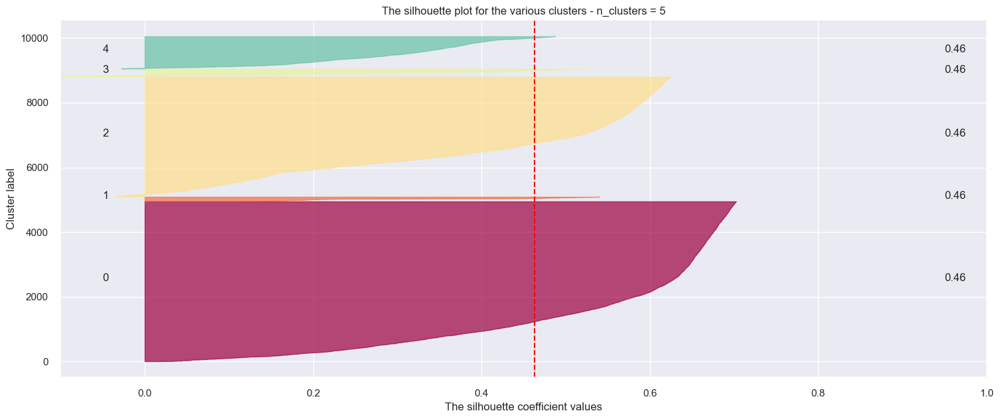

For n_clusters = 6, the average silhouette score is : 0.4735288983830043


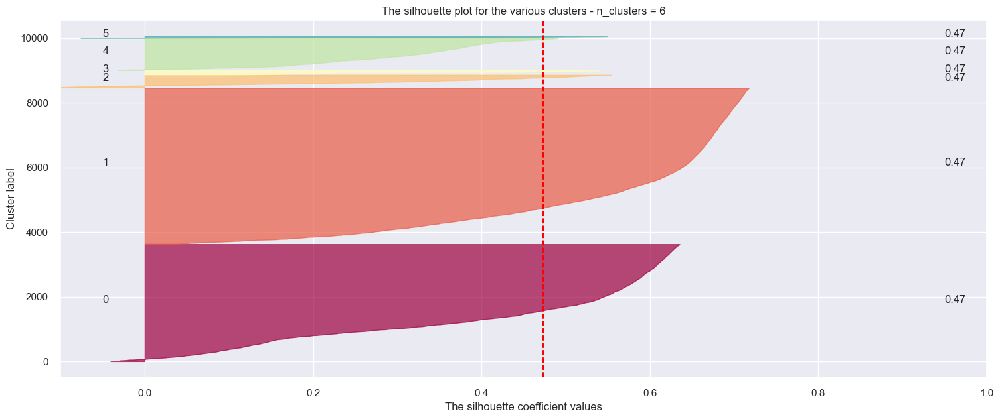

For n_clusters = 7, the average silhouette score is : 0.4073709183060222


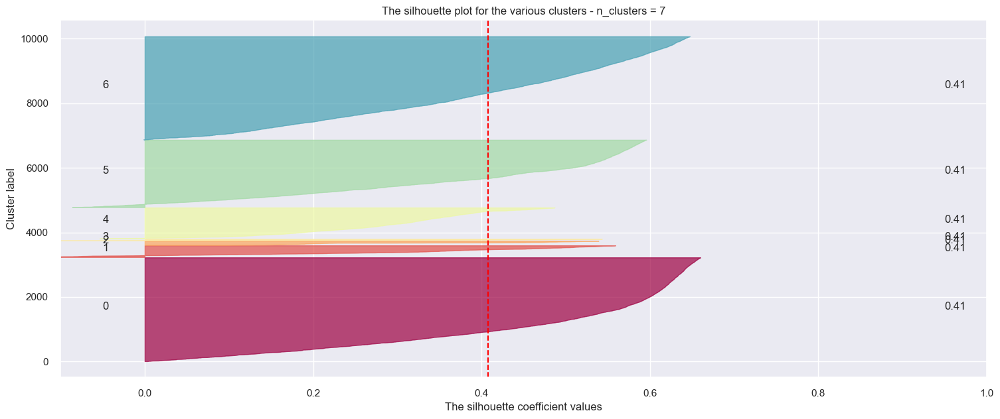

For n_clusters = 8, the average silhouette score is : 0.41943856826390274


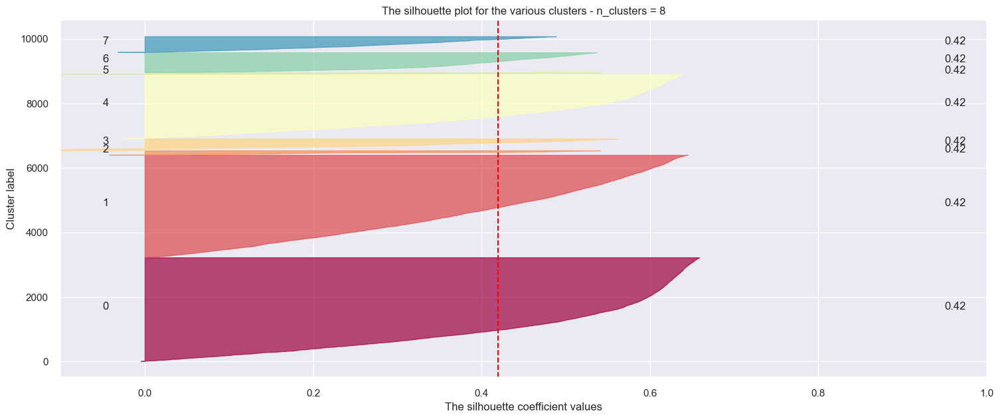

In [79]:
# Range of k values to test
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]
plot_slihouette_score(data_sample, range_n_clusters)

For n_clusters = 4 The average silhouette_score is : 0.4339151595289475
For n_clusters = 5 The average silhouette_score is : 0.46306171639677407
For n_clusters = 6 The average silhouette_score is : 0.47351780834371676
For n_clusters = 7 The average silhouette_score is : 0.40730288579850393


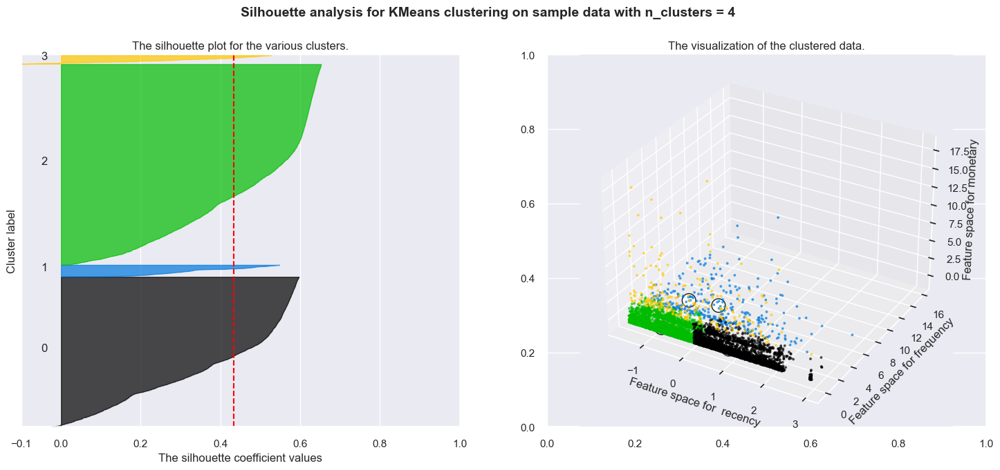

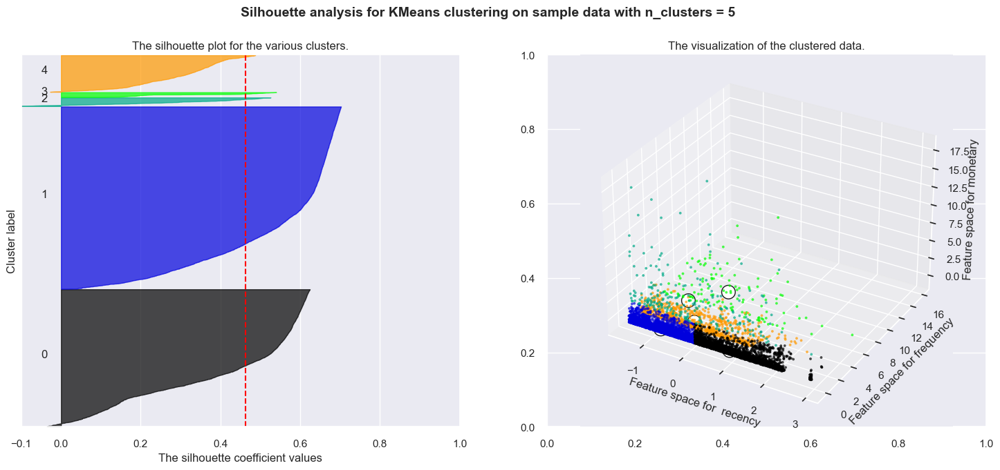

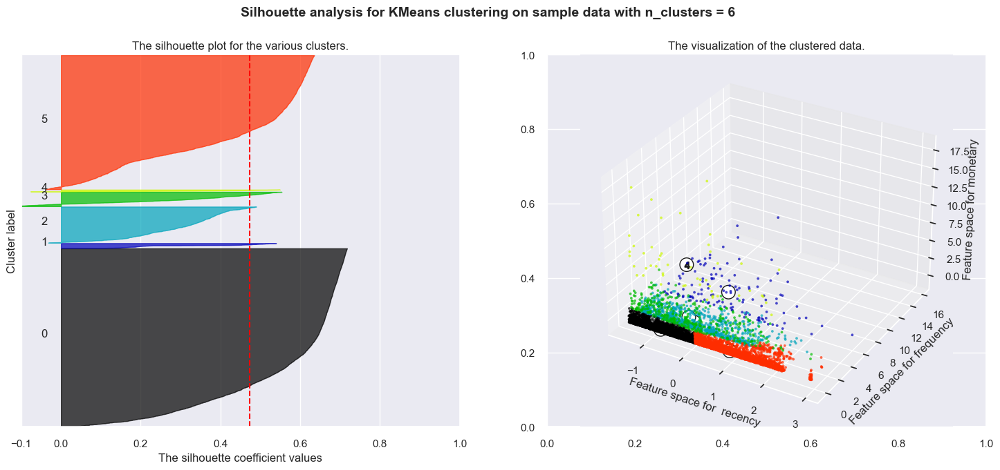

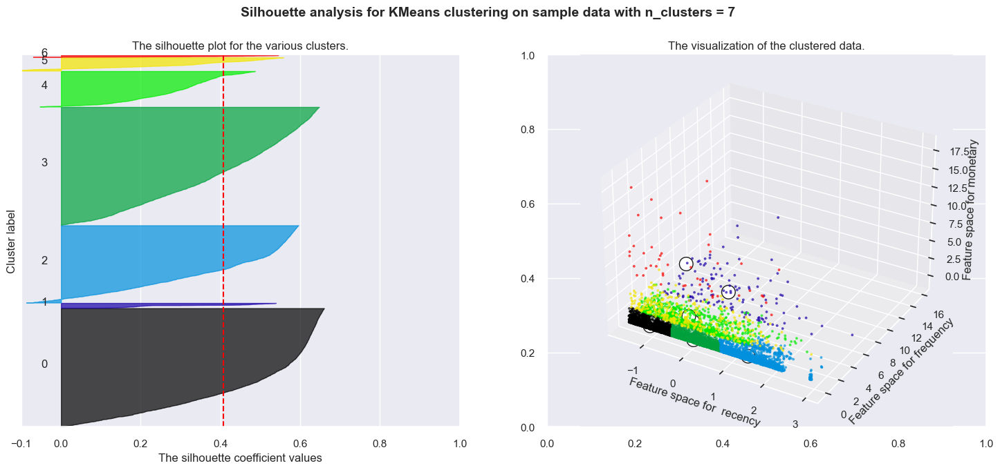

In [80]:
range_n_clusters = [ 4, 5, 6, 7 ]
sample = data_sample
col1 = 'recency'
col2 = 'frequency'
col3 = 'monetary'

slihouette_plot(range_n_clusters, sample, col1, col2, col3)

#### Optimisation des hyperparametrs : 

J'ai décidé ici de réaliser une sorte de GridSearchCV manuellement afin de détecter s'il existe des changements dans la performance de l'algorithme K-means (cette étape prend beaucoup de temps vu le nombre de paramètre à tester) à la fin de l'analyse j'ai construit un data frame qui regroupe les résultats de cette analyse.

Les résultats sont ensuite enregistrés dans le sous-dossier `data/results`

In [81]:
# Parameters à tester
# ----------

# n_clusters : int, default=8
#     The number of clusters to form as well as the number of
#     centroids to generate.

# init : {'k-means++', 'random'}, callable or array-like of shape             (n_clusters, n_features), default='k-means++'
#     Method for initialization:

#     'k-means++' : selects initial cluster centers for k-mean
#     clustering in a smart way to speed up convergence. See section
#     Notes in k_init for more details.

#     'random': choose `n_clusters` observations (rows) at random from data
#     for the initial centroids.

#     If an array is passed, it should be of shape (n_clusters, n_features)
#     and gives the initial centers.

#     If a callable is passed, it should take arguments X, n_clusters and a
#     random state and return an initialization.

# n_init : int, default=10
#     Number of time the k-means algorithm will be run with different
#     centroid seeds. The final results will be the best output of
#     n_init consecutive runs in terms of inertia.

# max_iter : int, default=300
#     Maximum number of iterations of the k-means algorithm for a
#     single run.



# algorithm : {"auto", "full", "elkan"}, default="auto"
#     K-means algorithm to use. The classical EM-style algorithm is "full".
#     The "elkan" variation is more efficient on data with well-defined
#     clusters, by using the triangle inequality. However it's more memory
#     intensive due to the allocation of an extra array of shape
#     (n_samples, n_clusters).

#     For now "auto" (kept for backward compatibility) chooses "elkan" but it
#     might change in the future for a better heuristic.

#     .. versionchanged:: 0.18
#         Added Elkan algorithm


In [82]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Hyperparameters : 
# Nombre de cluster
n_clusters = [5,6,7]

# Initialisation
init_kmeans = ['k-means++', 'random']

# Algorithme
algorithm = ["auto", "full"]

# n_init
n_init = [10,20]

# DataFrame vide pour stocker les résultats
results_df = pd.DataFrame(columns=['n_clusters', 
                                   'init_kmeans', 
#                                    'max_iter', 
                                   'algorithm',
                                   'n_init',
#                                    'random_state'
                                   'silhouette_score', 
#                                    'calinski_harabasz_score'
                                  ])

# boucle sur les valeurs calcule les métriques d'évaluation pour chaque combinaison
for n in n_clusters:
    for init_k in init_kmeans:
        for alg in algorithm:
            for n_i in n_init:
                # Fit K_means
                kmeans = KMeans(n_clusters=n,
                                init=init_k,
                                n_init=n_i,
                                max_iter=300,
                                #tol=0.0001,
                                verbose=-1,
                                random_state=0,
                                #copy_x=True,
                                algorithm=alg,
                               )
                
                labels = kmeans.fit_predict(data_scaled)
                # calculate the evaluation metrics calculer les métriques d'évaluation
                silhouette_avg = silhouette_score(data_scaled, labels)
                #db_index = davies_bouldin_score(data_scaled, labels)
                #ch_index = calinski_harabasz_score(data_scaled, labels)
                
                # Nombre de cluster
                #n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
                
                # Résultats
                results_df = results_df.append({
                    'n_clusters': n,
                    'init_kmeans': init_k,
                    #'max_iter': mx,
                    'algorithm':alg,
                    'n_init':n_i,
                    #'random_state':rdm,
                    'silhouette_score': silhouette_avg,
                    #'davies_bouldin_score': db_index,
                    #'calinski_harabasz_score': ch_index
                },
                    ignore_index=True)
                
# print the results DataFrame
results_df

Initialization complete
Iteration 0, inertia 128728.89536994576
Iteration 1, inertia 106788.08315684677
Iteration 2, inertia 105083.98307071846
Iteration 3, inertia 104167.07740171399
Iteration 4, inertia 103714.9730120668
Iteration 5, inertia 103511.11775775121
Iteration 6, inertia 103423.9190378346
Iteration 7, inertia 103379.59881800979
Iteration 8, inertia 103350.59429591396
Iteration 9, inertia 103329.07035497291
Iteration 10, inertia 103314.97801041396
Iteration 11, inertia 103307.1876560639
Iteration 12, inertia 103303.30522869111
Converged at iteration 12: center shift 8.427957178073749e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 124697.63658333007
Iteration 1, inertia 104201.34548891184
Iteration 2, inertia 100976.7701758697
Iteration 3, inertia 100024.62505010513
Iteration 4, inertia 99775.98084256989
Iteration 5, inertia 99688.0832223897
Iteration 6, inertia 99645.29179443404
Iteration 7, inertia 99623.31991135802
Iteration 8, ine

Initialization complete
Iteration 0, inertia 150663.43102541365
Iteration 1, inertia 133230.46068497084
Iteration 2, inertia 129311.19038080459
Iteration 3, inertia 128385.78175747002
Iteration 4, inertia 128224.51760953057
Iteration 5, inertia 128117.62612944652
Iteration 6, inertia 128033.0487893229
Iteration 7, inertia 127850.5364337158
Iteration 8, inertia 127255.0260024695
Iteration 9, inertia 126057.69406029997
Iteration 10, inertia 123985.58922247363
Iteration 11, inertia 120995.72717879397
Iteration 12, inertia 116690.66410019861
Iteration 13, inertia 111179.4018282484
Iteration 14, inertia 108422.37353368703
Iteration 15, inertia 107911.63402638027
Iteration 16, inertia 107798.92394082215
Iteration 17, inertia 107745.65814919528
Iteration 18, inertia 107720.57982437595
Iteration 19, inertia 107708.4202181692
Iteration 20, inertia 107704.1782228387
Iteration 21, inertia 107701.4978714245
Iteration 22, inertia 107700.31879371846
Iteration 23, inertia 107699.70506670118
Converged

Iteration 5, inertia 98528.13905055397
Iteration 6, inertia 98526.01095435949
Iteration 7, inertia 98524.95760310288
Converged at iteration 7: center shift 6.051541165175073e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 153784.5431405582
Iteration 1, inertia 109520.54872820669
Iteration 2, inertia 101680.382103068
Iteration 3, inertia 100198.24976436995
Iteration 4, inertia 99921.32823089678
Iteration 5, inertia 99822.98136072705
Iteration 6, inertia 99781.73430218999
Iteration 7, inertia 99767.03956861014
Iteration 8, inertia 99758.36092820653
Iteration 9, inertia 99751.07440031029
Iteration 10, inertia 99743.18326740338
Iteration 11, inertia 99737.61334134033
Iteration 12, inertia 99734.76926091647
Iteration 13, inertia 99731.26508669918
Iteration 14, inertia 99727.90932176753
Iteration 15, inertia 99724.28803124235
Iteration 16, inertia 99717.10175390515
Iteration 17, inertia 99699.3134785785
Iteration 18, inertia 99600.63967340646
Iteratio

Iteration 0, inertia 140883.36800343648.
Iteration 1, inertia 110833.2061777994.
Iteration 2, inertia 104987.8816949542.
Iteration 3, inertia 100250.18386224168.
Iteration 4, inertia 98781.47593904135.
Iteration 5, inertia 98622.31880866362.
Iteration 6, inertia 98566.93204339096.
Iteration 7, inertia 98543.7588851009.
Iteration 8, inertia 98530.25092678658.
Iteration 9, inertia 98526.99414760708.
Iteration 10, inertia 98525.48480934517.
Iteration 11, inertia 98525.0172753629.
Converged at iteration 11: center shift 9.961666199981071e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 116522.43169716443.
Iteration 1, inertia 101537.19695595914.
Iteration 2, inertia 99556.23216458908.
Iteration 3, inertia 98895.97771213006.
Iteration 4, inertia 98690.96771664706.
Iteration 5, inertia 98609.57094214142.
Iteration 6, inertia 98573.45100321973.
Iteration 7, inertia 98552.68045196836.
Iteration 8, inertia 98541.61654882086.
Iteration 9, inertia 98532.737

Initialization complete
Iteration 0, inertia 116522.43169716443.
Iteration 1, inertia 101537.19695595914.
Iteration 2, inertia 99556.23216458905.
Iteration 3, inertia 98895.97771213006.
Iteration 4, inertia 98690.96771664706.
Iteration 5, inertia 98609.57094214142.
Iteration 6, inertia 98573.45100321973.
Iteration 7, inertia 98552.68045196836.
Iteration 8, inertia 98541.61654882086.
Iteration 9, inertia 98532.73728648649.
Iteration 10, inertia 98527.61772096535.
Iteration 11, inertia 98525.83412520339.
Iteration 12, inertia 98525.14932482694.
Converged at iteration 12: center shift 8.157131268426259e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 130972.98664545744.
Iteration 1, inertia 115338.09624585653.
Iteration 2, inertia 107566.59918524307.
Iteration 3, inertia 105326.7016859602.
Iteration 4, inertia 104498.69030301874.
Iteration 5, inertia 103901.63480581235.
Iteration 6, inertia 103570.70391489024.
Iteration 7, inertia 103436.17345771816

Initialization complete
Iteration 0, inertia 146316.71281350206.
Iteration 1, inertia 112261.79793822154.
Iteration 2, inertia 102297.8424150779.
Iteration 3, inertia 99760.10873941417.
Iteration 4, inertia 99102.83162286505.
Iteration 5, inertia 98898.12952399664.
Iteration 6, inertia 98796.11311486311.
Iteration 7, inertia 98747.68353665294.
Iteration 8, inertia 98714.4828974357.
Iteration 9, inertia 98697.23767291916.
Iteration 10, inertia 98687.1789529049.
Iteration 11, inertia 98683.28084145728.
Iteration 12, inertia 98681.76888675029.
Iteration 13, inertia 98680.7450518985.
Iteration 14, inertia 98680.01850799628.
Converged at iteration 14: center shift 6.713226372357073e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 134415.27044133932.
Iteration 1, inertia 108902.08008834363.
Iteration 2, inertia 106112.43797688864.
Iteration 3, inertia 105306.59376628084.
Iteration 4, inertia 104989.76077844974.
Iteration 5, inertia 104884.60301943215.


Iteration 17, inertia 107702.21169202447
Iteration 18, inertia 107700.53230588028
Converged at iteration 18: center shift 3.227749146315932e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 210555.57004748745
Iteration 1, inertia 170813.58987490766
Iteration 2, inertia 147104.41808820647
Iteration 3, inertia 128521.82898851995
Iteration 4, inertia 111992.11901103343
Iteration 5, inertia 108327.06655735637
Iteration 6, inertia 107957.89293198111
Iteration 7, inertia 107839.10329646464
Iteration 8, inertia 107759.5317643442
Iteration 9, inertia 107730.16543694245
Iteration 10, inertia 107715.2684297381
Iteration 11, inertia 107707.78700950595
Iteration 12, inertia 107702.7156705361
Iteration 13, inertia 107700.80275666554
Iteration 14, inertia 107700.07471106414
Iteration 15, inertia 107699.47978372757
Converged at iteration 15: center shift 8.986306794985957e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 23

Iteration 5, inertia 108327.06655735637
Iteration 6, inertia 107957.89293198111
Iteration 7, inertia 107839.10329646464
Iteration 8, inertia 107759.5317643442
Iteration 9, inertia 107730.16543694245
Iteration 10, inertia 107715.2684297381
Iteration 11, inertia 107707.78700950595
Iteration 12, inertia 107702.7156705361
Iteration 13, inertia 107700.80275666555
Iteration 14, inertia 107700.07471106414
Iteration 15, inertia 107699.47978372758
Converged at iteration 15: center shift 8.986306794985954e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 232093.30210214236
Iteration 1, inertia 192883.46568269344
Iteration 2, inertia 178806.25650642553
Iteration 3, inertia 133550.76197652772
Iteration 4, inertia 117891.75533084972
Iteration 5, inertia 111614.2872885861
Iteration 6, inertia 109145.03344397555
Iteration 7, inertia 108311.202085199
Iteration 8, inertia 108019.79504281613
Iteration 9, inertia 107889.77366192424
Iteration 10, inertia 107805.85061

Iteration 10, inertia 131902.17572722808
Iteration 11, inertia 129830.73095925672
Iteration 12, inertia 127856.62517948182
Iteration 13, inertia 126715.8171127451
Iteration 14, inertia 125030.43886592577
Iteration 15, inertia 121712.14341014517
Iteration 16, inertia 115975.5338099618
Iteration 17, inertia 110286.79925490945
Iteration 18, inertia 108129.53237614986
Iteration 19, inertia 107822.53581456136
Iteration 20, inertia 107752.90424435698
Iteration 21, inertia 107723.9170450028
Iteration 22, inertia 107710.35415740333
Iteration 23, inertia 107705.5391861226
Iteration 24, inertia 107702.79842460049
Iteration 25, inertia 107700.7121996091
Iteration 26, inertia 107700.01640737633
Iteration 27, inertia 107699.49997464074
Converged at iteration 27: center shift 4.834800716048796e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 193916.14367511793
Iteration 1, inertia 155936.79615115002
Iteration 2, inertia 145822.63617932802
Iteration 3, inertia 

Iteration 0, inertia 232093.30210214236.
Iteration 1, inertia 192883.46568269344.
Iteration 2, inertia 178806.25650642553.
Iteration 3, inertia 133550.76197652772.
Iteration 4, inertia 117891.75533084972.
Iteration 5, inertia 111614.2872885861.
Iteration 6, inertia 109145.03344397555.
Iteration 7, inertia 108311.20208519898.
Iteration 8, inertia 108019.79504281613.
Iteration 9, inertia 107889.77366192424.
Iteration 10, inertia 107805.85061102541.
Iteration 11, inertia 107748.9142841262.
Iteration 12, inertia 107724.33646370543.
Iteration 13, inertia 107712.89293685701.
Iteration 14, inertia 107705.30237024612.
Iteration 15, inertia 107701.94745585362.
Iteration 16, inertia 107700.67293837765.
Iteration 17, inertia 107699.96833487574.
Iteration 18, inertia 107699.3889573453.
Converged at iteration 18: center shift 5.3294304406498857e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 171569.8697304262.
Iteration 1, inertia 131924.12593231205.
Iterati

Iteration 0, inertia 189127.4773370855.
Iteration 1, inertia 136192.6210737213.
Iteration 2, inertia 122402.10503357116.
Iteration 3, inertia 116279.65403317515.
Iteration 4, inertia 112446.57638764453.
Iteration 5, inertia 110528.10765089096.
Iteration 6, inertia 109767.45337418858.
Iteration 7, inertia 109445.5773136393.
Iteration 8, inertia 109178.91023867275.
Iteration 9, inertia 108139.59189700174.
Iteration 10, inertia 103771.62580078795.
Iteration 11, inertia 103383.63364854018.
Iteration 12, inertia 103341.43640186268.
Iteration 13, inertia 103321.68685092828.
Iteration 14, inertia 103313.08326296971.
Iteration 15, inertia 103307.24611419886.
Iteration 16, inertia 103304.93076878472.
Iteration 17, inertia 103304.13771506812.
Iteration 18, inertia 103303.55701230312.
Iteration 19, inertia 103302.75271691945.
Iteration 20, inertia 103302.0545185473.
Iteration 21, inertia 103301.45149414513.
Iteration 22, inertia 103301.02595595308.
Converged at iteration 22: center shift 4.163455

Iteration 16, inertia 103359.69887124875.
Iteration 17, inertia 103332.25590338984.
Iteration 18, inertia 103318.10912655709.
Iteration 19, inertia 103310.91474340417.
Iteration 20, inertia 103306.13552485194.
Iteration 21, inertia 103304.64254990293.
Iteration 22, inertia 103303.98140575204.
Iteration 23, inertia 103303.4308364452.
Iteration 24, inertia 103302.510810895.
Iteration 25, inertia 103301.74386365077.
Iteration 26, inertia 103301.17532985866.
Converged at iteration 26: center shift 9.38377598146871e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 113854.45441747142
Iteration 1, inertia 97457.24399898476
Iteration 2, inertia 93845.14713262259
Iteration 3, inertia 91952.93435624316
Iteration 4, inertia 90881.21247667048
Iteration 5, inertia 90274.80786361326
Iteration 6, inertia 89852.15335188831
Iteration 7, inertia 89595.8284141802
Iteration 8, inertia 89418.33832215422
Iteration 9, inertia 89308.20226811484
Iteration 10, inertia 8926

Iteration 2, inertia 94500.91458425442
Iteration 3, inertia 93159.96788081301
Iteration 4, inertia 92450.81725079849
Iteration 5, inertia 92036.24499847888
Iteration 6, inertia 91737.40460968303
Iteration 7, inertia 91462.62154853337
Iteration 8, inertia 91132.24781544361
Iteration 9, inertia 90682.25756112573
Iteration 10, inertia 90209.7891934832
Iteration 11, inertia 89830.5467361429
Iteration 12, inertia 89585.58232331411
Iteration 13, inertia 89414.98322338799
Iteration 14, inertia 89309.32625938301
Iteration 15, inertia 89264.58625978115
Iteration 16, inertia 89242.57816949264
Iteration 17, inertia 89219.3935033332
Iteration 18, inertia 89192.58349025436
Iteration 19, inertia 89162.1074326971
Iteration 20, inertia 89136.90386634838
Iteration 21, inertia 89127.23791295454
Iteration 22, inertia 89123.38793686895
Iteration 23, inertia 89121.19541710528
Iteration 24, inertia 89119.31407692518
Iteration 25, inertia 89116.94900534557
Iteration 26, inertia 89115.89328175233
Iteration 27

Iteration 9, inertia 85161.64847124694
Iteration 10, inertia 84942.0889497104
Iteration 11, inertia 84817.23403239295
Iteration 12, inertia 84763.68501429724
Iteration 13, inertia 84710.45187857527
Iteration 14, inertia 84651.17770510101
Iteration 15, inertia 84612.55388638095
Iteration 16, inertia 84597.52579624989
Iteration 17, inertia 84586.2610013437
Iteration 18, inertia 84578.09025431586
Iteration 19, inertia 84570.90139467352
Iteration 20, inertia 84562.8953187193
Iteration 21, inertia 84553.87186414807
Iteration 22, inertia 84543.92004069411
Iteration 23, inertia 84536.9303449823
Iteration 24, inertia 84530.52263587159
Iteration 25, inertia 84525.7677610922
Iteration 26, inertia 84520.2030030349
Iteration 27, inertia 84519.06661924311
Iteration 28, inertia 84518.71088612644
Converged at iteration 28: center shift 6.000543596314381e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 114352.01849529392
Iteration 1, inertia 96612.35184514505
It

Initialization complete
Iteration 0, inertia 115829.52549789243
Iteration 1, inertia 103277.45584165178
Iteration 2, inertia 97260.84499746717
Iteration 3, inertia 96183.06573584536
Iteration 4, inertia 95735.02782515685
Iteration 5, inertia 95451.79361967389
Iteration 6, inertia 95141.03341366578
Iteration 7, inertia 94776.43546129487
Iteration 8, inertia 94452.33967016284
Iteration 9, inertia 94228.75948839248
Iteration 10, inertia 94074.26902648635
Iteration 11, inertia 93967.32139856336
Iteration 12, inertia 93895.89473268599
Iteration 13, inertia 93851.52818278442
Iteration 14, inertia 93827.2287929086
Iteration 15, inertia 93816.49277070926
Iteration 16, inertia 93810.78661190436
Iteration 17, inertia 93806.23215156197
Iteration 18, inertia 93802.5014539927
Iteration 19, inertia 93798.26933570002
Iteration 20, inertia 93794.25776921626
Iteration 21, inertia 93788.19615725224
Iteration 22, inertia 93777.0358183952
Iteration 23, inertia 93765.21273832985
Iteration 24, inertia 93758

Iteration 0, inertia 122581.12879948757.
Iteration 1, inertia 89917.14542306718.
Iteration 2, inertia 85779.70989555414.
Iteration 3, inertia 84795.26338489314.
Iteration 4, inertia 84616.506543233.
Iteration 5, inertia 84563.47215888798.
Iteration 6, inertia 84541.28676558309.
Iteration 7, inertia 84531.82827211148.
Iteration 8, inertia 84528.79388703615.
Iteration 9, inertia 84523.18542537958.
Iteration 10, inertia 84516.01497457166.
Iteration 11, inertia 84514.53482095194.
Iteration 12, inertia 84513.93497805666.
Converged at iteration 12: center shift 9.973972611497659e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 110379.98872811097.
Iteration 1, inertia 92187.00467979955.
Iteration 2, inertia 89737.00561095006.
Iteration 3, inertia 89239.07339525722.
Iteration 4, inertia 89130.43186619497.
Iteration 5, inertia 89106.39299779273.
Iteration 6, inertia 89097.80547245804.
Iteration 7, inertia 89094.68464230788.
Converged at iteration 7: cente

Iteration 8, inertia 85459.37677530196.
Iteration 9, inertia 85452.47464590847.
Iteration 10, inertia 85447.27885673378.
Iteration 11, inertia 85444.707690062.
Iteration 12, inertia 85443.47982010186.
Iteration 13, inertia 85441.9986676696.
Iteration 14, inertia 85440.17331713712.
Iteration 15, inertia 85438.16087767124.
Iteration 16, inertia 85436.39656514066.
Iteration 17, inertia 85434.61835259089.
Iteration 18, inertia 85431.49560278529.
Iteration 19, inertia 85429.28603273668.
Iteration 20, inertia 85425.69220290957.
Iteration 21, inertia 85418.89609934702.
Iteration 22, inertia 85400.6069702336.
Iteration 23, inertia 85291.64497410129.
Iteration 24, inertia 84710.23817506601.
Iteration 25, inertia 84381.05190625475.
Iteration 26, inertia 84380.65106927512.
Converged at iteration 26: center shift 1.9303279715059455e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 122581.12879948757.
Iteration 1, inertia 89917.14542306718.
Iteration 2, inerti

Initialization complete
Iteration 0, inertia 111295.01814746643.
Iteration 1, inertia 99429.89994717887.
Iteration 2, inertia 92873.20602731446.
Iteration 3, inertia 87335.95367105167.
Iteration 4, inertia 85801.01141452393.
Iteration 5, inertia 85649.31272620596.
Iteration 6, inertia 85551.21686076683.
Iteration 7, inertia 85497.53680769625.
Iteration 8, inertia 85472.04484700944.
Iteration 9, inertia 85457.42761321903.
Iteration 10, inertia 85450.76656670964.
Iteration 11, inertia 85447.12992792788.
Iteration 12, inertia 85444.77231807014.
Iteration 13, inertia 85442.04193688762.
Iteration 14, inertia 85439.39336672195.
Iteration 15, inertia 85437.0887426738.
Iteration 16, inertia 85434.17388799711.
Iteration 17, inertia 85430.90542697927.
Iteration 18, inertia 85428.27769597.
Iteration 19, inertia 85422.36200030368.
Iteration 20, inertia 85411.83423713826.
Iteration 21, inertia 85366.46807508894.
Iteration 22, inertia 85058.16199654673.
Iteration 23, inertia 84401.67022360557.
Itera

Iteration 6, inertia 103057.87748600768
Iteration 7, inertia 102242.41435341912
Iteration 8, inertia 100985.16131719976
Iteration 9, inertia 99703.35637855763
Iteration 10, inertia 98425.80001309636
Iteration 11, inertia 96975.12232173681
Iteration 12, inertia 95857.34405144615
Iteration 13, inertia 95188.29094037245
Iteration 14, inertia 94731.00739903032
Iteration 15, inertia 94399.6122724083
Iteration 16, inertia 94209.49980414101
Iteration 17, inertia 94116.02747004422
Iteration 18, inertia 94021.47471227421
Iteration 19, inertia 93944.35970752702
Iteration 20, inertia 93916.61673816516
Iteration 21, inertia 93900.43777057403
Iteration 22, inertia 93887.40721428915
Iteration 23, inertia 93868.0735650561
Iteration 24, inertia 93846.71020806403
Iteration 25, inertia 93830.14763247
Iteration 26, inertia 93818.64217188675
Iteration 27, inertia 93808.85392305798
Iteration 28, inertia 93804.04686873929
Iteration 29, inertia 93798.93380458545
Iteration 30, inertia 93795.29902574378
Iterat

Iteration 1, inertia 176341.66682750074
Iteration 2, inertia 151351.14858871658
Iteration 3, inertia 137962.04837074407
Iteration 4, inertia 128960.97590795411
Iteration 5, inertia 116871.32834893501
Iteration 6, inertia 107409.64447886111
Iteration 7, inertia 102100.69903126304
Iteration 8, inertia 99981.1665649154
Iteration 9, inertia 98288.74161339436
Iteration 10, inertia 96717.51067096277
Iteration 11, inertia 95684.7584172462
Iteration 12, inertia 95043.70172381657
Iteration 13, inertia 94620.86141169544
Iteration 14, inertia 94331.84406639465
Iteration 15, inertia 94177.82509050806
Iteration 16, inertia 94081.54951019482
Iteration 17, inertia 93983.35987354413
Iteration 18, inertia 93934.38710878485
Iteration 19, inertia 93913.26275938406
Iteration 20, inertia 93899.45148465979
Iteration 21, inertia 93887.05440339277
Iteration 22, inertia 93868.04454374021
Iteration 23, inertia 93846.74713900362
Iteration 24, inertia 93830.16835361082
Iteration 25, inertia 93818.64784697104
Iter

Iteration 3, inertia 125247.99365155738
Iteration 4, inertia 105951.27053523928
Iteration 5, inertia 101811.34806988107
Iteration 6, inertia 99999.52036525637
Iteration 7, inertia 98564.9482913423
Iteration 8, inertia 97158.75249551807
Iteration 9, inertia 95948.09899323905
Iteration 10, inertia 95252.99437796406
Iteration 11, inertia 94762.48217843578
Iteration 12, inertia 94419.85225322915
Iteration 13, inertia 94218.05555461689
Iteration 14, inertia 94125.11118249073
Iteration 15, inertia 94029.57002666274
Iteration 16, inertia 93948.52598918955
Iteration 17, inertia 93919.62900496437
Iteration 18, inertia 93902.24768468516
Iteration 19, inertia 93887.66435822772
Iteration 20, inertia 93868.23482918675
Iteration 21, inertia 93846.8583101434
Iteration 22, inertia 93830.27787325201
Iteration 23, inertia 93818.71151225662
Iteration 24, inertia 93808.85472502175
Iteration 25, inertia 93804.04686873927
Iteration 26, inertia 93798.93380458545
Iteration 27, inertia 93795.29902574375
Iterat

Iteration 17, inertia 84448.03777866108
Iteration 18, inertia 84410.47224580712
Iteration 19, inertia 84397.43048427298
Iteration 20, inertia 84390.31190814741
Iteration 21, inertia 84386.95151905596
Iteration 22, inertia 84385.22050278245
Iteration 23, inertia 84384.41785880348
Iteration 24, inertia 84383.26969389833
Iteration 25, inertia 84381.91459787817
Iteration 26, inertia 84380.95314661443
Converged at iteration 26: center shift 9.7957586655717e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 193548.20437824324
Iteration 1, inertia 152176.83398868988
Iteration 2, inertia 140337.36050380458
Iteration 3, inertia 135906.96815983063
Iteration 4, inertia 132598.0788269996
Iteration 5, inertia 129215.58047277656
Iteration 6, inertia 126236.51206550426
Iteration 7, inertia 120577.60925843504
Iteration 8, inertia 110360.3353020033
Iteration 9, inertia 103609.73789791798
Iteration 10, inertia 100605.74059470778
Iteration 11, inertia 99481.381316056

Iteration 10, inertia 99163.75717617823.
Iteration 11, inertia 97287.83565671642.
Iteration 12, inertia 95885.15481665377.
Iteration 13, inertia 95150.17796003833.
Iteration 14, inertia 94678.88403774858.
Iteration 15, inertia 94363.89875145158.
Iteration 16, inertia 94193.52774139492.
Iteration 17, inertia 94101.27958699048.
Iteration 18, inertia 94000.11817375866.
Iteration 19, inertia 93937.48381607098.
Iteration 20, inertia 93914.66953289312.
Iteration 21, inertia 93899.89761463882.
Iteration 22, inertia 93887.24019685549.
Iteration 23, inertia 93868.07053858218.
Iteration 24, inertia 93846.96150563244.
Iteration 25, inertia 93830.30584157305.
Iteration 26, inertia 93818.74522542584.
Iteration 27, inertia 93808.88222502581.
Iteration 28, inertia 93804.0522507428.
Iteration 29, inertia 93798.93618229845.
Iteration 30, inertia 93795.29870018901.
Iteration 31, inertia 93788.95818441542.
Iteration 32, inertia 93781.93244501944.
Iteration 33, inertia 93779.15065377239.
Converged at iter

Iteration 0, inertia 235808.90663878556.
Iteration 1, inertia 157770.40618150262.
Iteration 2, inertia 141554.96037551138.
Iteration 3, inertia 117182.108701614.
Iteration 4, inertia 104891.51964987359.
Iteration 5, inertia 94003.58010749205.
Iteration 6, inertia 92021.09403715731.
Iteration 7, inertia 90970.71024462458.
Iteration 8, inertia 90386.32796009057.
Iteration 9, inertia 89871.08711566971.
Iteration 10, inertia 89077.62378853282.
Iteration 11, inertia 88532.58475506413.
Iteration 12, inertia 87456.13239809596.
Iteration 13, inertia 85162.2454986758.
Iteration 14, inertia 84400.43512911626.
Iteration 15, inertia 84390.5530063946.
Iteration 16, inertia 84386.30597603081.
Iteration 17, inertia 84383.39521300491.
Iteration 18, inertia 84382.11380848056.
Iteration 19, inertia 84381.32228392412.
Iteration 20, inertia 84380.87432606795.
Converged at iteration 20: center shift 4.3604063155572804e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 

Iteration 0, inertia 166653.890695024.
Iteration 1, inertia 138883.18714967262.
Iteration 2, inertia 123737.57057183435.
Iteration 3, inertia 112247.86264490854.
Iteration 4, inertia 106646.2555588024.
Iteration 5, inertia 104570.40157245807.
Iteration 6, inertia 103908.01599713764.
Iteration 7, inertia 103672.15244794464.
Iteration 8, inertia 103554.41380122224.
Iteration 9, inertia 103458.35841063799.
Iteration 10, inertia 103412.94831785302.
Iteration 11, inertia 103393.28376153586.
Iteration 12, inertia 103381.15185740717.
Iteration 13, inertia 103374.78366167902.
Iteration 14, inertia 103372.43458617639.
Iteration 15, inertia 103370.98466703245.
Iteration 16, inertia 103369.90395650646.
Converged at iteration 16: center shift 6.52922176328904e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 153911.8823927154.
Iteration 1, inertia 126423.80246894696.
Iteration 2, inertia 107530.3252912368.
Iteration 3, inertia 99770.91506088787.
Iteration 4, 

Iteration 1, inertia 76877.97502045817
Iteration 2, inertia 72887.11517334494
Iteration 3, inertia 71195.84670103693
Iteration 4, inertia 70821.18821260425
Iteration 5, inertia 70736.59471446901
Iteration 6, inertia 70689.68912699298
Iteration 7, inertia 70661.92473500266
Iteration 8, inertia 70648.34316685557
Iteration 9, inertia 70641.73184481294
Converged at iteration 9: center shift 6.441640697431667e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 94304.96469017299
Iteration 1, inertia 84689.69796471749
Iteration 2, inertia 83587.4325906421
Iteration 3, inertia 82826.18109732305
Iteration 4, inertia 81567.45959630482
Iteration 5, inertia 79456.83978613697
Iteration 6, inertia 77017.86870618325
Iteration 7, inertia 74948.95890300309
Iteration 8, inertia 74210.39130518424
Iteration 9, inertia 72363.7735914564
Iteration 10, inertia 70705.7947951361
Iteration 11, inertia 70642.10257499339
Iteration 12, inertia 70641.18461260873
Converged at iter

Iteration 2, inertia 72887.11517334494
Iteration 3, inertia 71195.84670103693
Iteration 4, inertia 70821.18821260423
Iteration 5, inertia 70736.59471446901
Iteration 6, inertia 70689.68912699298
Iteration 7, inertia 70661.92473500266
Iteration 8, inertia 70648.34316685557
Iteration 9, inertia 70641.73184481294
Converged at iteration 9: center shift 6.441640697431424e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 94304.96469017299
Iteration 1, inertia 84689.69796471749
Iteration 2, inertia 83587.4325906421
Iteration 3, inertia 82826.18109732305
Iteration 4, inertia 81567.45959630483
Iteration 5, inertia 79456.83978613699
Iteration 6, inertia 77017.86870618325
Iteration 7, inertia 74948.95890300309
Iteration 8, inertia 74210.39130518425
Iteration 9, inertia 72363.7735914564
Iteration 10, inertia 70705.79479513608
Iteration 11, inertia 70642.10257499339
Iteration 12, inertia 70641.18461260873
Converged at iteration 12: center shift 1.5621166017232

Iteration 2, inertia 79669.48978239066
Iteration 3, inertia 78261.19946469135
Iteration 4, inertia 76619.37921908416
Iteration 5, inertia 74960.93812526666
Iteration 6, inertia 73486.56939103808
Iteration 7, inertia 72536.39245608546
Iteration 8, inertia 71912.69197931413
Iteration 9, inertia 71486.90852164668
Iteration 10, inertia 71190.2158582078
Iteration 11, inertia 71041.18184158912
Iteration 12, inertia 70946.269791036
Iteration 13, inertia 70843.59898911897
Iteration 14, inertia 70793.86567494669
Iteration 15, inertia 70773.61701433043
Iteration 16, inertia 70758.55866100763
Iteration 17, inertia 70739.98292909803
Iteration 18, inertia 70719.86029814651
Iteration 19, inertia 70700.76646873924
Iteration 20, inertia 70683.30223911852
Iteration 21, inertia 70669.8278098751
Iteration 22, inertia 70662.88000825465
Iteration 23, inertia 70656.23707337835
Iteration 24, inertia 70651.17365836265
Iteration 25, inertia 70643.38658249799
Iteration 26, inertia 70637.53185807515
Iteration 27

Initialization complete
Iteration 0, inertia 97661.13420603695.
Iteration 1, inertia 82349.17176631825.
Iteration 2, inertia 76361.3039436776.
Iteration 3, inertia 73907.2405599057.
Iteration 4, inertia 72663.38748281973.
Iteration 5, inertia 71964.66041501911.
Iteration 6, inertia 71503.8552337865.
Iteration 7, inertia 71192.62351944404.
Iteration 8, inertia 71038.79061666601.
Iteration 9, inertia 70942.44196576478.
Iteration 10, inertia 70839.83487492622.
Iteration 11, inertia 70792.88768338274.
Iteration 12, inertia 70773.28317656665.
Iteration 13, inertia 70758.34701575534.
Iteration 14, inertia 70739.88220696809.
Iteration 15, inertia 70719.71043658358.
Iteration 16, inertia 70700.74611204528.
Iteration 17, inertia 70683.30370023676.
Iteration 18, inertia 70669.80762917754.
Iteration 19, inertia 70662.85859013937.
Iteration 20, inertia 70656.23424210897.
Iteration 21, inertia 70651.1736077037.
Iteration 22, inertia 70643.386582498.
Iteration 23, inertia 70637.53185807513.
Iteratio

Initialization complete
Iteration 0, inertia 97661.13420603695.
Iteration 1, inertia 82349.17176631824.
Iteration 2, inertia 76361.3039436776.
Iteration 3, inertia 73907.2405599057.
Iteration 4, inertia 72663.38748281971.
Iteration 5, inertia 71964.66041501913.
Iteration 6, inertia 71503.8552337865.
Iteration 7, inertia 71192.62351944404.
Iteration 8, inertia 71038.79061666601.
Iteration 9, inertia 70942.44196576477.
Iteration 10, inertia 70839.8348749262.
Iteration 11, inertia 70792.88768338274.
Iteration 12, inertia 70773.28317656665.
Iteration 13, inertia 70758.34701575534.
Iteration 14, inertia 70739.88220696809.
Iteration 15, inertia 70719.71043658358.
Iteration 16, inertia 70700.74611204526.
Iteration 17, inertia 70683.30370023675.
Iteration 18, inertia 70669.80762917755.
Iteration 19, inertia 70662.85859013937.
Iteration 20, inertia 70656.23424210897.
Iteration 21, inertia 70651.1736077037.
Iteration 22, inertia 70643.386582498.
Iteration 23, inertia 70637.53185807513.
Iteration

Iteration 0, inertia 91466.01987951365.
Iteration 1, inertia 82689.97098506085.
Iteration 2, inertia 79866.81991037291.
Iteration 3, inertia 78201.12579593969.
Iteration 4, inertia 77955.8297537246.
Iteration 5, inertia 77937.6236398135.
Iteration 6, inertia 77930.15338497591.
Converged at iteration 6: center shift 8.208979090216938e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 105432.95723085727.
Iteration 1, inertia 90086.22578388524.
Iteration 2, inertia 83465.42187962403.
Iteration 3, inertia 78496.30416917209.
Iteration 4, inertia 76836.71843649566.
Iteration 5, inertia 75342.12298243857.
Iteration 6, inertia 74076.87970861694.
Iteration 7, inertia 73313.63802695317.
Iteration 8, inertia 72774.71053485775.
Iteration 9, inertia 72414.5475640356.
Iteration 10, inertia 72177.21693193154.
Iteration 11, inertia 72073.45187145249.
Iteration 12, inertia 71982.10352883594.
Iteration 13, inertia 71886.58677197041.
Iteration 14, inertia 71850.78275

Initialization complete
Iteration 0, inertia 153706.2213007798
Iteration 1, inertia 113165.13600372316
Iteration 2, inertia 98533.86740350667
Iteration 3, inertia 85982.42135392946
Iteration 4, inertia 79766.7385918698
Iteration 5, inertia 76657.1265574172
Iteration 6, inertia 74555.33269675083
Iteration 7, inertia 72964.3057775471
Iteration 8, inertia 72076.39855425058
Iteration 9, inertia 71551.5273349802
Iteration 10, inertia 71225.1054282069
Iteration 11, inertia 71050.3425975017
Iteration 12, inertia 70962.46708641265
Iteration 13, inertia 70860.25669009952
Iteration 14, inertia 70800.70601927859
Iteration 15, inertia 70779.04667732313
Iteration 16, inertia 70761.2777890877
Iteration 17, inertia 70746.37930351133
Iteration 18, inertia 70723.31681386096
Iteration 19, inertia 70703.31374653475
Iteration 20, inertia 70684.38615279621
Iteration 21, inertia 70670.54034730078
Iteration 22, inertia 70663.88458555029
Iteration 23, inertia 70658.26238096147
Iteration 24, inertia 70653.7841

Iteration 12, inertia 71283.29241400817
Iteration 13, inertia 71074.40347157422
Iteration 14, inertia 70980.99583453985
Iteration 15, inertia 70882.99188923073
Iteration 16, inertia 70805.81724625986
Iteration 17, inertia 70780.14280443342
Iteration 18, inertia 70762.18446138779
Iteration 19, inertia 70746.62837255016
Iteration 20, inertia 70723.39571861546
Iteration 21, inertia 70703.39844567352
Iteration 22, inertia 70684.46303209987
Iteration 23, inertia 70670.61764657995
Iteration 24, inertia 70663.94989524357
Iteration 25, inertia 70658.31265347457
Iteration 26, inertia 70653.78439222813
Iteration 27, inertia 70646.76920857473
Iteration 28, inertia 70638.90241938474
Iteration 29, inertia 70636.77175238678
Converged at iteration 29: center shift 8.217753073042641e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 230048.76828352496
Iteration 1, inertia 186259.94607991315
Iteration 2, inertia 160682.8511237278
Iteration 3, inertia 120733.2619150

Iteration 15, inertia 89510.42863608453
Iteration 16, inertia 89482.15061846485
Iteration 17, inertia 89458.2748306807
Iteration 18, inertia 89439.1520469447
Iteration 19, inertia 89424.05943685469
Iteration 20, inertia 89418.16608634699
Iteration 21, inertia 89413.05234466134
Iteration 22, inertia 89406.64957616902
Iteration 23, inertia 89397.54843584432
Iteration 24, inertia 89392.22620616147
Iteration 25, inertia 89391.45692316139
Converged at iteration 25: center shift 9.524362911596734e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 169246.4929608949
Iteration 1, inertia 142027.3239917673
Iteration 2, inertia 121202.71677919087
Iteration 3, inertia 105594.8667080545
Iteration 4, inertia 100042.38670809662
Iteration 5, inertia 97505.78751335073
Iteration 6, inertia 95591.50508213935
Iteration 7, inertia 94071.75137870436
Iteration 8, inertia 92599.19729537358
Iteration 9, inertia 91526.44288698144
Iteration 10, inertia 90890.69367553643
Iter

Iteration 2, inertia 112326.94196809769
Iteration 3, inertia 102476.2967754187
Iteration 4, inertia 98053.38237121985
Iteration 5, inertia 95742.15431990923
Iteration 6, inertia 93717.78324220033
Iteration 7, inertia 89605.58560272871
Iteration 8, inertia 80893.40614440065
Iteration 9, inertia 77679.98994224775
Iteration 10, inertia 73457.58651996186
Iteration 11, inertia 72301.8013034305
Iteration 12, inertia 71725.41025555364
Iteration 13, inertia 71360.62727102052
Iteration 14, inertia 71115.9049271477
Iteration 15, inertia 71008.41115362945
Iteration 16, inertia 70921.32421118497
Iteration 17, inertia 70824.67006269413
Iteration 18, inertia 70788.71851769535
Iteration 19, inertia 70768.03540576171
Iteration 20, inertia 70750.72545566337
Iteration 21, inertia 70731.444169089
Iteration 22, inertia 70714.43432169463
Iteration 23, inertia 70696.4463752358
Iteration 24, inertia 70680.74730686663
Iteration 25, inertia 70668.50346418204
Iteration 26, inertia 70661.85522608302
Iteration 27

Iteration 0, inertia 205275.2877027969.
Iteration 1, inertia 166145.63842452795.
Iteration 2, inertia 144847.04631476826.
Iteration 3, inertia 135798.9155160149.
Iteration 4, inertia 129754.20162941157.
Iteration 5, inertia 120997.64416472484.
Iteration 6, inertia 111029.63452499246.
Iteration 7, inertia 101701.77287028305.
Iteration 8, inertia 97834.02071073947.
Iteration 9, inertia 95552.3880142657.
Iteration 10, inertia 93631.46515798423.
Iteration 11, inertia 92076.06012006421.
Iteration 12, inertia 91141.53255524005.
Iteration 13, inertia 90547.8479568465.
Iteration 14, inertia 90149.25659309456.
Iteration 15, inertia 89886.42993555858.
Iteration 16, inertia 89767.56097272024.
Iteration 17, inertia 89659.3223293504.
Iteration 18, inertia 89578.09128104945.
Iteration 19, inertia 89547.52203510492.
Iteration 20, inertia 89528.00373297882.
Iteration 21, inertia 89510.40301193894.
Iteration 22, inertia 89482.14824618169.
Iteration 23, inertia 89458.27340788636.
Iteration 24, inertia 8

Iteration 0, inertia 230048.76828352496.
Iteration 1, inertia 186259.94607991315.
Iteration 2, inertia 160682.85112372783.
Iteration 3, inertia 120733.26191502117.
Iteration 4, inertia 101685.31511884485.
Iteration 5, inertia 97943.65303423452.
Iteration 6, inertia 95926.81583124495.
Iteration 7, inertia 94344.18722943777.
Iteration 8, inertia 92843.46493014276.
Iteration 9, inertia 91751.96506052822.
Iteration 10, inertia 91051.21333243538.
Iteration 11, inertia 90560.09010369705.
Iteration 12, inertia 90200.92448416525.
Iteration 13, inertia 90006.63651948438.
Iteration 14, inertia 89886.34493391642.
Iteration 15, inertia 89774.63739399819.
Iteration 16, inertia 89718.49972255064.
Iteration 17, inertia 89690.06128823324.
Iteration 18, inertia 89669.93015611848.
Iteration 19, inertia 89644.17987227665.
Iteration 20, inertia 89621.0226880059.
Iteration 21, inertia 89600.63764691749.
Iteration 22, inertia 89584.2032327425.
Iteration 23, inertia 89569.1573204652.
Iteration 24, inertia 89

Iteration 17, inertia 89681.49529063154.
Iteration 18, inertia 89662.52441427644.
Iteration 19, inertia 89638.59521054944.
Iteration 20, inertia 89617.68496097054.
Iteration 21, inertia 89598.15324259165.
Iteration 22, inertia 89582.62196263493.
Iteration 23, inertia 89568.19183348594.
Iteration 24, inertia 89562.10991947018.
Iteration 25, inertia 89557.29070631525.
Iteration 26, inertia 89552.06144501125.
Iteration 27, inertia 89543.50682030464.
Iteration 28, inertia 89538.14742774244.
Iteration 29, inertia 89537.37247905396.
Converged at iteration 29: center shift 8.091386617897135e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, inertia 127732.77015102233.
Iteration 1, inertia 96042.05504361764.
Iteration 2, inertia 92297.8884692253.
Iteration 3, inertia 89717.2623098797.
Iteration 4, inertia 87870.47873413027.
Iteration 5, inertia 86673.11538367257.
Iteration 6, inertia 85879.23933142226.
Iteration 7, inertia 84672.71232230842.
Iteration 8, inertia 8

Iteration 18, inertia 92032.54045387324.
Iteration 19, inertia 91123.41232376065.
Iteration 20, inertia 90539.58423254063.
Iteration 21, inertia 90147.01212398018.
Iteration 22, inertia 89886.59774575713.
Iteration 23, inertia 89769.8465053599.
Iteration 24, inertia 89661.56836685332.
Iteration 25, inertia 89579.28308478218.
Iteration 26, inertia 89548.26982905621.
Iteration 27, inertia 89528.75422950642.
Iteration 28, inertia 89511.84675623983.
Iteration 29, inertia 89482.42337445129.
Iteration 30, inertia 89458.47683028405.
Iteration 31, inertia 89439.5944888808.
Iteration 32, inertia 89424.27202786566.
Iteration 33, inertia 89418.24290003224.
Iteration 34, inertia 89413.13389208773.
Iteration 35, inertia 89406.72328963352.
Iteration 36, inertia 89397.5546708881.
Iteration 37, inertia 89392.21733633758.
Iteration 38, inertia 89391.4398990703.
Converged at iteration 38: center shift 9.761784581632319e-05 within tolerance 9.999999999997603e-05.
Initialization complete
Iteration 0, iner

,n_clusters,init_kmeans,algorithm,n_init,silhouette_score
0,5,k-means++,auto,10,0.461440
1,5,k-means++,auto,20,0.461440
2,5,k-means++,full,10,0.461440
3,5,k-means++,full,20,0.461440
4,5,random,auto,10,0.461519
5,5,random,auto,20,0.461519
6,5,random,full,10,0.461519
7,5,random,full,20,0.461519
8,6,k-means++,auto,10,0.395414
9,6,k-means++,auto,20,0.395416


In [83]:
results_df

,n_clusters,init_kmeans,algorithm,n_init,silhouette_score
0,5,k-means++,auto,10,0.461440
1,5,k-means++,auto,20,0.461440
2,5,k-means++,full,10,0.461440
3,5,k-means++,full,20,0.461440
4,5,random,auto,10,0.461519
5,5,random,auto,20,0.461519
6,5,random,full,10,0.461519
7,5,random,full,20,0.461519
8,6,k-means++,auto,10,0.395414
9,6,k-means++,auto,20,0.395416


***
- Le `meilleur silhouette score` = `0.461440` avec la combinaison suivante : 


- `n_clusters` = **5**  
- `init` = **k-means++**	
- `algorithm` = **auto**	
- `n_init` = **10**	

***


In [84]:
# Save
df = results_df
path = "./data/results/"
filename = "cleaned_results_k_means_dataset.csv"
columns_to_save = list(results_df.columns)

# Save
save_transformed_df(df, path, filename, columns_to_save)

### Entraînement model

Une fois le nombre de cluster choisis, nous allons lancer notre algorithme pour calculer les cluster 

In [85]:
n_clusters = 5
kmeans = KMeans(n_clusters= n_clusters, max_iter= 300, n_init= 10,init= 'k-means++', algorithm= 'auto' )
kmeans.fit_predict(data_scaled)

array([0, 0, 1, ..., 1, 0, 1])

### Visualisations des clusters

Nous utiliserons plusieurs méthode afin de visualiser les distribution des clusters, et essayer d'expliquer les premières tendances. 

#### Analyse graphique : Distributions

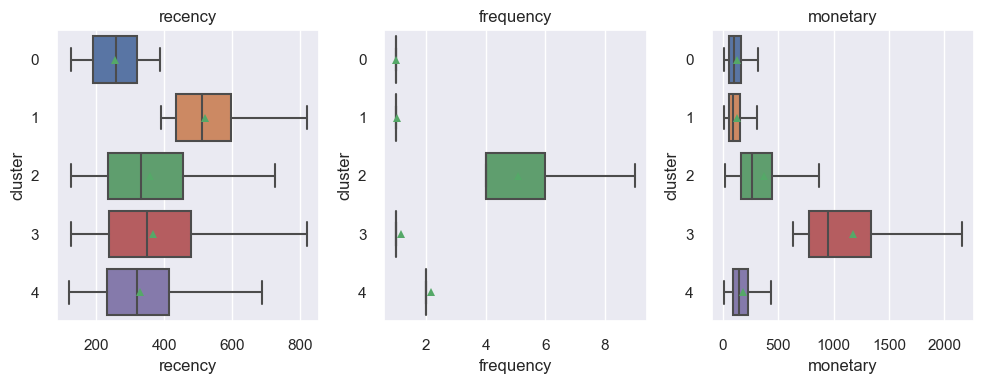

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns

data_plot = data_to_cluster.copy()
data_plot['cluster'] = kmeans.labels_


fig, axs = plt.subplots(ncols=3, figsize=(10, 4))
for i, col in enumerate(data_plot.columns[:-1]):
    sns.boxplot(x=col, y='cluster', data=data_plot, orient='h', showfliers=False, showmeans=True, ax=axs[i])
    axs[i].set_title(col)  

plt.tight_layout()  
plt.show() 


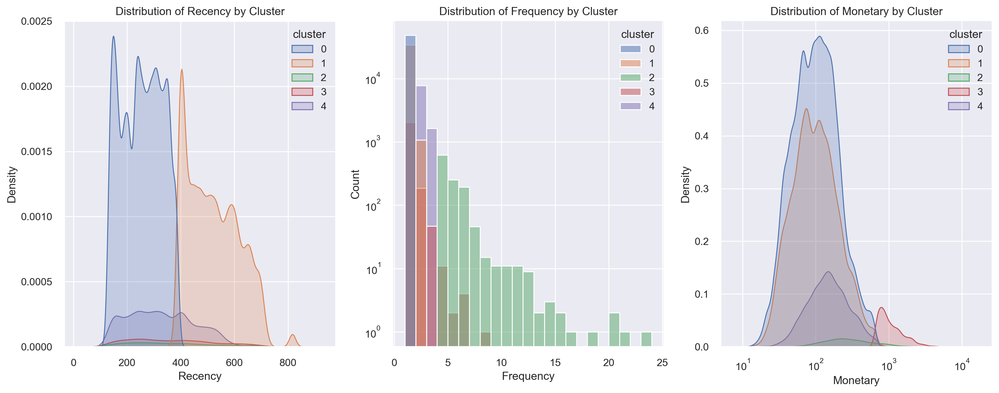

In [87]:
import matplotlib.pyplot as plt
import seaborn as sns

data_plot = data_to_cluster.copy()
data_plot['cluster'] = kmeans.labels_

# Créer les figures
fig, axs = plt.subplots(ncols=3, figsize=(15, 6), dpi=250)

# Plot Distribution de la Recency
sns.kdeplot(data=data_plot, x='recency', hue='cluster', fill=True, palette='deep', ax=axs[0])
axs[0].set_xlabel('Recency')
axs[0].set_ylabel('Density')
axs[0].set_title('Distribution of Recency by Cluster')

# Plot Distribution de la Frequency
sns.histplot(data=data_plot, x='frequency', hue='cluster', palette='deep', log_scale=(False,True), binwidth=1, ax=axs[1])
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Count')
axs[1].set_title('Distribution of Frequency by Cluster')

# Plot Distribution de la Monetary
sns.kdeplot(data=data_plot, x='monetary', hue='cluster', fill=True, palette='deep', log_scale=True, ax=axs[2])
axs[2].set_xlabel('Monetary')
axs[2].set_ylabel('Density')
axs[2].set_title('Distribution of Monetary by Cluster')

# Display
plt.tight_layout()  
plt.show()  # 


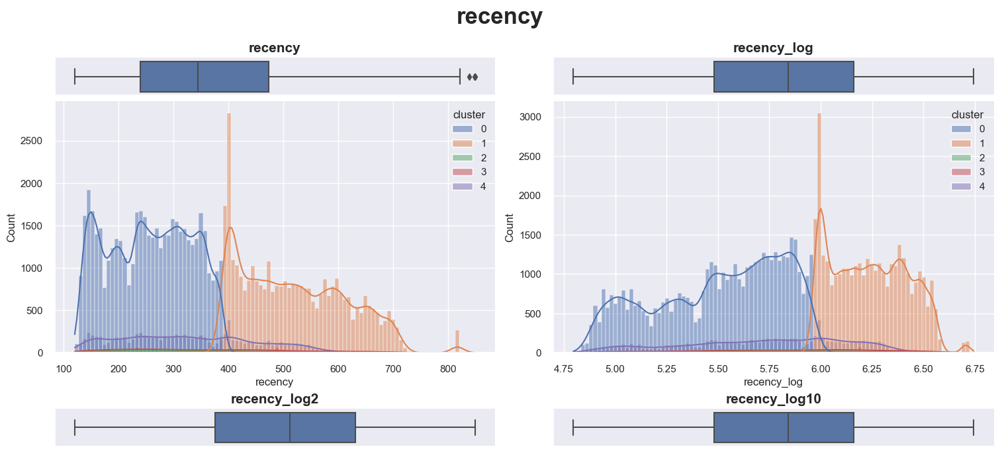

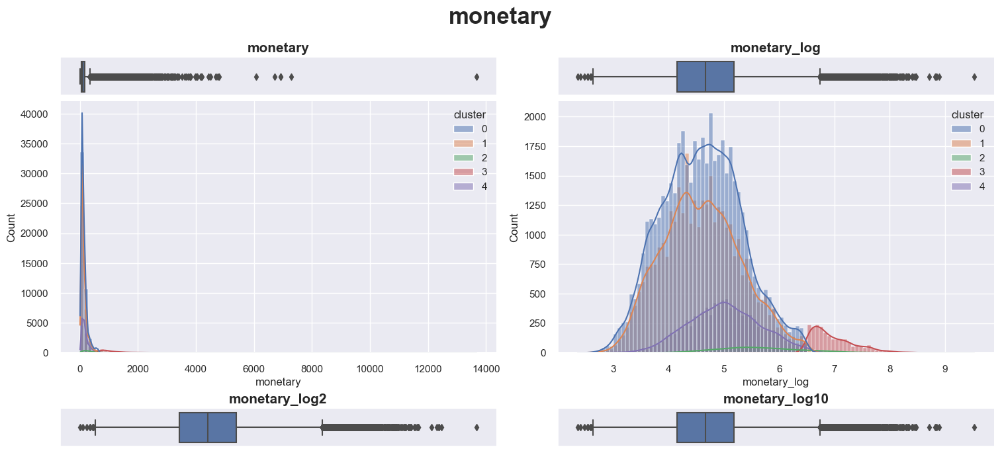

In [88]:
# Distributions 
columns = [ 'recency','monetary']
plot_distribution(data_plot, columns, hue='cluster')

#### Avec réduction de dimension

#### umap visualisation

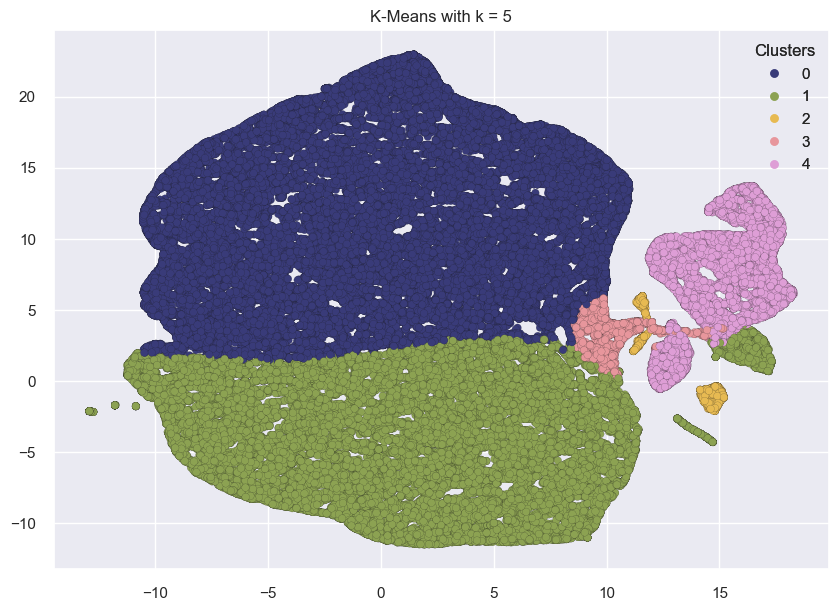

In [89]:
# Cette méthode prends du temps à l'éxécution 
data = data_scaled.values
cluster_labels = kmeans.labels_

k= n_clusters
plot_umap_clusters(data, cluster_labels, title=f"K-Means with k = {k}")

#### TSNE visualisation

In [90]:
from sklearn.manifold import TSNE

In [92]:
# # Utilisation des données sample : 
data_plot = data_to_cluster.copy()
data_plot['cluster'] = kmeans.labels_
msk = data_plot.index.isin(data_sample.index)
cluster = data_plot.iloc[msk, -1]
cluster_df = pd.DataFrame(cluster)
data_plot = data_plot.iloc[msk,:-1].copy()
model = TSNE()
transformed = model.fit_transform(data_plot)
transformed_df = pd.DataFrame(transformed)
transformed_df['cluster'] = cluster_df['cluster'].values


In [417]:
transformed_df

,0,1,cluster
0,54.209309,-11.601519,2
1,-44.421593,-61.219486,4
2,42.588276,40.659958,0
3,-31.627417,51.516552,0
4,-13.425159,29.354624,0
...,...,...,...
9995,-42.928589,-41.612816,2
9996,-35.778824,56.857445,0
9997,-28.556515,-16.909233,2
9998,-81.795784,-4.722713,0


<AxesSubplot:title={'center':'Flattened Graph of 5 Clusters'}>

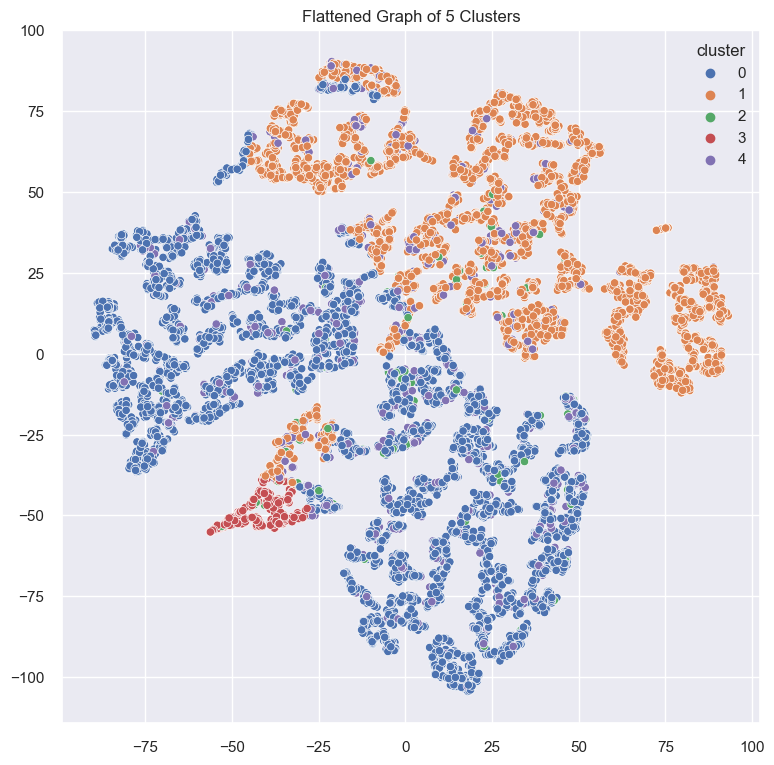

In [93]:
# Plot t-SNE
plt.figure(figsize=(9, 9))
plt.title(f'Flattened Graph of {n_clusters} Clusters')
sns.scatterplot(data=transformed_df, x=transformed[:,0], y=transformed[:,1], hue='cluster', palette="deep")

In [94]:
df = transformed_df
path = "./data/results/"
filename = "cleaned_results_t_SNE_ACP_dataset.csv"
columns_to_save = list(transformed_df.columns)

# Save
save_transformed_df(df, path, filename, columns_to_save)

#### PCA visualisation

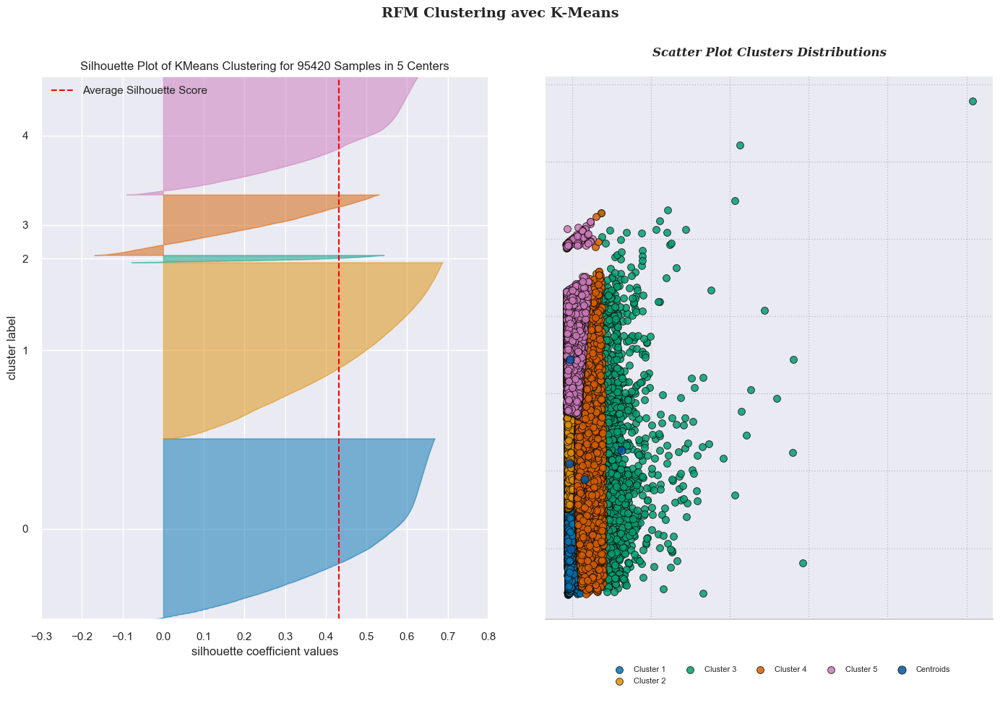

In [95]:
# --- Données brutes ---
X = np.asarray(data_scaled.values)

# --- Application PCA ---
pca = PCA(n_components=2, random_state=42)
X = pca.fit_transform(X)

# --- Implementation K-Means ---
n_cluster = n_clusters
model = KMeans(n_clusters=n_cluster, random_state=32, max_iter=500)
clusters_tag = model.fit_predict(X)
       
# --- Fonction  K-Means  ---
visualizer(model, clusters_tag)

#### Radar Chart


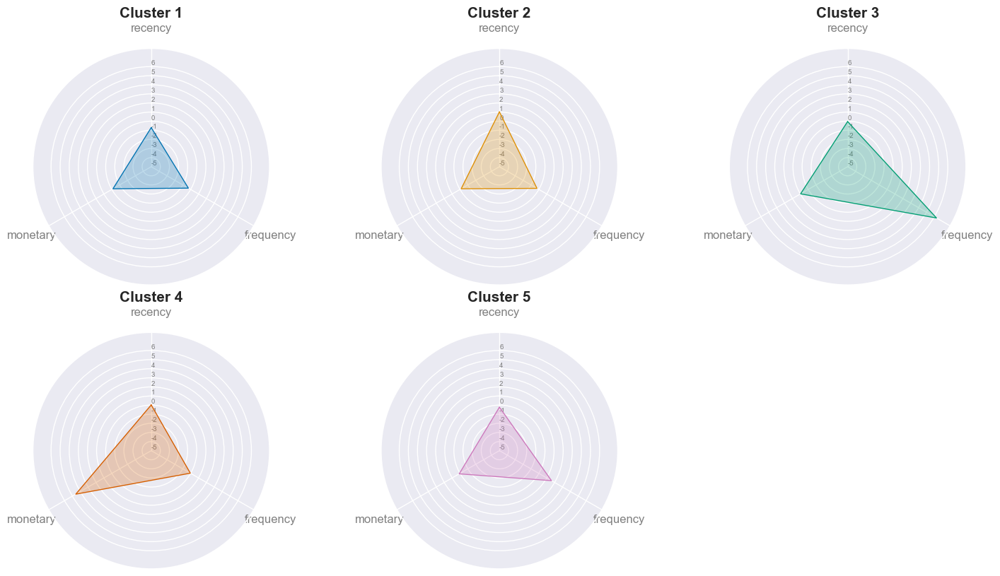

In [96]:
centroids = kmeans.cluster_centers_
plot_radar_chart(centroids, n_clusters = n_clusters)

#### Distribution Clusters Categories

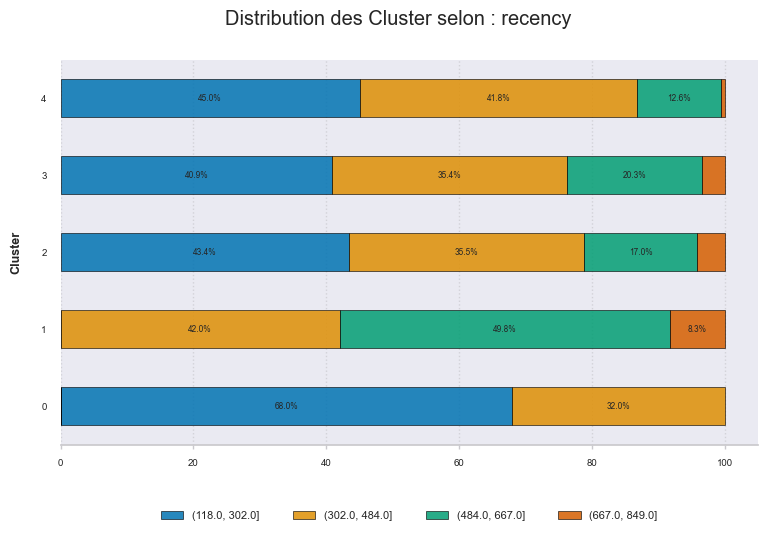

In [97]:
# Recency : 

labels = kmeans.labels_
data = data_to_cluster
plot_category(
    data, 
    col_name="recency", 
    num_categories = 4, 
    labels = labels, 
    plot_name ="13_clusters_Recency",
    save_fig=True
)

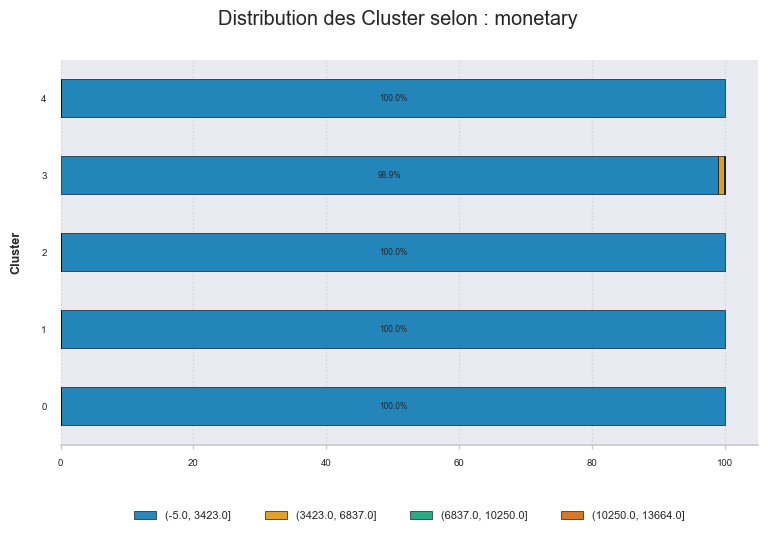

In [98]:
# Monetary : 

labels = kmeans.labels_
data = data_to_cluster
plot_category(
    data, 
    col_name="monetary", 
    num_categories = 4, 
    labels = labels, 
    plot_name ="14_clusters_Monetary",
    save_fig=True
)

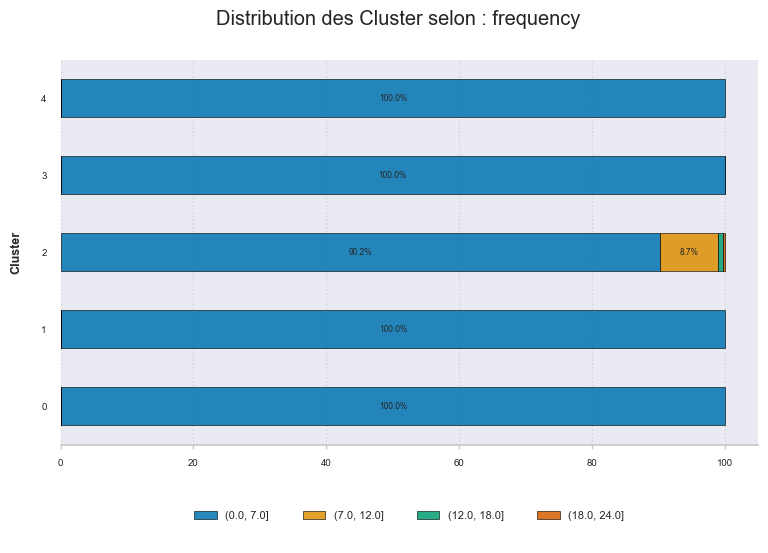

In [100]:
# Frequency : 

labels = kmeans.labels_
data = data_to_cluster
plot_category(
    data, 
    col_name="frequency", 
    num_categories = 4, 
    labels = labels, 
    plot_name ="15_clusters_Frequency",
    save_fig=True
)

In [102]:
# df = rfm_df
# path = "./data/cleaned/"
# filename = "cleaned_rfm_dataset.csv"
# columns_to_save = list(rfm_df.columns)

# # Save
# save_transformed_df(df, path, filename, columns_to_save)

##  **DBSCAN**

In [103]:
X = data_sample.values
X

array([[ 0.56475918, -0.2905643 , -0.44049724],
       [-0.53213261, -0.2905643 , -0.19194423],
       [-0.65618585, -0.2905643 ,  0.17600639],
       ...,
       [-0.35584643, -0.2905643 , -0.53400955],
       [ 0.48640977, -0.2905643 , -0.37783947],
       [-1.45926735, -0.2905643 , -0.48860865]])

In [104]:
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# hyperparametres 
eps_range = [0.5, 1.0, 1.5]
min_samples_range = [2, 5, 10]

#  DataFrame vide pour stocker les résultats
results_df = pd.DataFrame(columns=['eps', 'min_samples', 'n_clusters', 'silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'])

# boucle sur les valeurs eps et min_samples et calcule les métriques d'évaluation pour chaque combinaison
for eps in eps_range:
    for min_samples in min_samples_range:
        
        # DBSCAN et fit data
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X)

        # calculate the evaluation metrics calculer les métriques d'évaluation
        
        silhouette_avg = silhouette_score(X, labels)
        db_index = davies_bouldin_score(X, labels)
        ch_index = calinski_harabasz_score(X, labels)

        # Nombre de cluster
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Résultats
        results_df = results_df.append({'eps': eps,
                                        'min_samples': min_samples,
                                        'n_clusters': n_clusters,
                                        'silhouette_score': silhouette_avg,
                                        'davies_bouldin_score': db_index,
                                        'calinski_harabasz_score': ch_index},
                                       ignore_index=True)

# print the results DataFrame
results_df


,eps,min_samples,n_clusters,silhouette_score,davies_bouldin_score,calinski_harabasz_score
0,0.5,2.0,34.0,0.287033,1.410263,210.159622
1,0.5,5.0,9.0,0.289507,1.495583,623.893148
2,0.5,10.0,5.0,0.309429,1.276619,1109.284367
3,1.0,2.0,14.0,0.366112,1.133230,496.876641
4,1.0,5.0,9.0,0.369144,1.395229,716.246594
5,1.0,10.0,6.0,0.374666,1.222874,988.903971
6,1.5,2.0,10.0,0.373132,1.302388,654.964491
7,1.5,5.0,8.0,0.365565,1.386396,732.165787
8,1.5,10.0,6.0,0.370514,1.374021,910.153892


l'indice de Calinski-Harabasz obtenu est bien inférieur à K-Means.

### Entraînement model et visualisation des clusters

In [105]:
model = DBSCAN(eps=0.5, min_samples=10)
labels = model.fit_predict(data_sample)

In [106]:

# Nombre de Cluster et Nombre de Bruits
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 5
Estimated number of noise points: 217


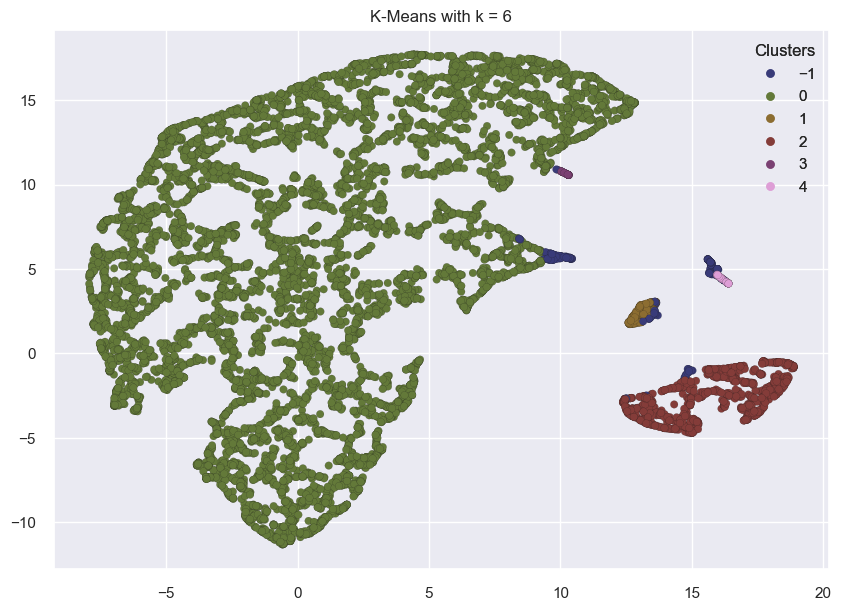

In [107]:
# Cette méthode prends du temps à l'éxécution 
data = data_sample.values
cluster_labels = labels

k= n_clusters
plot_umap_clusters(data, cluster_labels, title=f"K-Means with k = {k}")

#### Avec réduction de dimension

In [108]:
pca = PCA(n_components=2, random_state=24)
X = pca.fit_transform(X)

In [109]:
model = DBSCAN(eps=0.5, min_samples=10)
labels = model.fit_predict(X)
# visualizer(model, labels)

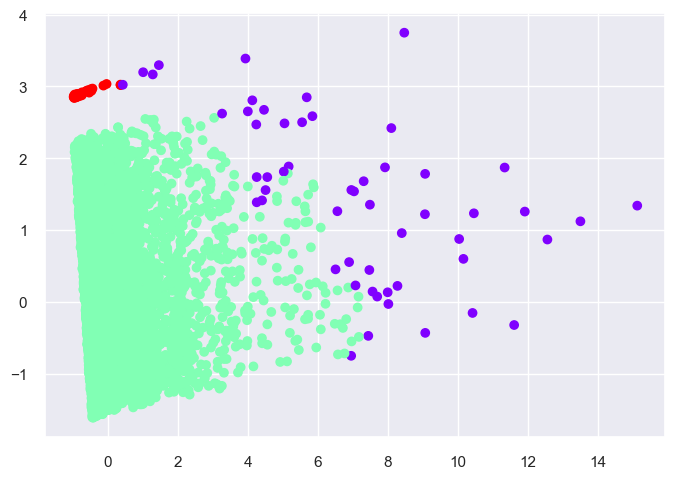

In [110]:
# plot the data points with different colors for different clusters
plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='rainbow')
plt.show()

In [111]:
pd.Series(dbscan.labels_).value_counts()

 0    8720
 2     944
 1     182
 3      70
-1      43
 5      24
 4      17
dtype: int64

## **Clustering hiérarchique**

### Choix du nombre de clusters

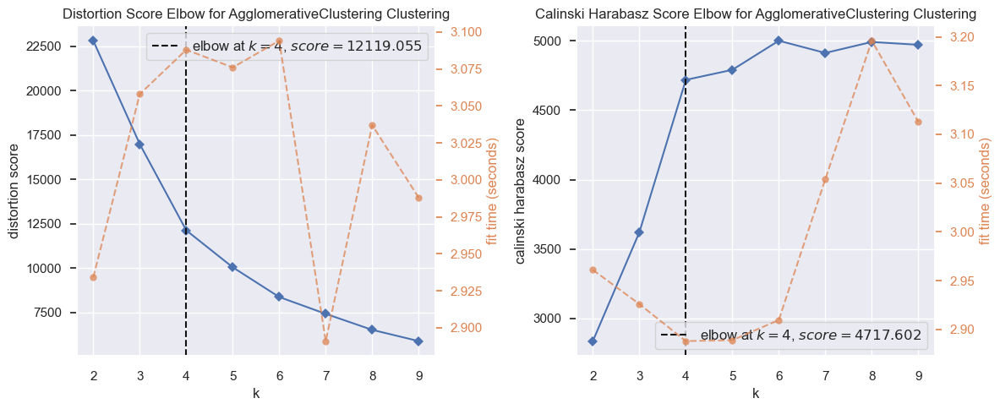

In [112]:
plot_Elbow_CalinskiHarabasz_H(data_sample)

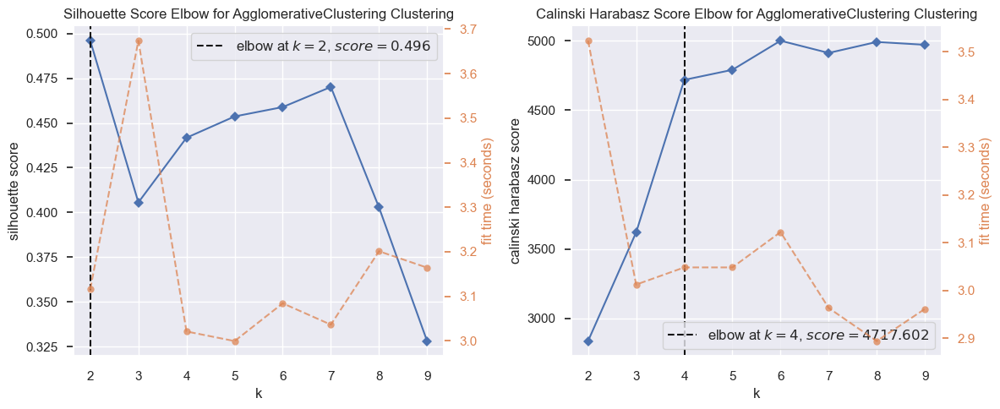

In [113]:
silhouette_score_visualisation_H(data_sample)

### Entraînement model 

In [114]:
n_clusters = 5
H_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
H_clustering = H_clustering.fit(data_sample)

### Visualisations des clusters

#### Analyse graphique : Distributions

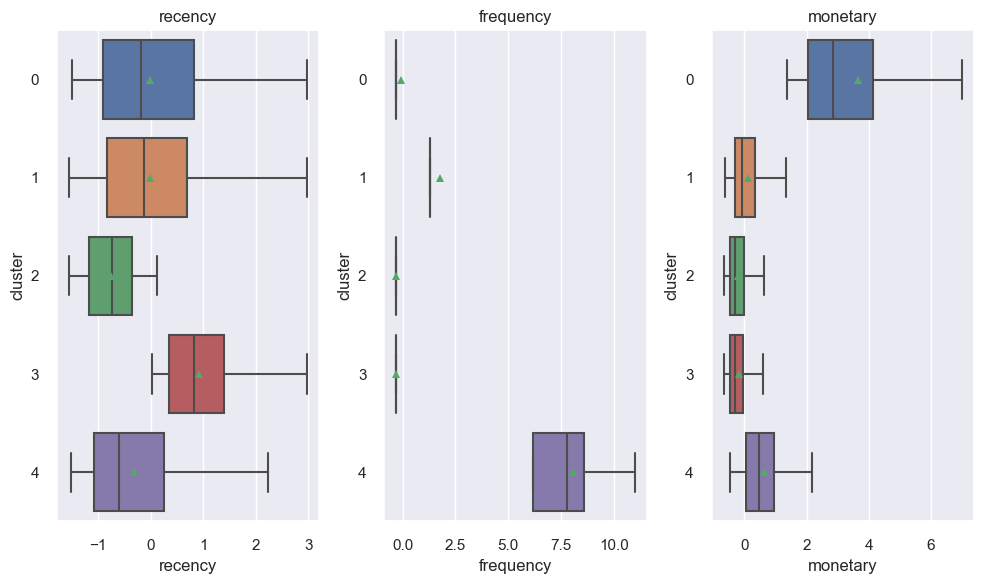

In [115]:
import matplotlib.pyplot as plt
import seaborn as sns

data_plot = data_sample.copy()
data_plot['cluster'] = H_clustering.labels_


fig, axs = plt.subplots(ncols=3, figsize=(10, 6))
for i, col in enumerate(data_plot.columns[:-1]):
    sns.boxplot(x=col, y='cluster', data=data_plot, orient='h', showfliers=False, showmeans=True, ax=axs[i])
    axs[i].set_title(col)  # Set the title of each subplot to the column name

plt.tight_layout()  
plt.show() 


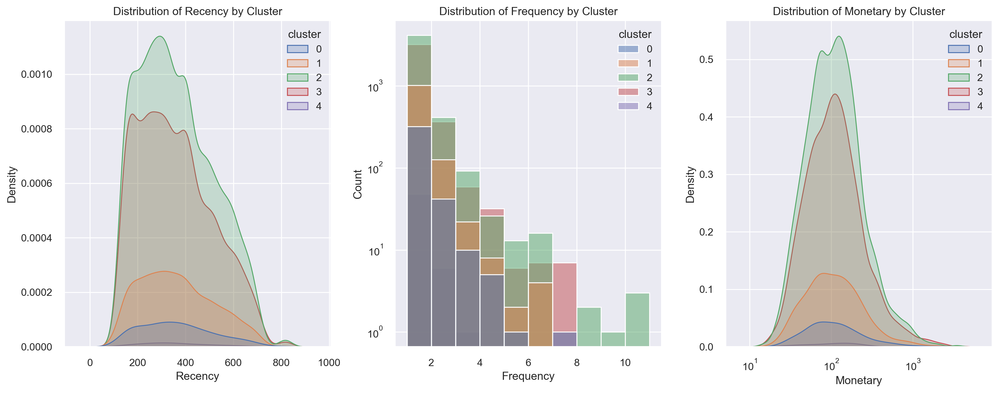

In [116]:
import matplotlib.pyplot as plt
import seaborn as sns


msk = data_to_cluster.index.isin(data_sample.index)
data_plot = data_to_cluster[msk].copy()
data_plot['cluster'] = H_clustering.labels_

# Create a figure with three subplots
fig, axs = plt.subplots(ncols=3, figsize=(15, 6), dpi=250)

# Plot distribution of recency
sns.kdeplot(data=data_plot, x='recency', hue='cluster', fill=True, palette='deep', ax=axs[0])
axs[0].set_xlabel('Recency')
axs[0].set_ylabel('Density')
axs[0].set_title('Distribution of Recency by Cluster')

# Plot distribution of frequency
sns.histplot(data=data_plot, x='frequency', hue='cluster', palette='deep', log_scale=(False,True), binwidth=1, ax=axs[1])
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Count')
axs[1].set_title('Distribution of Frequency by Cluster')

# Plot distribution of monetary
sns.kdeplot(data=data_plot, x='monetary', hue='cluster', fill=True, palette='deep', log_scale=True, ax=axs[2])
axs[2].set_xlabel('Monetary')
axs[2].set_ylabel('Density')
axs[2].set_title('Distribution of Monetary by Cluster')

plt.tight_layout()  # Adjust subplot spacing
plt.show()  # Display the figure


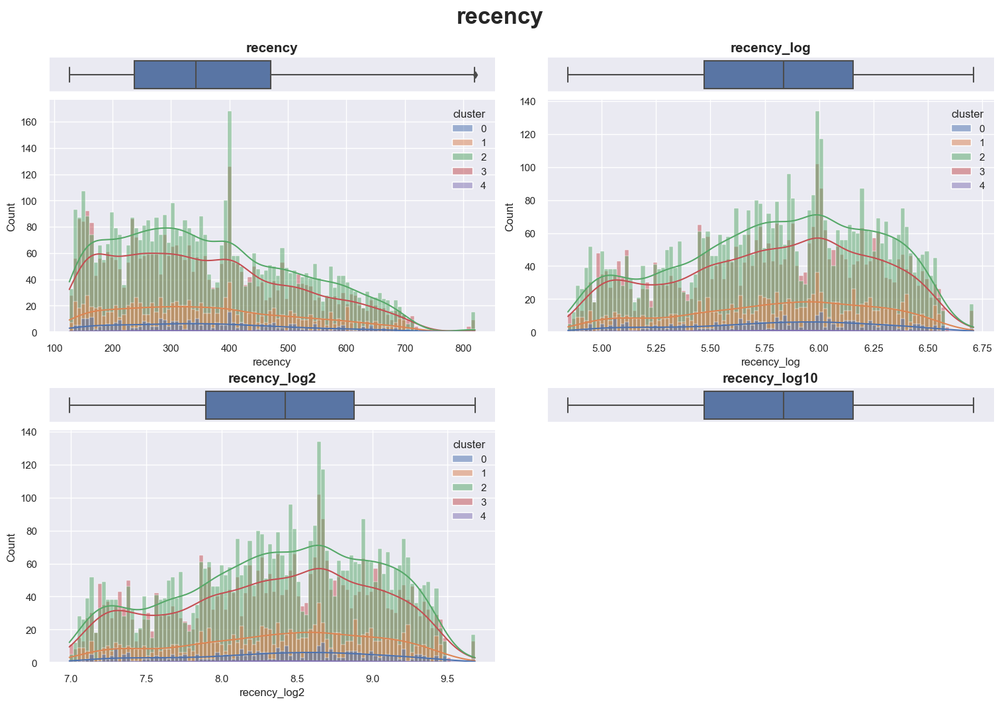

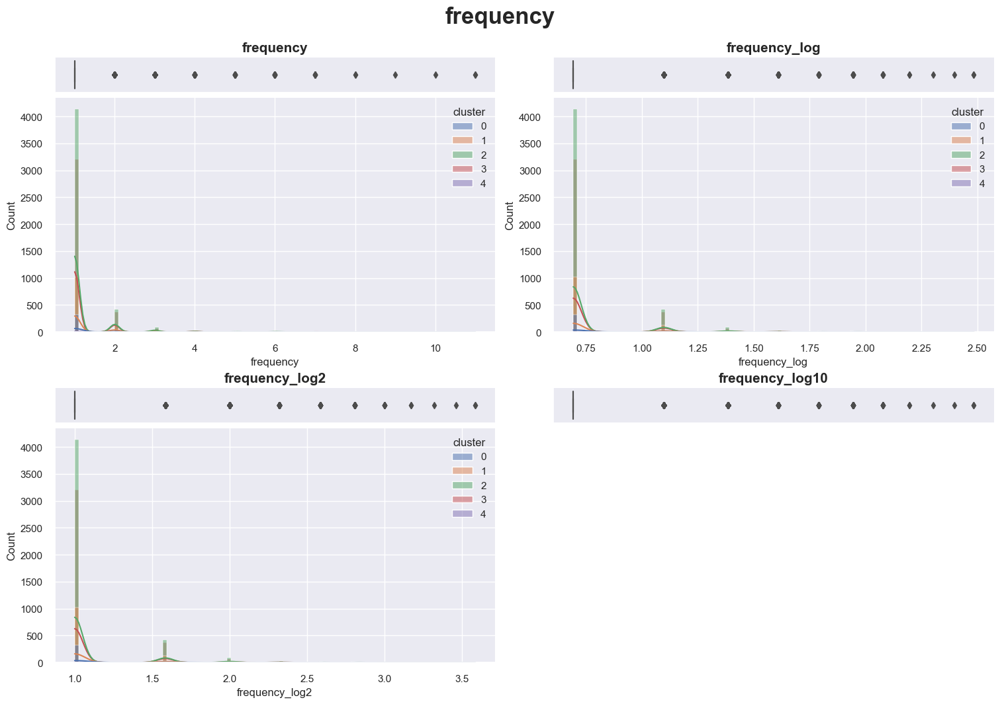

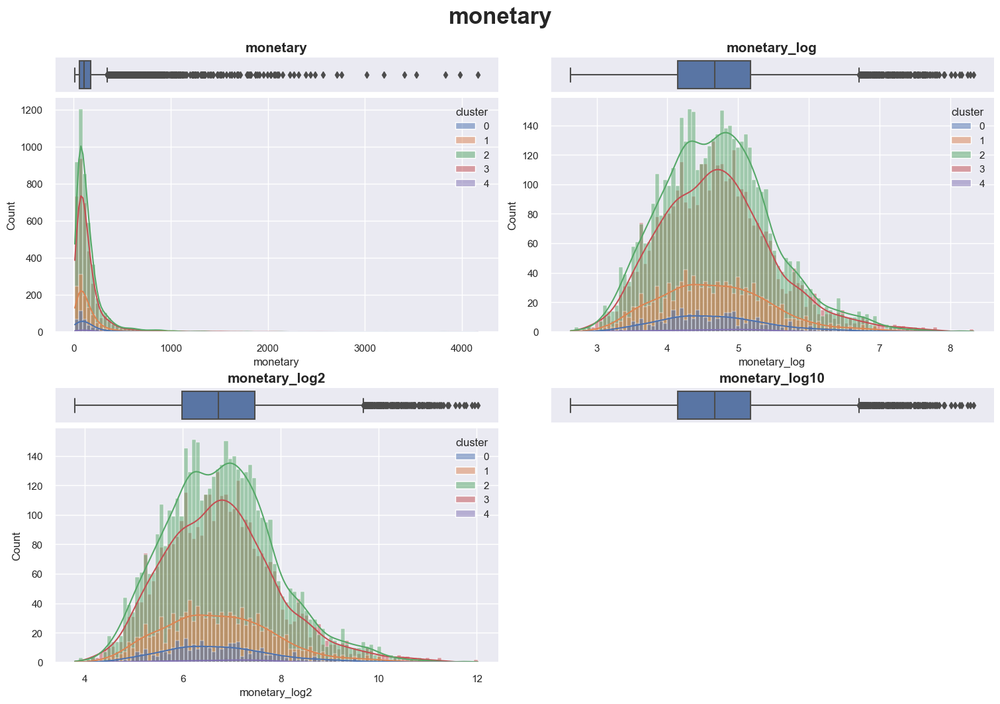

In [117]:
# Distributions 
columns = [
       'recency',
       'frequency','monetary']
plot_distribution(data_plot, columns, hue='cluster')

#### Radar Chart

In [118]:
labels = H_clustering.labels_
cluster_means = means_center_clusters_CAH(data_sample, labels)

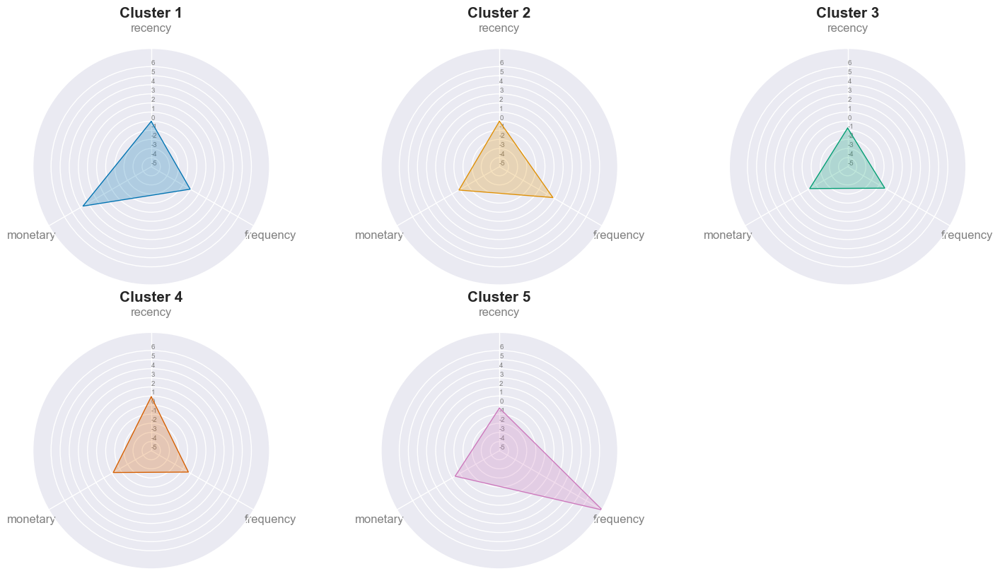

In [119]:
plot_radar_chart(cluster_means, n_clusters = n_clusters)

#### Dendrogram

In [120]:
from scipy.cluster.hierarchy import dendrogram
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

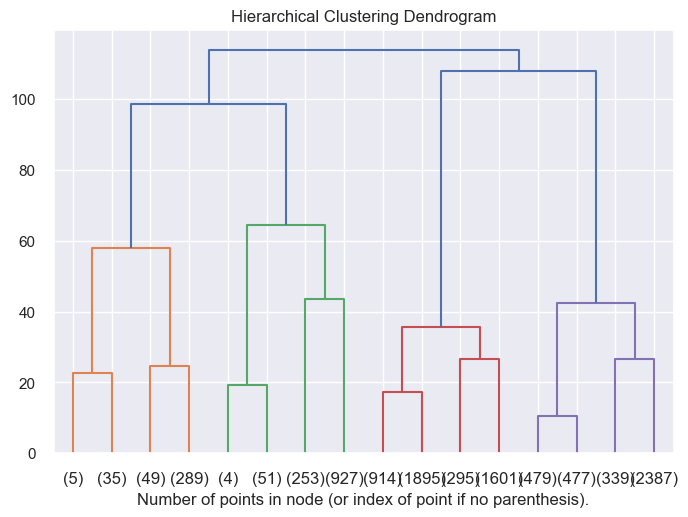

In [121]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(data_sample)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

#### Avec réduction de dimension

#### umap visualisation

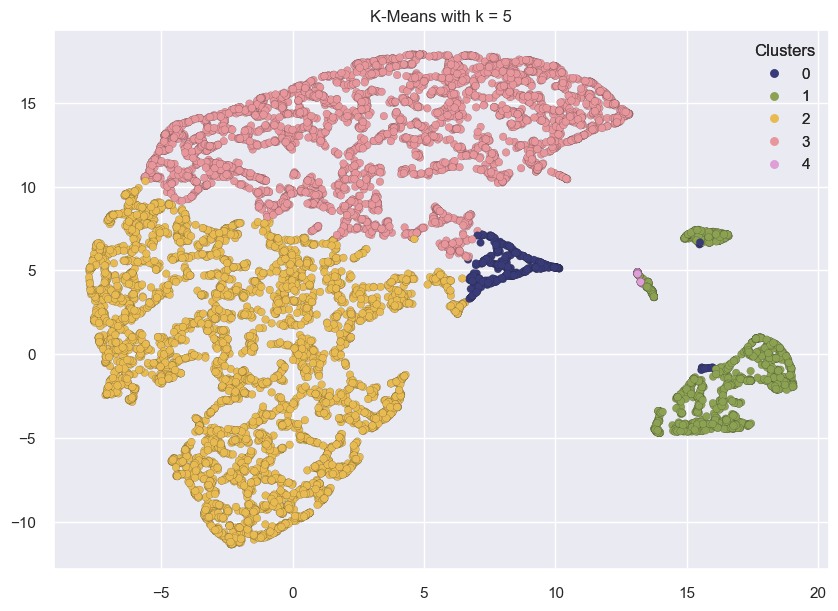

In [122]:
# Cette méthode prends du temps à l'éxécution 
data = data_sample.values
cluster_labels = H_clustering.labels_

k= n_clusters
plot_umap_clusters(data, cluster_labels, title=f"K-Means with k = {k}")

la cellule suivante provient d'un kaggle qui traite la segmentation des clients d'un site e-commerce en utilisant les données des clients processus d'achat avec carte bancaire : à voir si je l'a modifie ou pas !!!!! 

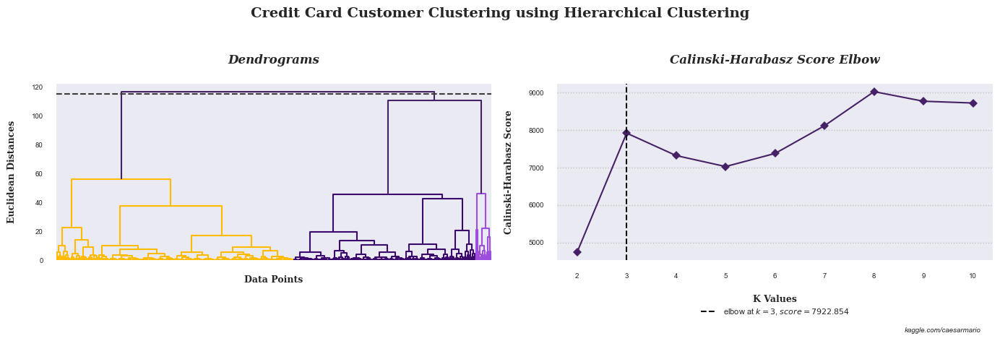

In [267]:
# import scipy.cluster.hierarchy as shc
# from yellowbrick.style import set_palette


# # --- Define Dendrogram ---
# def agg_dendrogram():
    
#     # --- Figure Settings ---
#     color_palette=['#472165', '#FFBB00', '#3C096C', '#9D4EDD', '#FFE270']
#     set_palette(color_palette)
#     text_style=dict(fontweight='bold', fontfamily='serif')
#     ann=dict(textcoords='offset points', va='center', ha='center', fontfamily='serif', style='italic')
#     title=dict(fontsize=12, fontweight='bold', style='italic', fontfamily='serif')
#     bbox=dict(boxstyle='round', pad=0.3, color='#FFDA47', alpha=0.6)
#     fig=plt.figure(figsize=(14, 5))
    
#     # --- Dendrogram Plot ---
#     ax1=fig.add_subplot(1, 2, 1)
#     dend=shc.dendrogram(shc.linkage(X, method='ward', metric='euclidean'))
#     plt.axhline(y=115, color='#3E3B39', linestyle='--')
#     plt.xlabel('\nData Points', fontsize=9, **text_style)
#     plt.ylabel('Euclidean Distances\n', fontsize=9, **text_style)
#     plt.annotate('Horizontal Cut Line', xy=(15000, 130), xytext=(1, 1), fontsize=8, bbox=bbox, **ann)
#     plt.tick_params(labelbottom=False)
#     for spine in ax1.spines.values():
#         spine.set_color('None')
#     plt.grid(axis='both', alpha=0)
#     plt.tick_params(labelsize=7)
#     plt.title('Dendrograms\n', **title)
    
#     # --- Elbow Score (Calinski-Harabasz Index) ---
#     ax2=fig.add_subplot(1, 2, 2)
#     elbow_score_ch = KElbowVisualizer(AgglomerativeClustering(), metric='calinski_harabasz', timings=False, ax=ax2)
#     elbow_score_ch.fit(X)
#     elbow_score_ch.finalize()
#     elbow_score_ch.ax.set_title('Calinski-Harabasz Score Elbow\n', **title)
#     elbow_score_ch.ax.tick_params(labelsize=7)
#     for text in elbow_score_ch.ax.legend_.texts:
#         text.set_fontsize(9)
#     for spine in elbow_score_ch.ax.spines.values():
#         spine.set_color('None')
#     elbow_score_ch.ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), borderpad=2, frameon=False, fontsize=8)
#     elbow_score_ch.ax.grid(axis='y', alpha=0.5, color='#9B9A9C', linestyle='dotted')
#     elbow_score_ch.ax.grid(axis='x', alpha=0)
#     elbow_score_ch.ax.set_xlabel('\nK Values', fontsize=9, **text_style)
#     elbow_score_ch.ax.set_ylabel('Calinski-Harabasz Score\n', fontsize=9, **text_style)
    
#     plt.suptitle('Credit Card Customer Clustering using Hierarchical Clustering\n', fontsize=14, **text_style)
#     plt.gcf().text(0.9, 0.08, 'kaggle.com/caesarmario', style='italic', fontsize=7)
#     plt.tight_layout()
#     plt.show();

# # --- Calling Dendrogram Functions ---
# agg_dendrogram();

##  Evaluation models

In [124]:
from time import time

# --- Transform into Array ---
X = np.asarray(data_sample.values)

# --- Applying PCA ---
pca = PCA(n_components=2, random_state=24)
X = pca.fit_transform(X)

models = {
    "K-Means" : KMeans(n_clusters= n_clusters, max_iter= 300, n_init= 10,init= 'k-means++', algorithm= 'auto' ),
    "DBSCAN": DBSCAN(eps=0.5, min_samples=10),
    "Hierarchical Clustering" : AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
}
names = []
db_index = []
sl_score = []
clinharab = []
TIME = []
for model in list(models.values()):

    names.append(type(model).__name__)
    t0 = time()
    y = model.fit_predict(X)
    fit_time = time() - t0
    TIME.append(fit_time)


    daviesboulin_index = round(davies_bouldin_score(X, y), 3)
    silhouett_score = round(silhouette_score(X, y), 3)
    clinskiharaba_index = round(calinski_harabasz_score(X, y), 3)
    
    
    db_index.append(daviesboulin_index)
    sl_score.append(silhouett_score)
    clinharab.append(clinskiharaba_index)
    
eval_df = pd.DataFrame({
        "Model": names,
        "Silhouette Score" : sl_score,
        "calinski_harabasz_score": clinharab,
        "davies_bouldin_score": db_index,
        "Time Taken": TIME
    })  
eval_df

,Model,Silhouette Score,calinski_harabasz_score,davies_bouldin_score,Time Taken
0,KMeans,0.429,9455.170,0.713,0.187998
1,DBSCAN,0.441,841.113,0.514,0.342045
2,AgglomerativeClustering,0.383,7558.215,0.824,2.825042


# **Méthode RFM (plus) reviews_scores**

In [125]:
data_to_cluster = cleaned_merged_customer[rfm_columns + satisfaction]

In [126]:
data_to_cluster

,recency,frequency,monetary,mean_reviews_scores
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,236,1,141.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,239,1,27.19,4.0
0000f46a3911fa3c0805444483337064,662,1,86.22,3.0
0000f6ccb0745a6a4b88665a16c9f078,446,1,43.62,4.0
0004aac84e0df4da2b147fca70cf8255,413,1,196.89,5.0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,572,2,2067.42,5.0
fffea47cd6d3cc0a88bd621562a9d061,387,1,84.58,4.0
ffff371b4d645b6ecea244b27531430a,693,1,112.46,5.0


##  **K-means**

### Préparation des données

In [128]:
# Préparation des données pour le clustering avec différents Algo : 

#---Data Scaled------: 
# data_scaled

#-----Sample data scaled----: 
# data_sample avec n = 10000 Clients

#----Transformation-----: 
# Nous utiliserons un StandarScaler() : transformer = 'standard'
#                     MinMaxScaler()  : transformer = 'minmax'
#                     RobustScaler()  : transformer = 'robust'

#----Inverse_transform-----: 
# La fonction nous permet aussi de récupérer l'inverse de la transformation avec inverse_transform = True
# Ne pas oublier d'ajouter data_origine dans les return

data_scaled, data_sample = scale_transform_sample(data_to_cluster, n= 10000, transformer="standard", inverse_transform=False)

In [129]:
data_scaled.head()

,recency,frequency,monetary,mean_reviews_scores
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.832472,-0.290564,-0.087229,0.672848
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.812885,-0.290564,-0.605431,-0.082327
0000f46a3911fa3c0805444483337064,1.948932,-0.290564,-0.338763,-0.837501
0000f6ccb0745a6a4b88665a16c9f078,0.538643,-0.290564,-0.531209,-0.082327
0004aac84e0df4da2b147fca70cf8255,0.323182,-0.290564,0.161189,0.672848


In [130]:
data_sample.head()

,recency,frequency,monetary,mean_reviews_scores
customer_unique_id,,,,
842bff27a9fd73c774aeb526d0f53113,0.564759,-0.290564,-0.440497,0.672848
97e5be9a2f1841bc42b966aa2d014d13,-0.532133,-0.290564,-0.191944,0.672848
987f4716cef1294c01c4c0cb7b275ff1,-0.656186,-0.290564,0.176006,0.672848
10e1df2717597281c5cffa0e0a7ca7cb,-1.459267,-0.290564,9.326299,0.672848
6baee3008124f2fd07c61fc8169ad485,-0.368905,2.927735,0.562072,0.672848


In [131]:
data_sample.shape

(10000, 4)

### Choix du nombre de clusters

#### Elbow method avec visualiseur : KElbowVisualizer

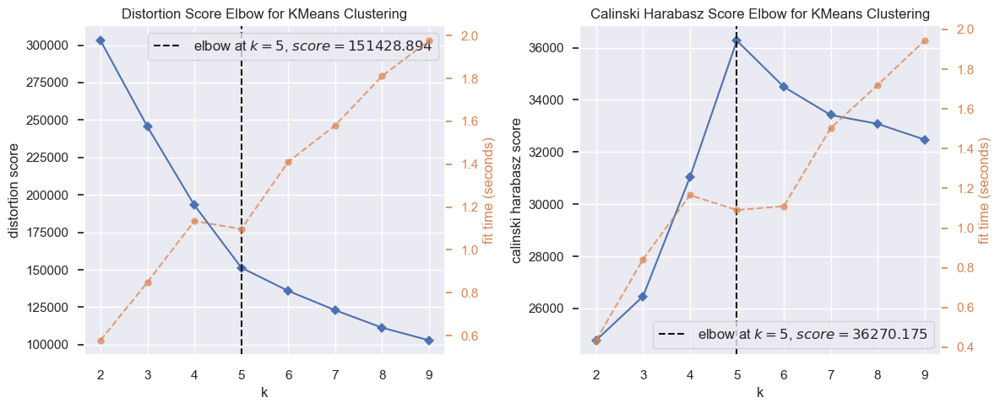

In [132]:
plot_Elbow_CalinskiHarabasz(data_scaled)

#### silhouette_score

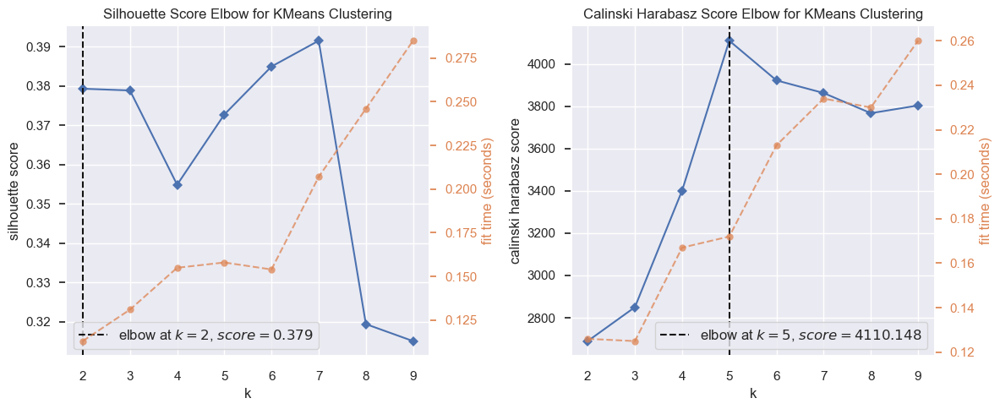

In [133]:
silhouette_score_visualisation(data_sample)

For n_clusters = 4, the average silhouette score is : 0.35621893103797714


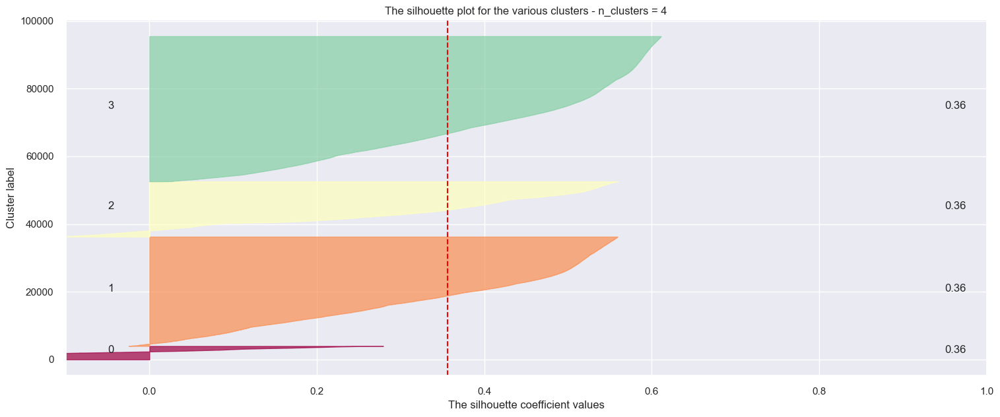

For n_clusters = 5, the average silhouette score is : 0.37248988578803466


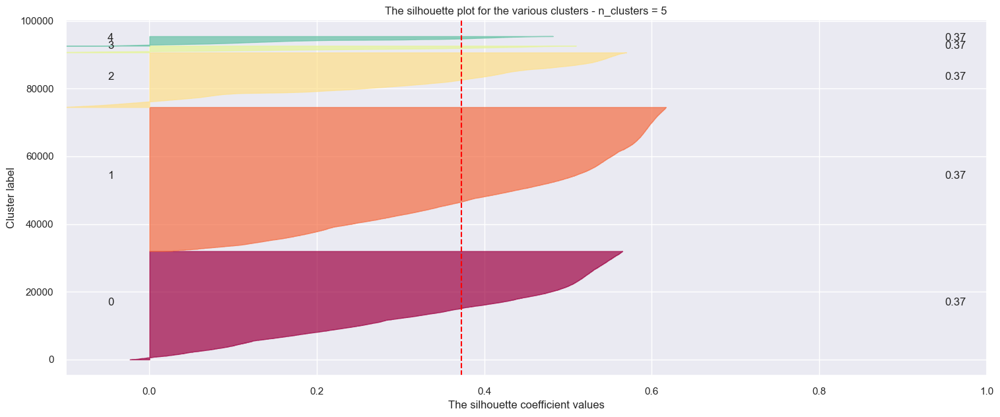

For n_clusters = 6, the average silhouette score is : 0.3848849119068319


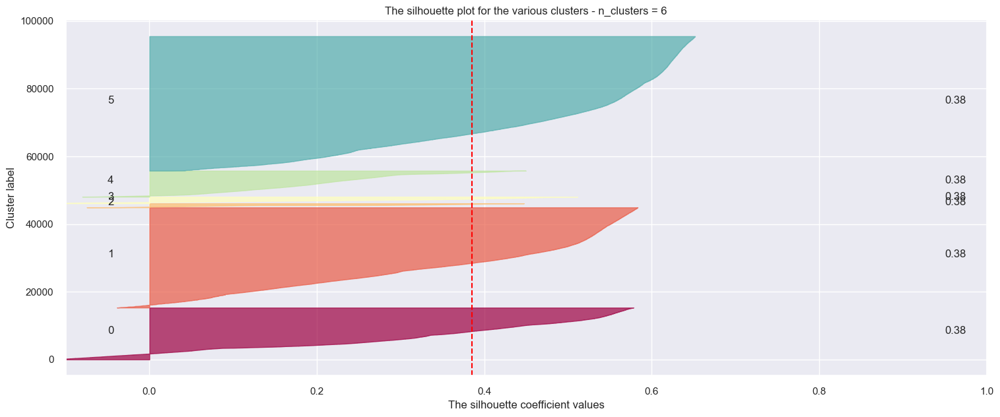

For n_clusters = 7, the average silhouette score is : 0.39117972275973784


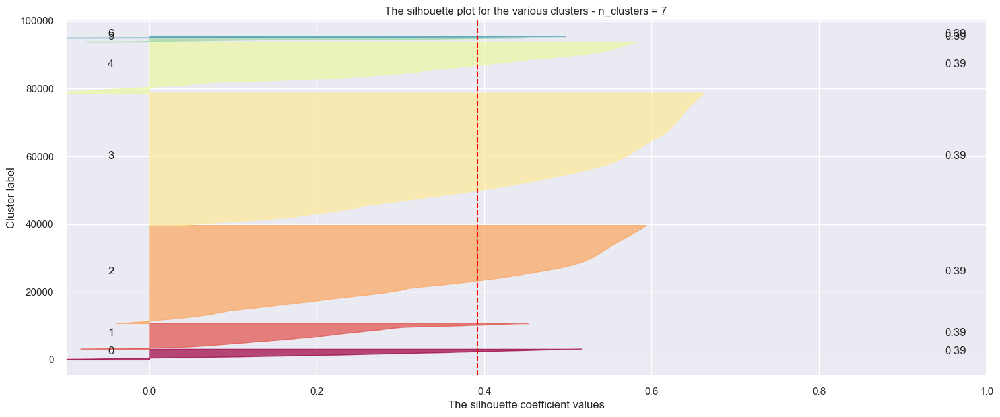

In [134]:
# Range of k values to test
range_n_clusters = [4, 5, 6, 7]
plot_slihouette_score(data_scaled, range_n_clusters)

### Entraînement model

In [135]:
n_clusters = 5
kmeans = KMeans(n_clusters= n_clusters, max_iter= 300, n_init= 10,init= 'k-means++', algorithm= 'auto' )
kmeans.fit_predict(data_scaled)

array([3, 3, 2, ..., 2, 3, 2])

### Visualisations des clusters

#### Analyse graphique : Distributions

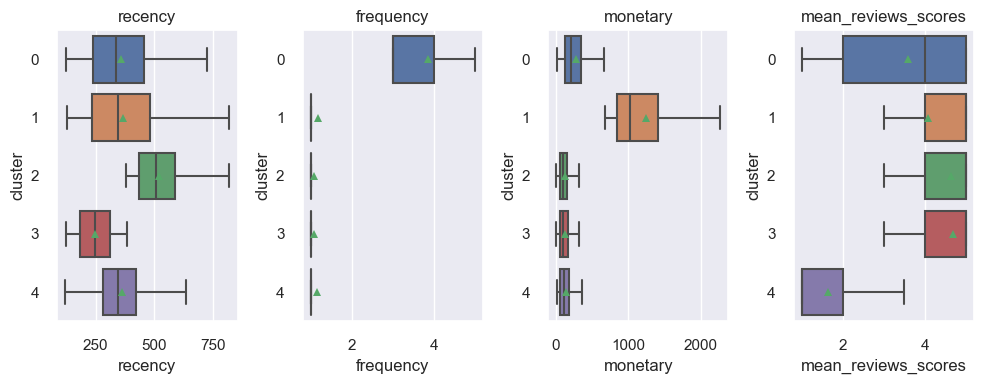

In [136]:
import matplotlib.pyplot as plt
import seaborn as sns

data_plot = data_to_cluster.copy()
data_plot['cluster'] = kmeans.labels_


fig, axs = plt.subplots(ncols=4, figsize=(10, 4))
for i, col in enumerate(data_plot.columns[:-1]):
    sns.boxplot(x=col, y='cluster', data=data_plot, orient='h', showfliers=False, showmeans=True, ax=axs[i])
    axs[i].set_title(col)  


plt.savefig("figures/EDA/plot_.png", transparent=True, bbox_inches='tight', dpi=300)
plt.tight_layout()  
plt.show() 

In [137]:
# Calcul des ratios pour comparer les clusters, sur les différents critères de segmentation
df = data_plot.copy()
df['cluster_result'] = 'Cluster '+df['cluster'].astype(str)
df = df.reset_index()
df = df.drop(['customer_unique_id', 'cluster'], axis=1)
df

,recency,frequency,monetary,mean_reviews_scores,cluster_result
0,236,1,141.90,5.0,Cluster 3
1,239,1,27.19,4.0,Cluster 3
2,662,1,86.22,3.0,Cluster 2
3,446,1,43.62,4.0,Cluster 2
4,413,1,196.89,5.0,Cluster 2
...,...,...,...,...,...
95415,572,2,2067.42,5.0,Cluster 1
95416,387,1,84.58,4.0,Cluster 2
95417,693,1,112.46,5.0,Cluster 2
95418,244,1,133.69,5.0,Cluster 3


In [138]:
df_ = df.groupby("cluster_result").agg(['mean','median', 'min', 'max', 'count'])

In [139]:
df_

recency                         frequency                 \
                      mean median  min  max  count      mean median min max   
cluster_result                                                                
Cluster 0       356.343994  335.0  125  838   2814  3.869225    3.0   3  24   
Cluster 1       364.575850  344.0  128  819   1971  1.174531    1.0   1   8   
Cluster 2       517.932408  508.0  381  820  32001  1.085591    1.0   1   2   
Cluster 3       247.448938  245.0  125  383  42507  1.084527    1.0   1   2   
Cluster 4       364.067154  344.0  120  849  16127  1.153779    1.0   1   2   

                          monetary                                     \
                count         mean    median     min       max  count   
cluster_result                                                          
Cluster 0        2814   286.663998   208.615   15.62   3018.60   2814   
Cluster 1        1971  1246.603458  1028.620  672.41  13664.08   1971   
Cluster 2       32001   131.384413    98.200   10.07    784.80  32001   
Cluster 3       42507   130.791489   100.540    9.59    727.10  42507   
Cluster 4       16127   146.019060   108.590   13.78    809.70  16127   

               mean_reviews_scores                          
                              mean median  min  max  count  
cluster_result                                              
Cluster 0                 3.590451    4.0  1.0  5.0   2814  
Cluster 1                 4.086166    5.0  1.0  5.0   1971  
Cluster 2                 4.636449    5.0  2.0  5.0  32001  
Cluster 3                 4.680664    5.0  3.0  5.0  42507  
Cluster 4                 1.648974    1.0  1.0  3.5  16127

In [140]:
# Ratio Recency to Frequency
df_['Ratio_Recency_to_Frequency']= (df_['recency']["mean"]/df_['frequency']["mean"].sum()).round(2)

In [141]:
# Ratio Monetary to Frequency
df_['Ratio_Monetary_to_Frequency']= (df_['monetary']["mean"]/df_['frequency']["mean"].sum()).round(2)

In [142]:
# Ratio Reviews to Frequency
df_['Ratio_Reviews_to_Frequency']= (df_['mean_reviews_scores']["mean"]/df_['frequency']["mean"].sum()).round(2)

In [143]:
# Ratio Reviews
df_['Ratio_Reviews_to_Reviews']= (df_['mean_reviews_scores']["mean"]/df_['mean_reviews_scores']["mean"].sum()).round(2)

In [144]:
# Ratio Recency
df_['Ratio_Recency_to_Recency']= (df_['recency']["mean"]/df_['recency']["mean"].sum()).round(2)

In [145]:
# Ratio Recency to Reviews
df_['Ratio_Recency_to_Reviews']= (df_['recency']["mean"]/df_['mean_reviews_scores']["mean"].sum()).round(2)

In [146]:
df_

recency                         frequency                 \
                      mean median  min  max  count      mean median min max   
cluster_result                                                                
Cluster 0       356.343994  335.0  125  838   2814  3.869225    3.0   3  24   
Cluster 1       364.575850  344.0  128  819   1971  1.174531    1.0   1   8   
Cluster 2       517.932408  508.0  381  820  32001  1.085591    1.0   1   2   
Cluster 3       247.448938  245.0  125  383  42507  1.084527    1.0   1   2   
Cluster 4       364.067154  344.0  120  849  16127  1.153779    1.0   1   2   

                          monetary                                     \
                count         mean    median     min       max  count   
cluster_result                                                          
Cluster 0        2814   286.663998   208.615   15.62   3018.60   2814   
Cluster 1        1971  1246.603458  1028.620  672.41  13664.08   1971   
Cluster 2       32001   131.384413    98.200   10.07    784.80  32001   
Cluster 3       42507   130.791489   100.540    9.59    727.10  42507   
Cluster 4       16127   146.019060   108.590   13.78    809.70  16127   

               mean_reviews_scores                          \
                              mean median  min  max  count   
cluster_result                                               
Cluster 0                 3.590451    4.0  1.0  5.0   2814   
Cluster 1                 4.086166    5.0  1.0  5.0   1971   
Cluster 2                 4.636449    5.0  2.0  5.0  32001   
Cluster 3                 4.680664    5.0  3.0  5.0  42507   
Cluster 4                 1.648974    1.0  1.0  3.5  16127   

               Ratio_Recency_to_Frequency Ratio_Monetary_to_Frequency  \
                                                                        
cluster_result                                                          
Cluster 0                           42.59                       34.26   
Cluster 1                           43.57                      148.98   
Cluster 2                           61.90                       15.70   
Cluster 3                           29.57                       15.63   
Cluster 4                           43.51                       17.45   

               Ratio_Reviews_to_Frequency Ratio_Reviews_to_Reviews  \
                                                                     
cluster_result                                                       
Cluster 0                            0.43                     0.19   
Cluster 1                            0.49                     0.22   
Cluster 2                            0.55                     0.25   
Cluster 3                            0.56                     0.25   
Cluster 4                            0.20                     0.09   

               Ratio_Recency_to_Recency Ratio_Recency_to_Reviews  
                                                                  
cluster_result                                                    
Cluster 0                          0.19                    19.11  
Cluster 1                          0.20                    19.56  
Cluster 2                          0.28                    27.78  
Cluster 3                          0.13                    13.27  
Cluster 4                          0.20                    19.53

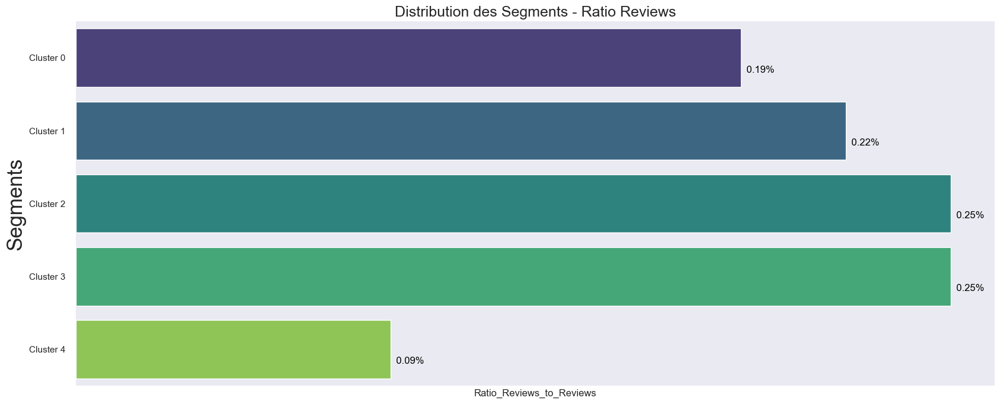

In [147]:
# Code COpié : voir sources
plt.figure(figsize=(20,8))
#plt.rc('font', size=20)
per= sns.barplot(x=df_['Ratio_Reviews_to_Reviews'], y=df_.index, data=df_, palette="viridis")
sns.despine(bottom = True, left = True)
for i, v in enumerate(df_['Ratio_Reviews_to_Reviews']):
    per.text(v, i+.20,"  {:.2f}".format(v)+"%", color='black', ha="left")
per.set_ylabel('Segments', fontsize=25)
per.set(xticks=[])
plt.title('Distribution des Segments - Ratio Reviews', fontsize=18)
plt.savefig("figures/EDA/plot_.png", transparent=True, bbox_inches='tight', dpi=300)
plt.show()

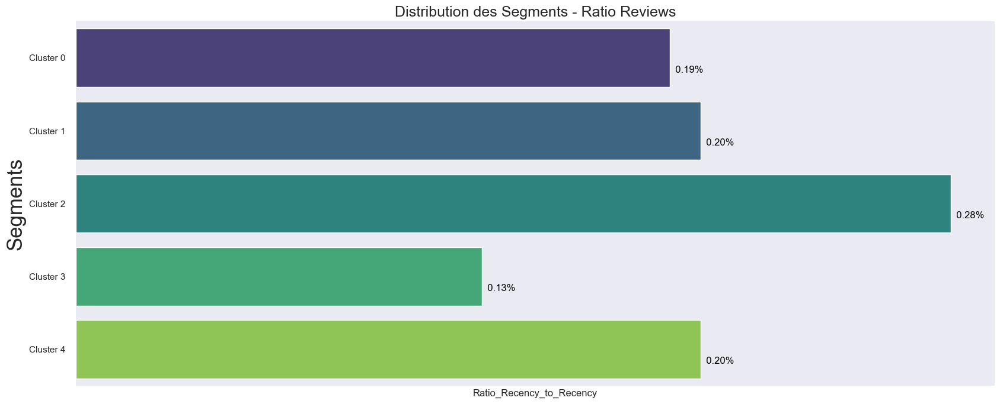

In [148]:
# Code COpié : voir sources
plt.figure(figsize=(20,8))
#plt.rc('font', size=20)
per= sns.barplot(x=df_['Ratio_Recency_to_Recency'], y=df_.index, data=df_, palette="viridis")
sns.despine(bottom = True, left = True)
for i, v in enumerate(df_['Ratio_Recency_to_Recency']):
    per.text(v, i+.20,"  {:.2f}".format(v)+"%", color='black', ha="left")
per.set_ylabel('Segments', fontsize=25)
per.set(xticks=[])
plt.title('Distribution des Segments - Ratio Reviews', fontsize=18)
plt.savefig("figures/EDA/plot_.png", transparent=True, bbox_inches='tight', dpi=300)
plt.show()

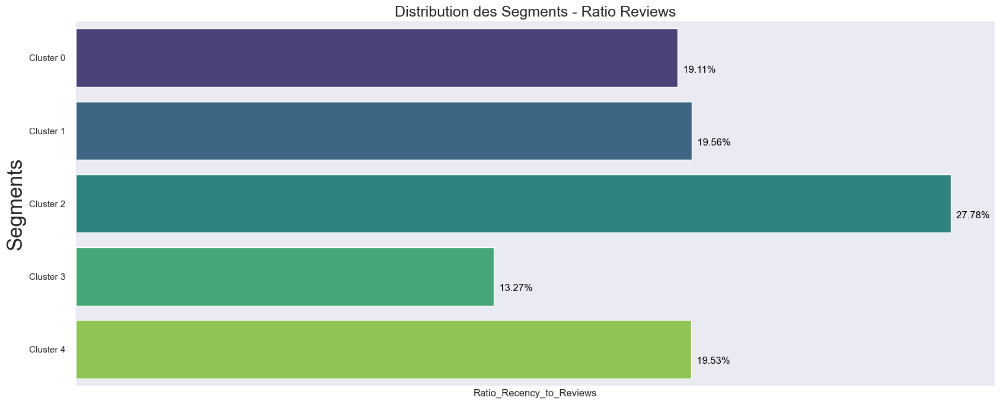

In [149]:
# Code COpié : voir sources
plt.figure(figsize=(20,8))
#plt.rc('font', size=20)
per= sns.barplot(x=df_['Ratio_Recency_to_Reviews'], y=df_.index, data=df_, palette="viridis")
sns.despine(bottom = True, left = True)
for i, v in enumerate(df_['Ratio_Recency_to_Reviews']):
    per.text(v, i+.20,"  {:.2f}".format(v)+"%", color='black', ha="left")
per.set_ylabel('Segments', fontsize=25)
per.set(xticks=[])
plt.title('Distribution des Segments - Ratio Reviews', fontsize=18)
plt.savefig("figures/EDA/plot_.png", transparent=True, bbox_inches='tight', dpi=300)
plt.show()

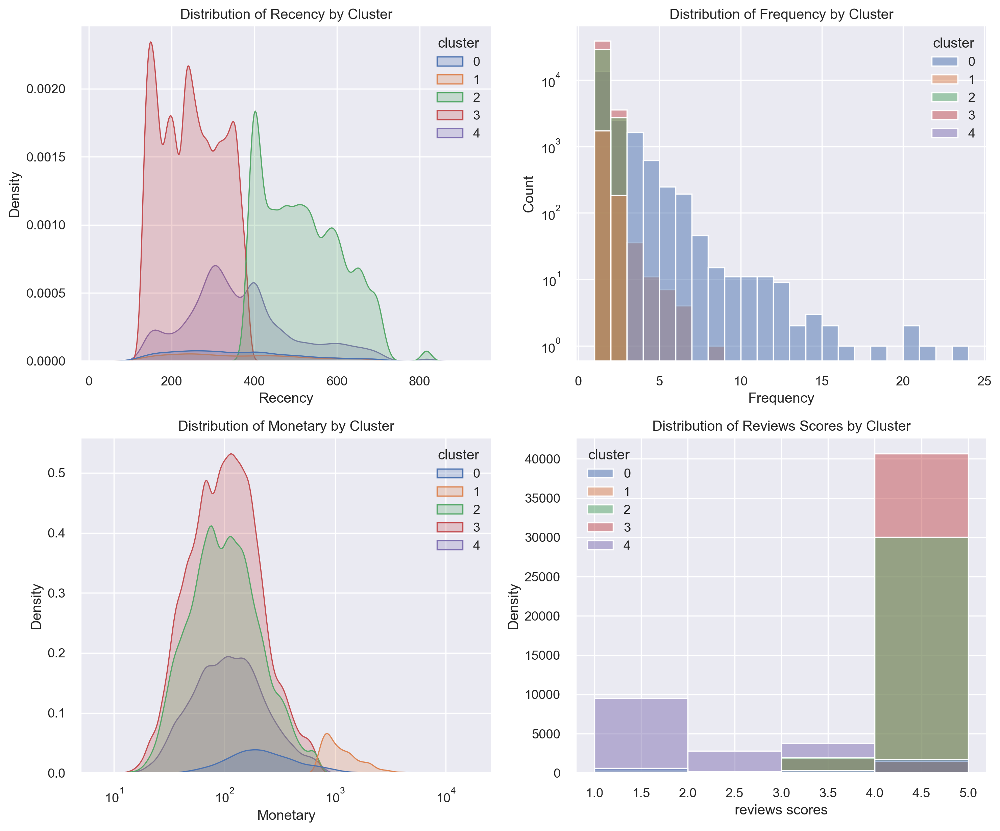

In [150]:
import matplotlib.pyplot as plt
import seaborn as sns

data_plot = data_to_cluster.copy()
data_plot['cluster'] = kmeans.labels_

# Créer les figures
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 10), dpi=250)

# Plot Distribution de la Recency
sns.kdeplot(data=data_plot, x='recency', hue='cluster', fill=True, palette='deep', ax=axs[0, 0])
axs[0, 0].set_xlabel('Recency')
axs[0, 0].set_ylabel('Density')
axs[0, 0].set_title('Distribution of Recency by Cluster')

# Plot Distribution de la Frequency
sns.histplot(data=data_plot, x='frequency', hue='cluster', palette='deep', log_scale=(False,True), binwidth=1, ax=axs[0, 1])
axs[0, 1].set_xlabel('Frequency')
axs[0, 1].set_ylabel('Count')
axs[0, 1].set_title('Distribution of Frequency by Cluster')

# Plot Distribution de la Monetary
sns.kdeplot(data=data_plot, x='monetary', hue='cluster', fill=True, palette='deep', log_scale=True, ax=axs[1, 0])
axs[1, 0].set_xlabel('Monetary')
axs[1, 0].set_ylabel('Density')
axs[1, 0].set_title('Distribution of Monetary by Cluster')

# Plot Distribution de la Reviews scores
sns.histplot(data=data_plot, x='mean_reviews_scores', hue='cluster', palette='deep', log_scale=False, binwidth=1, ax=axs[1, 1])
# sns.displot(x='mean_reviews_scores', data=data_plot, hue='cluster', aspect=1.5, palette='deep', multiple='dodge', log_scale=(False, True), bins=10);
axs[1, 1].set_xlabel('reviews scores')
axs[1, 1].set_ylabel('Density')
axs[1, 1].set_title('Distribution of Reviews Scores by Cluster')

plt.tight_layout()  
plt.show() 


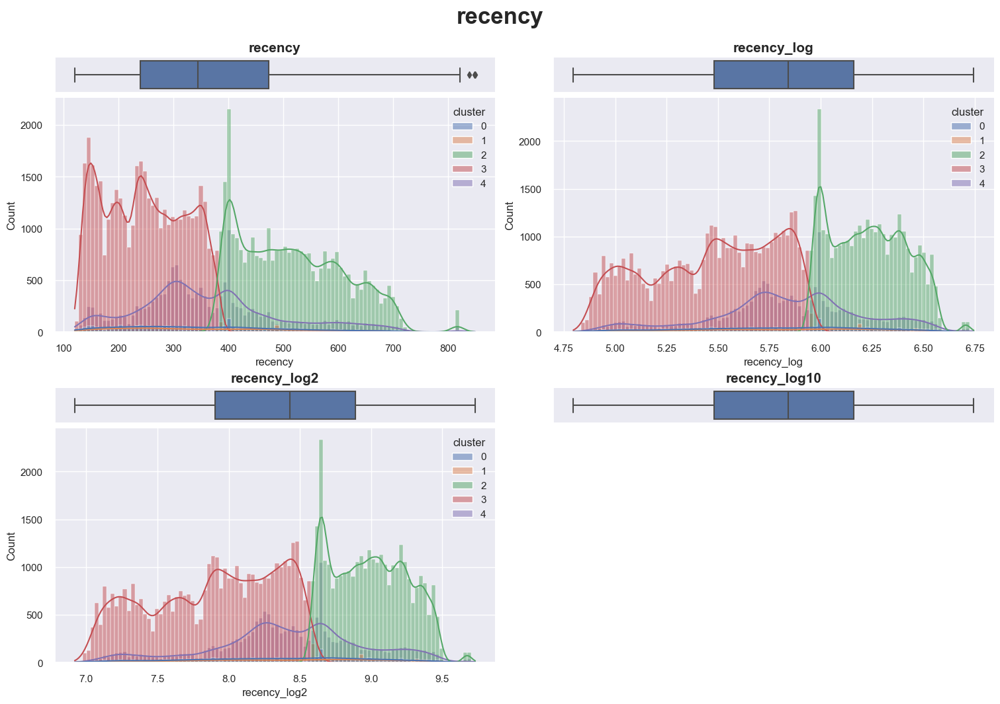

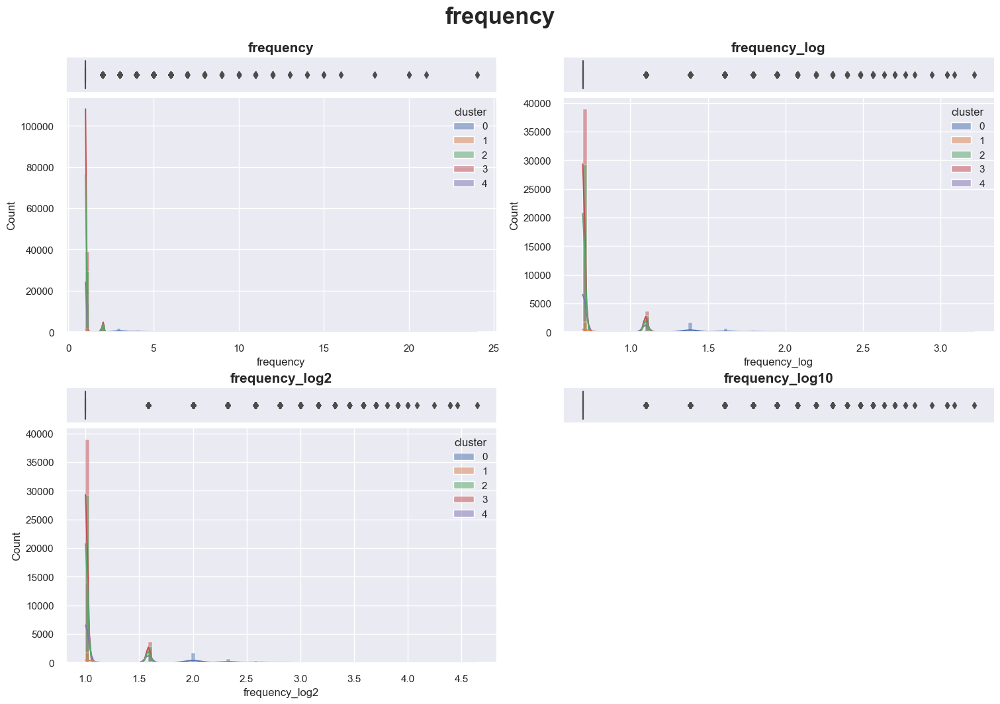

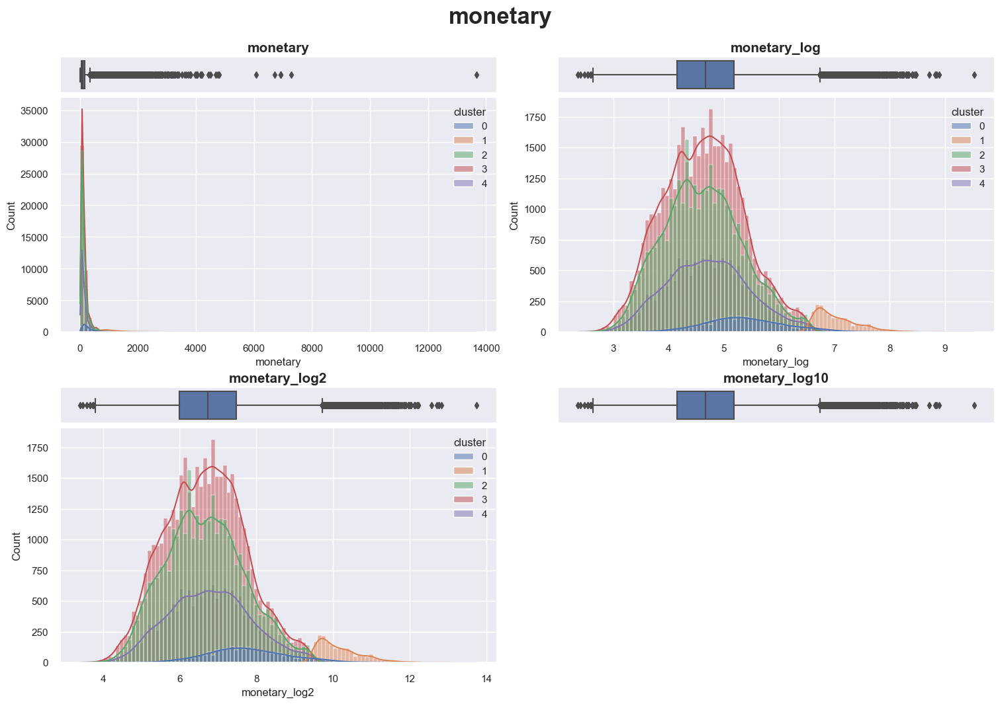

In [151]:
# Distributions 
columns = [
       'recency',
       'frequency','monetary']
plot_distribution(data_plot, columns, hue='cluster')

#### Distribution Clusters Categories

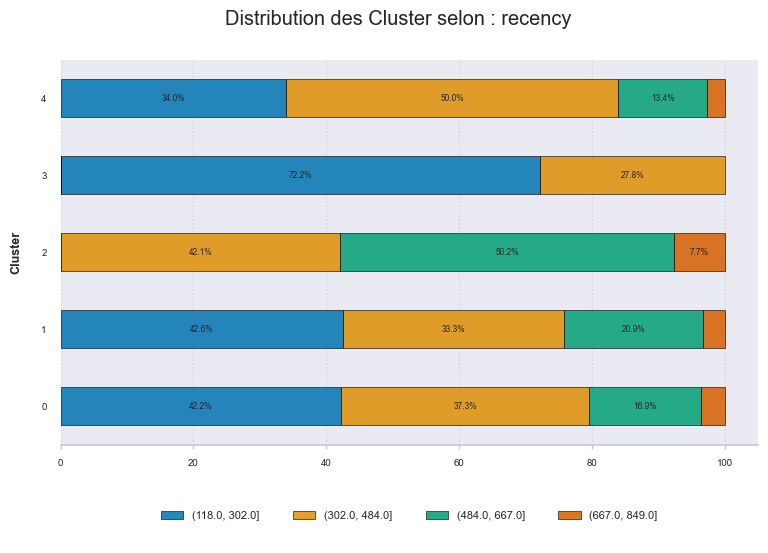

In [152]:
# Recency : 

labels = kmeans.labels_
data = data_to_cluster
plot_category(
    data, 
    col_name="recency", 
    num_categories = 4, 
    labels = labels, 
    plot_name ="16_clusters_RFM_plus_Review_recency",
    save_fig=True
)

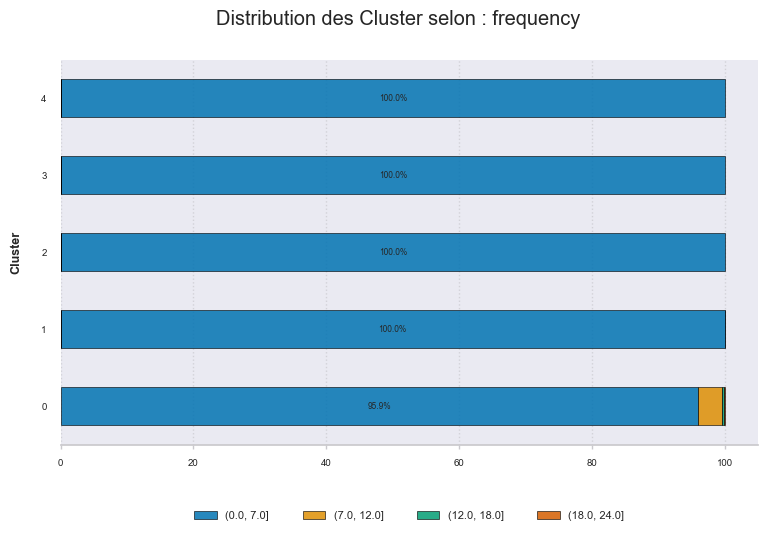

In [153]:
# Frequency : 

labels = kmeans.labels_
data = data_to_cluster
plot_category(
    data, 
    col_name="frequency", 
    num_categories = 4, 
    labels = labels, 
    plot_name ="17_clusters_RFM_plus_Review_frequency",
    save_fig=True
)

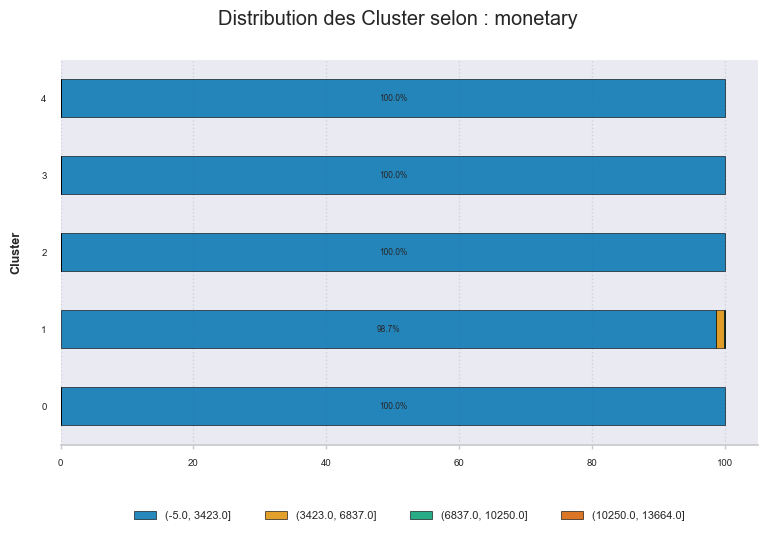

In [154]:
# Monetary : 

labels = kmeans.labels_
data = data_to_cluster
plot_category(
    data, 
    col_name="monetary", 
    num_categories = 4, 
    labels = labels, 
    plot_name ="18_clusters_RFM_plus_Review_monetary",
    save_fig=True
)

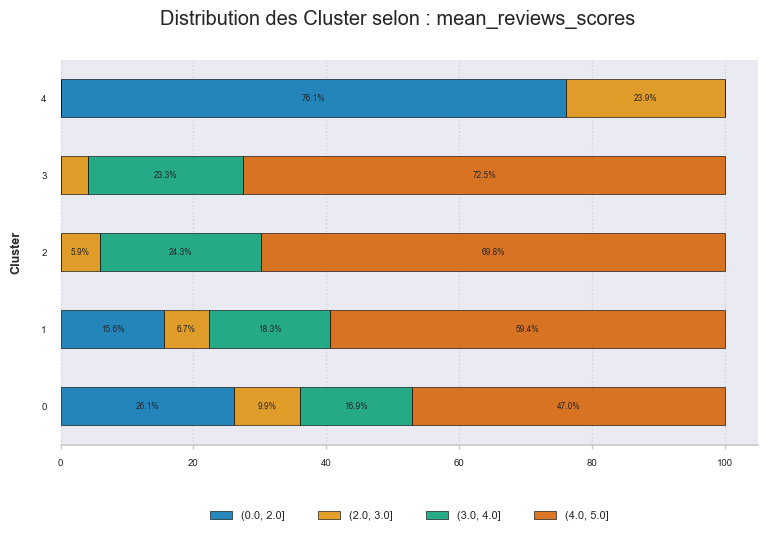

In [155]:
# mean_reviews_scores : 

labels = kmeans.labels_
data = data_to_cluster
plot_category(
    data, 
    col_name="mean_reviews_scores", 
    num_categories = 4, 
    labels = labels, 
    plot_name ="19_clusters_RFM_plus_Review_mean_reviews_scores",
    save_fig=True
)

#### Avec réduction de dimension

#### umap visualisation

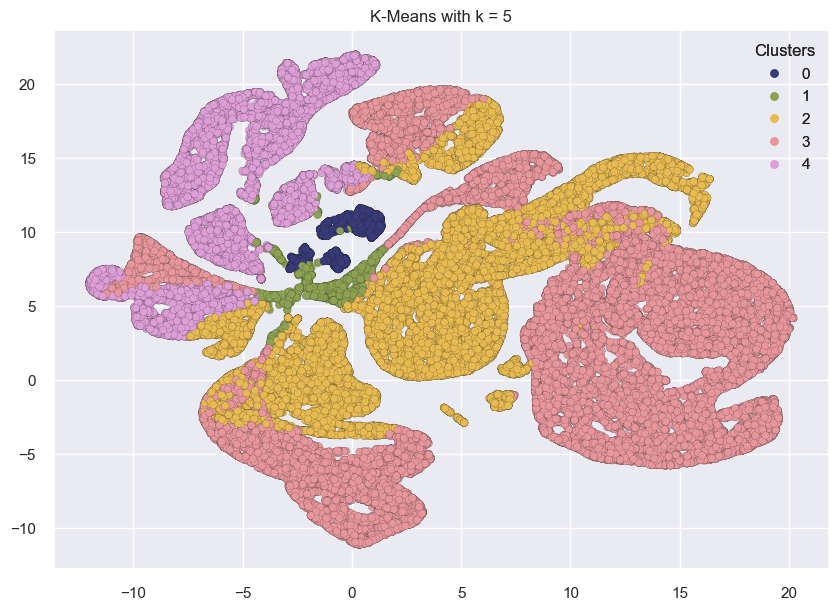

In [156]:
# Cette méthode prends du temps à l'éxécution 
data = data_scaled.values
cluster_labels = kmeans.labels_

k= n_clusters
plot_umap_clusters(data, cluster_labels, title=f"K-Means with k = {k}")

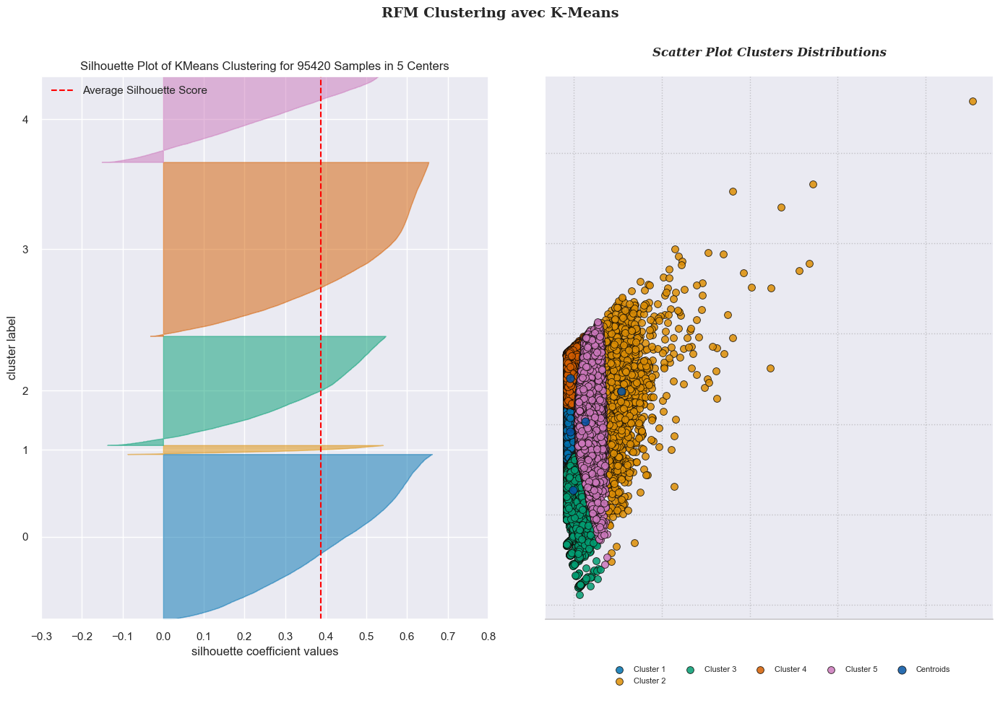

In [157]:
# --- Données brutes ---
X = np.asarray(data_scaled.values)

# --- Application PCA ---
pca = PCA(n_components=2, random_state=24)
X = pca.fit_transform(X)

# --- Implementation K-Means ---
n_cluster = n_clusters
model = KMeans(n_clusters= n_clusters, max_iter= 300, n_init= 10,init= 'k-means++', algorithm= 'auto' )
clusters_tag = model.fit_predict(X)

# --- Fonction  K-Means  ---
visualizer(model, clusters_tag)

#### Radar Chart

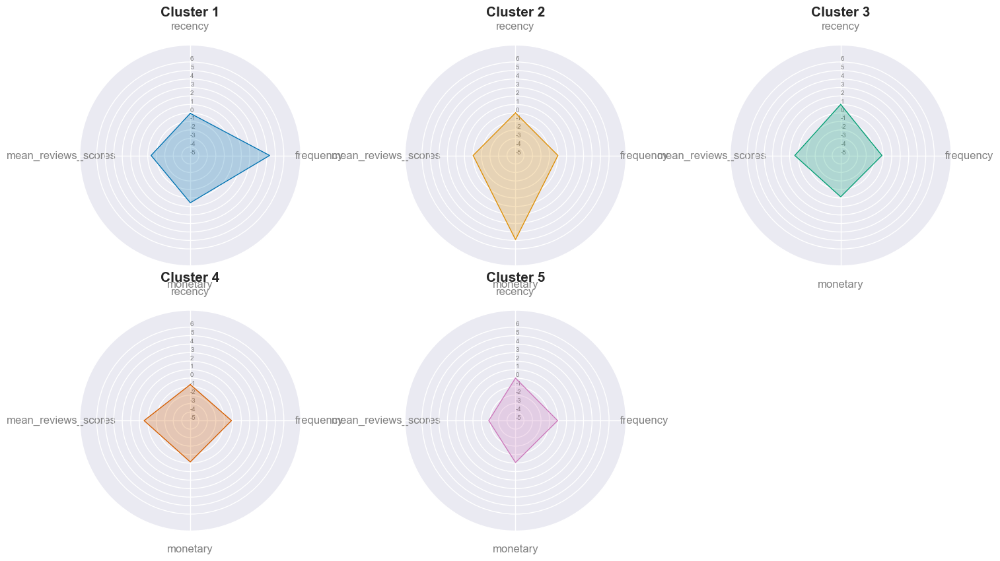

In [158]:
centroids = kmeans.cluster_centers_
plot_radar_chart(centroids, n_clusters = n_clusters)

##  **DBSCAN**

In [160]:
X = data_sample.values
X

array([[ 0.56475918, -0.2905643 , -0.44049724,  0.67284798],
       [-0.53213261, -0.2905643 , -0.19194423,  0.67284798],
       [-0.65618585, -0.2905643 ,  0.17600639,  0.67284798],
       ...,
       [-0.35584643, -0.2905643 , -0.53400955,  0.67284798],
       [ 0.48640977, -0.2905643 , -0.37783947, -0.08232655],
       [-1.45926735, -0.2905643 , -0.48860865,  0.67284798]])

In [161]:
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# hyperparametres 
eps_range = [0.5, 1.0, 1.5]
min_samples_range = [2, 5, 10]

#  DataFrame vide pour stocker les résultats
results_df = pd.DataFrame(columns=['eps', 'min_samples', 'n_clusters', 'silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'])

# boucle sur les valeurs eps et min_samples et calcule les métriques d'évaluation pour chaque combinaison
for eps in eps_range:
    for min_samples in min_samples_range:
        
        # DBSCAN et fit data
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X)

        # calculate the evaluation metrics calculer les métriques d'évaluation
        
        silhouette_avg = silhouette_score(X, labels)
        db_index = davies_bouldin_score(X, labels)
        ch_index = calinski_harabasz_score(X, labels)

        # Nombre de cluster
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Résultats
        results_df = results_df.append({'eps': eps,
                                        'min_samples': min_samples,
                                        'n_clusters': n_clusters,
                                        'silhouette_score': silhouette_avg,
                                        'davies_bouldin_score': db_index,
                                        'calinski_harabasz_score': ch_index},
                                       ignore_index=True)

# print the results DataFrame
results_df


,eps,min_samples,n_clusters,silhouette_score,davies_bouldin_score,calinski_harabasz_score
0,0.5,2.0,65.0,0.062098,1.445247,164.527937
1,0.5,5.0,19.0,0.084588,1.685766,447.496210
2,0.5,10.0,10.0,0.110949,1.944291,818.182134
3,1.0,2.0,25.0,0.264697,1.563274,190.400492
4,1.0,5.0,7.0,0.269655,1.549956,546.502445
5,1.0,10.0,5.0,0.269316,1.700488,700.366215
6,1.5,2.0,14.0,0.270444,1.389219,311.389926
7,1.5,5.0,9.0,0.267710,1.590452,417.271399
8,1.5,10.0,5.0,0.275084,1.726815,743.112287


l'indice de Calinski-Harabasz obtenu est bien inférieur à K-Means.

### Entraînement model et visualisation des clusters

In [162]:
model = DBSCAN(eps=1, min_samples=5)
labels = model.fit_predict(data_sample)

In [163]:

# Nombre de Cluster et Nombre de Bruits
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 7
Estimated number of noise points: 114


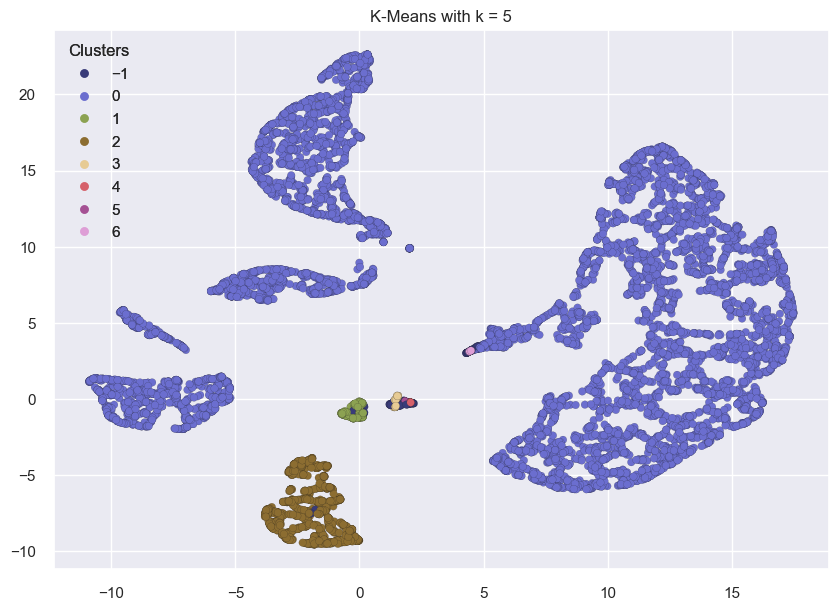

In [164]:
# Cette méthode prends du temps à l'éxécution 
data = data_sample.values
cluster_labels = labels

k= n_clusters
plot_umap_clusters(data, cluster_labels, title=f"K-Means with k = {k}")

#### Avec réduction de dimension

In [165]:
pca = PCA(n_components=2, random_state=24)
X = pca.fit_transform(X)

In [166]:
model = DBSCAN(eps=0.5, min_samples=2)
labels = model.fit_predict(X)
# visualizer(model, labels)

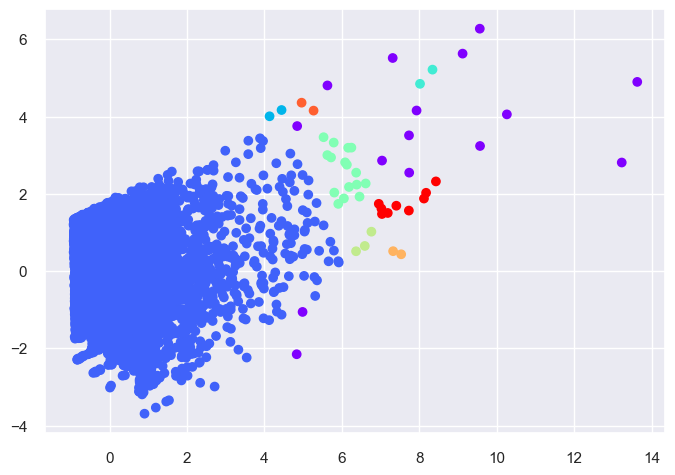

In [167]:
# plot the data points with different colors for different clusters
plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='rainbow')
plt.show()

In [168]:
pd.Series(dbscan.labels_).value_counts()

 0    8697
 2     941
 1     181
-1     102
 3      63
 4      16
dtype: int64

## **Clustering hiérarchique**

### Choix du nombre de clusters

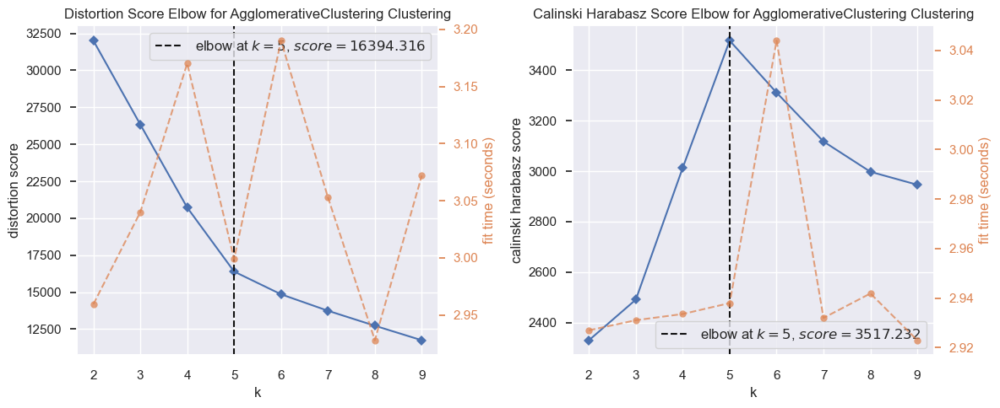

In [169]:
plot_Elbow_CalinskiHarabasz_H(data_sample)

### Entraînement model 

In [170]:
n_clusters = 5
H_clustering = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward')
H_clustering = H_clustering.fit(data_sample)

### Visualisations des clusters

#### Analyse graphique : Distributions

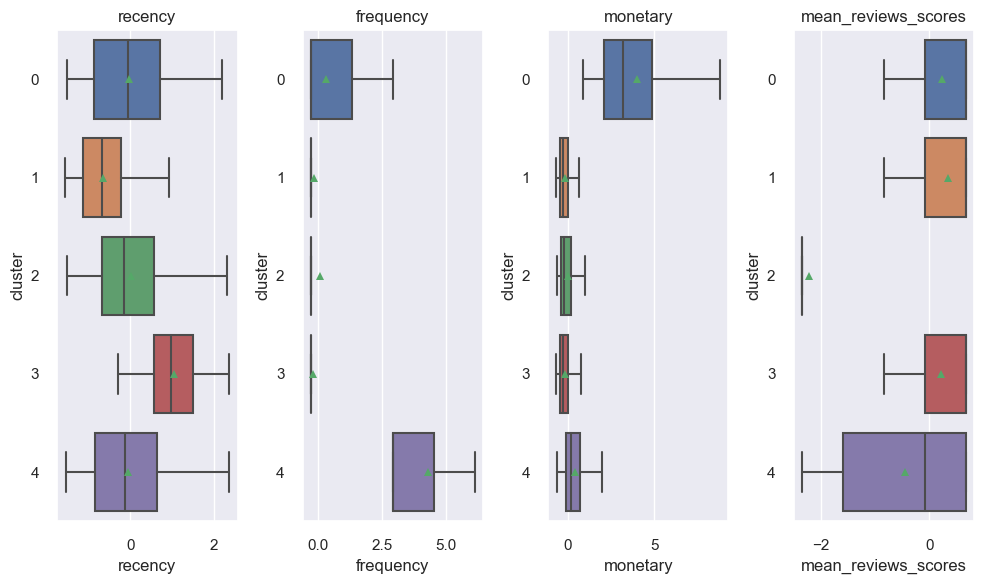

In [171]:
import matplotlib.pyplot as plt
import seaborn as sns

data_plot = data_sample.copy()
data_plot['cluster'] = H_clustering.labels_


fig, axs = plt.subplots(ncols=4, figsize=(10, 6))
for i, col in enumerate(data_plot.columns[:-1]):
    sns.boxplot(x=col, y='cluster', data=data_plot, orient='h', showfliers=False, showmeans=True, ax=axs[i])
    axs[i].set_title(col)  # Set the title of each subplot to the column name

plt.tight_layout()  
plt.show() 


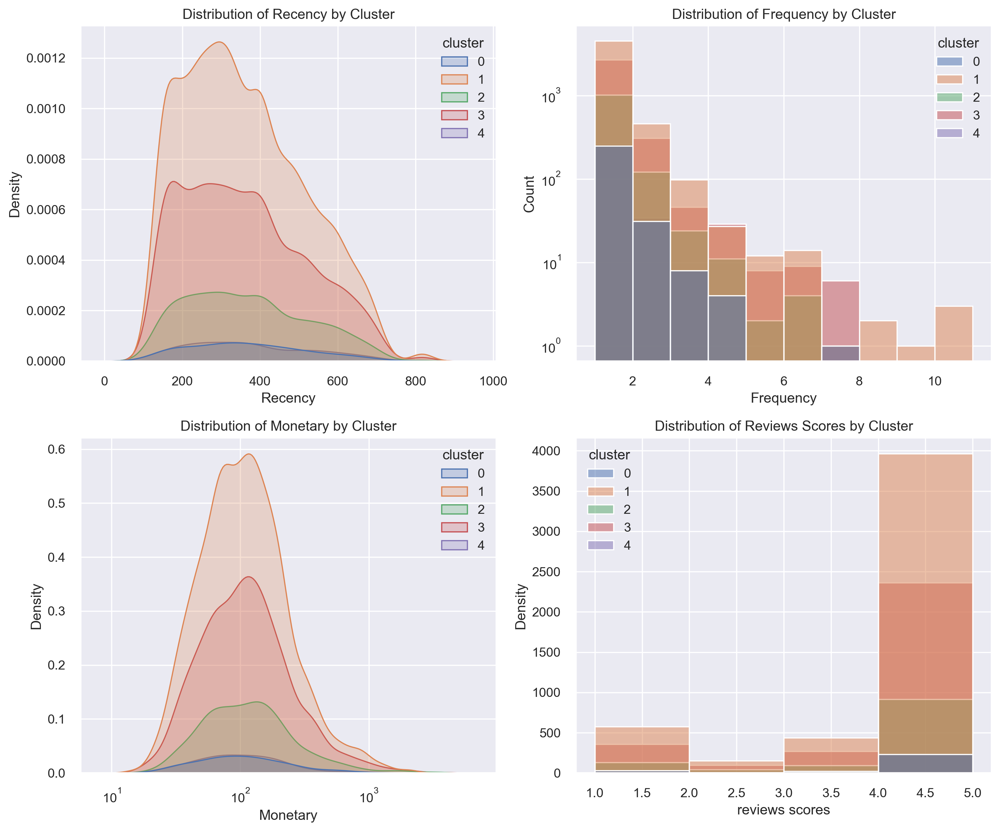

In [172]:
import matplotlib.pyplot as plt
import seaborn as sns

msk = data_to_cluster.index.isin(data_sample.index)
data_plot = data_to_cluster[msk].copy()
data_plot['cluster'] = H_clustering.labels_

# Créer les figures
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 10), dpi=250)

# Plot Distribution de la Recency
sns.kdeplot(data=data_plot, x='recency', hue='cluster', fill=True, palette='deep', ax=axs[0, 0])
axs[0, 0].set_xlabel('Recency')
axs[0, 0].set_ylabel('Density')
axs[0, 0].set_title('Distribution of Recency by Cluster')

# Plot Distribution de la Frequency
sns.histplot(data=data_plot, x='frequency', hue='cluster', palette='deep', log_scale=(False,True), binwidth=1, ax=axs[0, 1])
axs[0, 1].set_xlabel('Frequency')
axs[0, 1].set_ylabel('Count')
axs[0, 1].set_title('Distribution of Frequency by Cluster')

# Plot Distribution de la Monetary
sns.kdeplot(data=data_plot, x='monetary', hue='cluster', fill=True, palette='deep', log_scale=True, ax=axs[1, 0])
axs[1, 0].set_xlabel('Monetary')
axs[1, 0].set_ylabel('Density')
axs[1, 0].set_title('Distribution of Monetary by Cluster')

# Plot Distribution de la Reviews scores
sns.histplot(data=data_plot, x='mean_reviews_scores', hue='cluster', palette='deep', log_scale=False, binwidth=1, ax=axs[1, 1])
# sns.displot(x='mean_reviews_scores', data=data_plot, hue='cluster', aspect=1.5, palette='deep', multiple='dodge', log_scale=(False, True), bins=10);
axs[1, 1].set_xlabel('reviews scores')
axs[1, 1].set_ylabel('Density')
axs[1, 1].set_title('Distribution of Reviews Scores by Cluster')

plt.tight_layout()  
plt.show() 


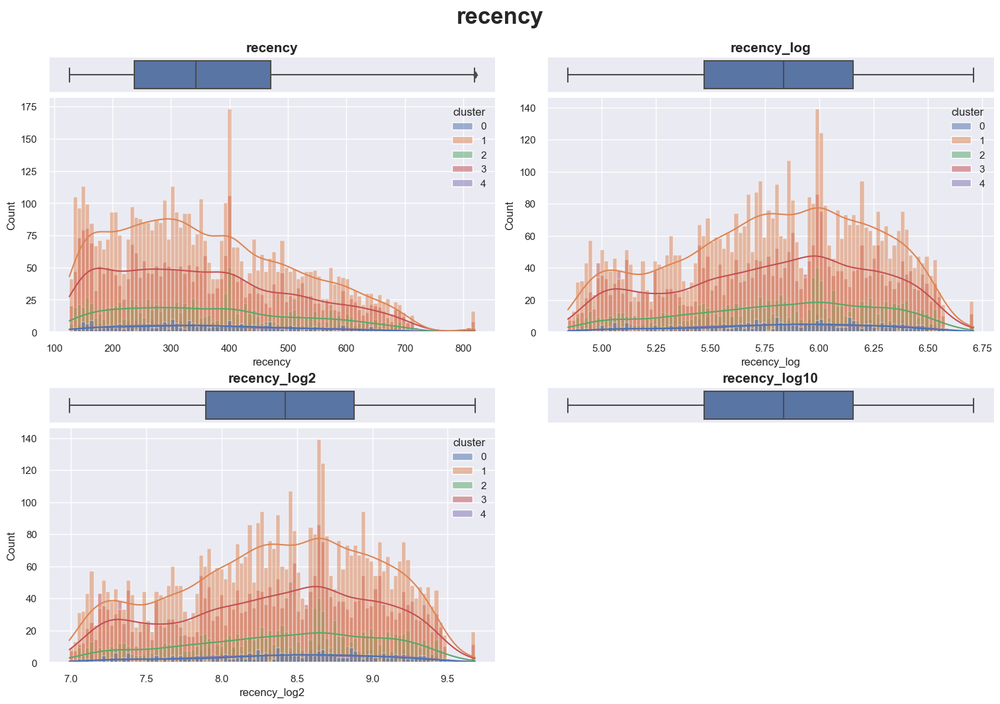

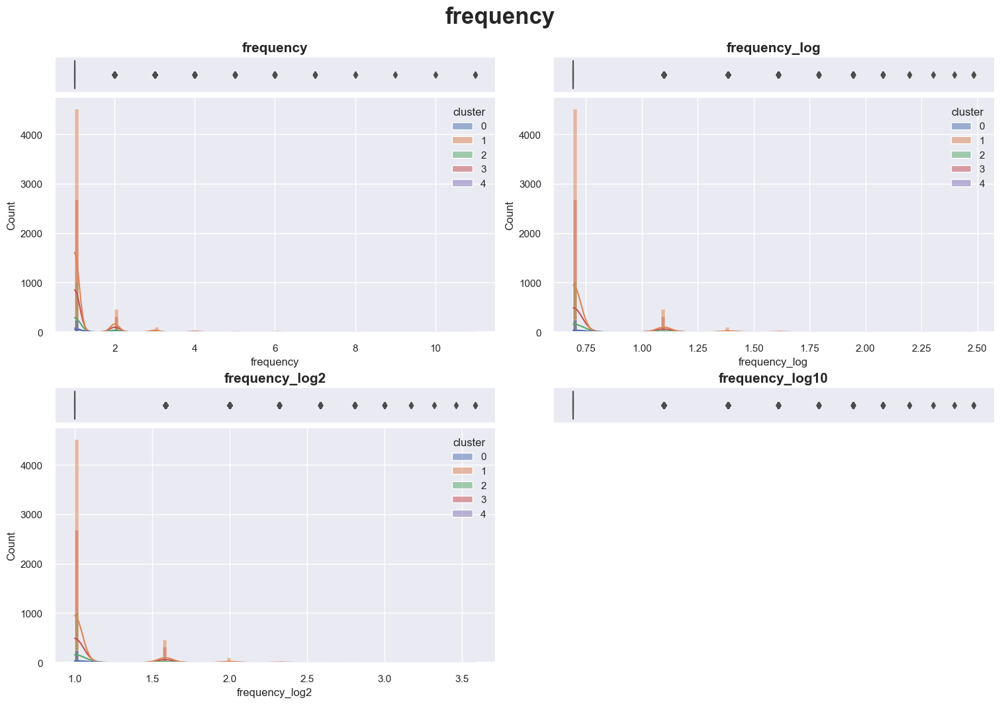

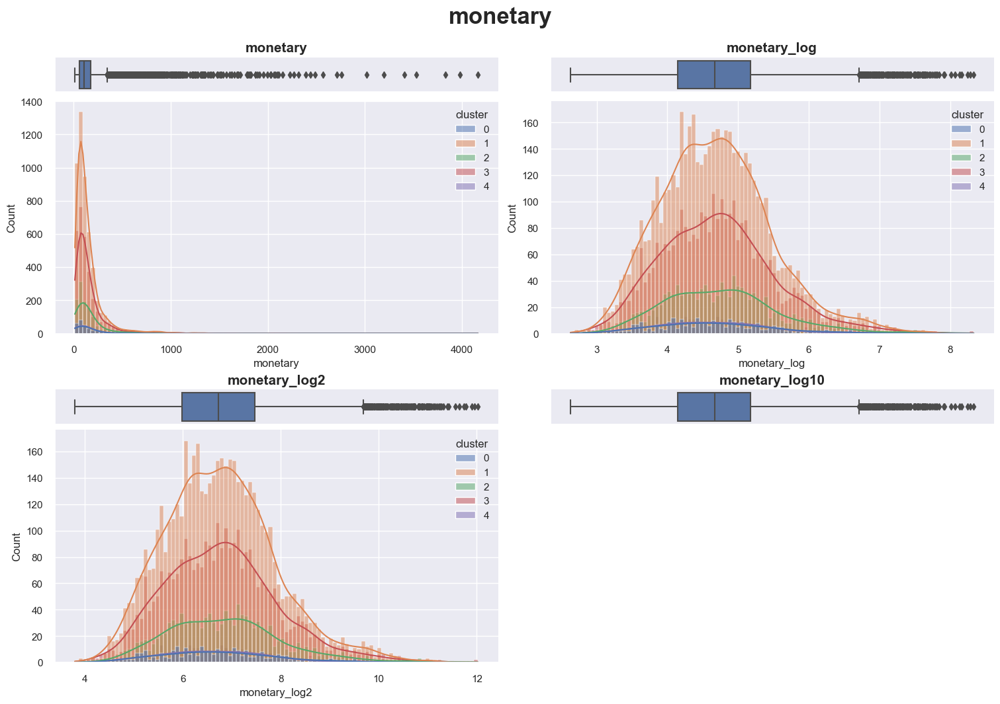

In [173]:
# Distributions 
columns = [
       'recency',
       'frequency','monetary']
plot_distribution(data_plot, columns, hue='cluster')

#### Avec réduction de dimension

#### umap visualisation

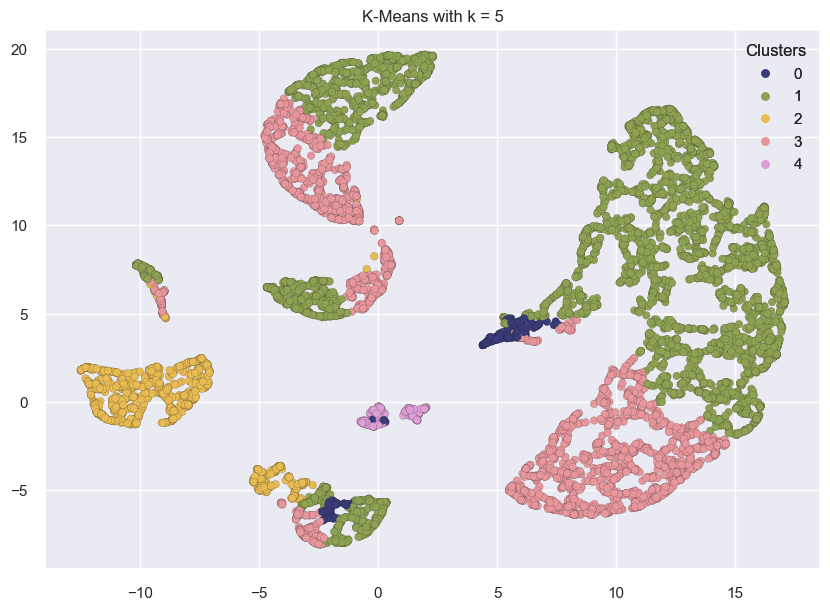

In [174]:
# Cette méthode prends du temps à l'éxécution 
data = data_sample.values
cluster_labels = H_clustering.labels_

k= n_clusters
plot_umap_clusters(data, cluster_labels, title=f"K-Means with k = {k}")

#### Radar Chart

In [175]:
labels = H_clustering.labels_
cluster_means = means_center_clusters_CAH(data_sample, labels)


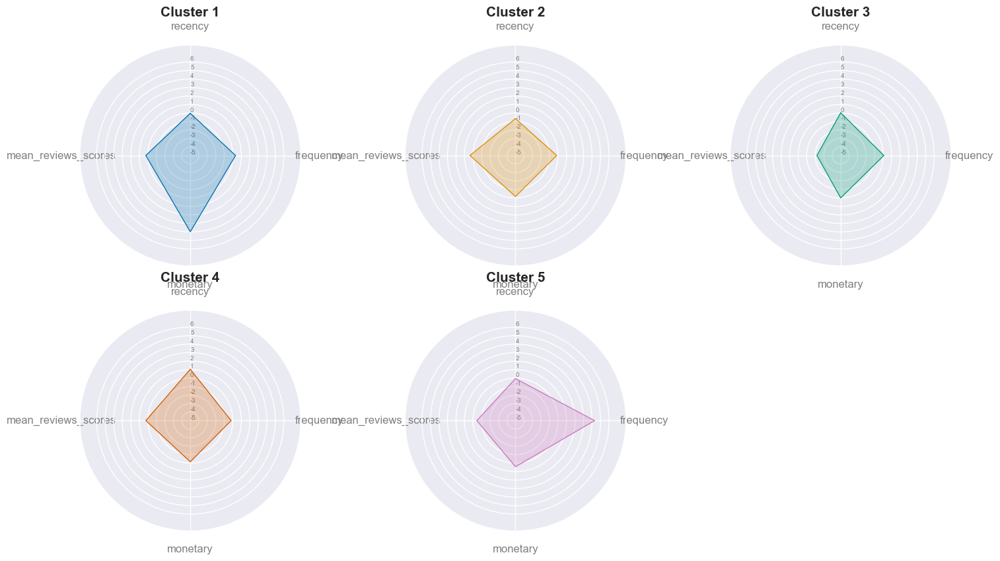

In [176]:
plot_radar_chart(cluster_means, n_clusters = n_clusters)

#### Dendrogram

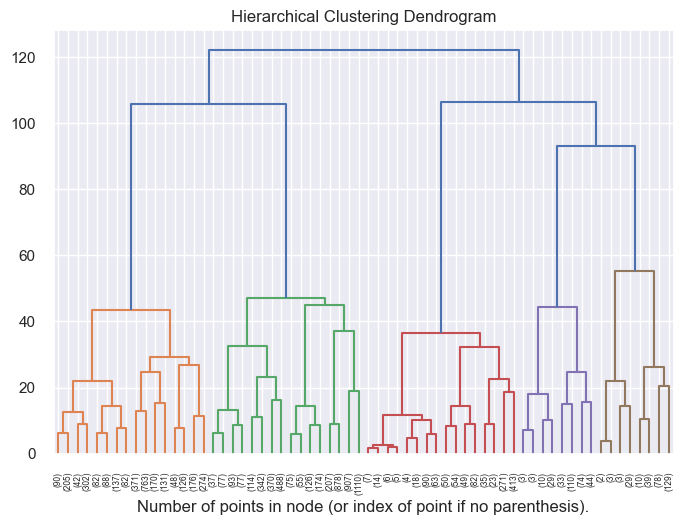

In [177]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(data_sample)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=5)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

##  Evaluation models

In [178]:
from time import time

# --- Transform into Array ---
X = np.asarray(data_sample.values)

# --- Applying PCA ---
pca = PCA(n_components=2, random_state=24)
X = pca.fit_transform(X)

models = {
    "K-Means" : KMeans(n_clusters= n_clusters, max_iter= 300, n_init= 10,init= 'k-means++', algorithm= 'auto' ),
    "DBSCAN": DBSCAN(eps=0.5, min_samples=4),
    "Hierarchical Clustering" : AgglomerativeClustering(n_clusters=n_cluster, linkage='ward')
}
names = []
db_index = []
sl_score = []
clinharab = []
TIME = []
for model in list(models.values()):

    names.append(type(model).__name__)
    t0 = time()
    y = model.fit_predict(X)
    fit_time = time() - t0
    TIME.append(fit_time)


    daviesboulin_index = round(davies_bouldin_score(X, y), 3)
    silhouett_score = round(silhouette_score(X, y), 3)
    clinskiharaba_index = round(calinski_harabasz_score(X, y), 3)
    
    
    db_index.append(daviesboulin_index)
    sl_score.append(silhouett_score)
    clinharab.append(clinskiharaba_index)
    
eval_df_set_2 = pd.DataFrame({
        "Model": names,
        "Silhouette Score" : sl_score,
        "calinski_harabasz_score": clinharab,
        "davies_bouldin_score": db_index,
        "Time Taken": TIME
    })  
eval_df_set_2

,Model,Silhouette Score,calinski_harabasz_score,davies_bouldin_score,Time Taken
0,KMeans,0.414,7432.300,0.799,0.214993
1,DBSCAN,0.739,514.590,2.021,0.330000
2,AgglomerativeClustering,0.353,5735.414,0.858,2.738998


# **Méthode RFM + Reviews + Behavior**

In [179]:
data_to_cluster = cleaned_merged_customer[rfm_columns  + behavior]

In [180]:
data_to_cluster

,recency,frequency,monetary,payment_installments,quantity_of_items,mean_reviews_scores,mean_days_delivery
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,236,1,141.90,8.0,1,5.0,6.0
0000b849f77a49e4a4ce2b2a4ca5be3f,239,1,27.19,1.0,1,4.0,3.0
0000f46a3911fa3c0805444483337064,662,1,86.22,8.0,1,3.0,25.0
0000f6ccb0745a6a4b88665a16c9f078,446,1,43.62,4.0,1,4.0,20.0
0004aac84e0df4da2b147fca70cf8255,413,1,196.89,6.0,1,5.0,13.0
...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,572,2,2067.42,10.0,2,5.0,27.0
fffea47cd6d3cc0a88bd621562a9d061,387,1,84.58,1.0,1,4.0,30.0
ffff371b4d645b6ecea244b27531430a,693,1,112.46,1.0,1,5.0,14.0


In [181]:
rapport_df(data_to_cluster)

Le Taux de remplissage total est égal à : 100.0 %
Le Nombre de features vides est égal à : 0 Features
Les Features vides sont : []

*****Nombre de catégorie features catégorielles******



##  **K-means**

### Préparation des données

In [182]:
# Préparation des données pour le clustering avec différents Algo : 

#---Data Scaled------: 
# data_scaled

#-----Sample data scaled----: 
# data_sample avec n = 10000 Clients

#----Transformation-----: 
# Nous utiliserons un StandarScaler() : transformer = 'standard'
#                     MinMaxScaler()  : transformer = 'minmax'
#                     RobustScaler()  : transformer = 'robust'

#----Inverse_transform-----: 
# La fonction nous permet aussi de récupérer l'inverse de la transformation avec inverse_transform = True
# Ne pas oublier d'ajouter data_origine dans les return

data_scaled, data_sample = scale_transform_sample(data_to_cluster, n= 10000, transformer="standard", inverse_transform=False)

In [183]:
data_scaled.head()

,recency,frequency,monetary,payment_installments,quantity_of_items,mean_reviews_scores,mean_days_delivery
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.832472,-0.290564,-0.087229,1.849408,-0.265566,0.672848,-0.643658
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.812885,-0.290564,-0.605431,-0.724019,-0.265566,-0.082327,-0.960021
0000f46a3911fa3c0805444483337064,1.948932,-0.290564,-0.338763,1.849408,-0.265566,-0.837501,1.359974
0000f6ccb0745a6a4b88665a16c9f078,0.538643,-0.290564,-0.531209,0.378878,-0.265566,-0.082327,0.832703
0004aac84e0df4da2b147fca70cf8255,0.323182,-0.290564,0.161189,1.114143,-0.265566,0.672848,0.094522


In [184]:
data_sample.head()

,recency,frequency,monetary,payment_installments,quantity_of_items,mean_reviews_scores,mean_days_delivery
customer_unique_id,,,,,,,
842bff27a9fd73c774aeb526d0f53113,0.564759,-0.290564,-0.440497,-0.356387,-0.265566,0.672848,-0.432749
97e5be9a2f1841bc42b966aa2d014d13,-0.532133,-0.290564,-0.191944,-0.356387,-0.265566,0.672848,-0.854567
987f4716cef1294c01c4c0cb7b275ff1,-0.656186,-0.290564,0.176006,1.114143,-0.265566,0.672848,-0.221841
10e1df2717597281c5cffa0e0a7ca7cb,-1.459267,-0.290564,9.326299,2.584673,-0.265566,0.672848,-0.221841
6baee3008124f2fd07c61fc8169ad485,-0.368905,2.927735,0.562072,-0.724019,3.419492,0.672848,-0.432749


In [185]:
data_sample.shape

(10000, 7)

### Choix du nombre de clusters

#### Elbow method avec visualiseur : KElbowVisualizer

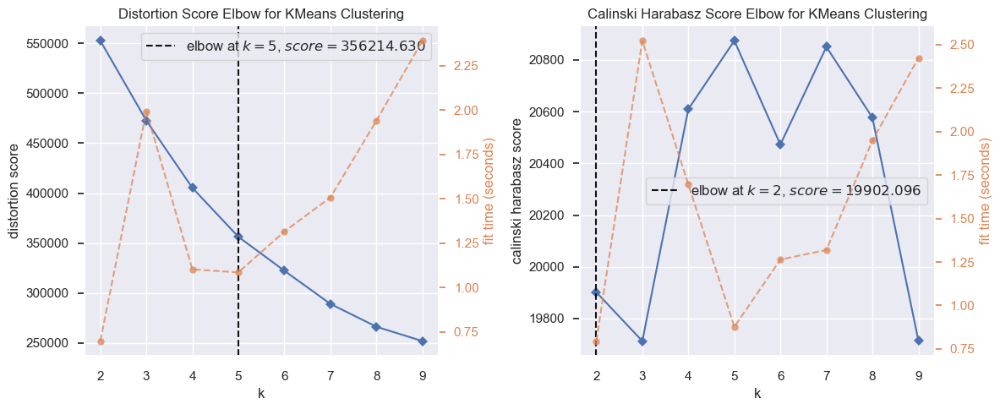

In [186]:
plot_Elbow_CalinskiHarabasz(data_scaled)

#### silhouette_score

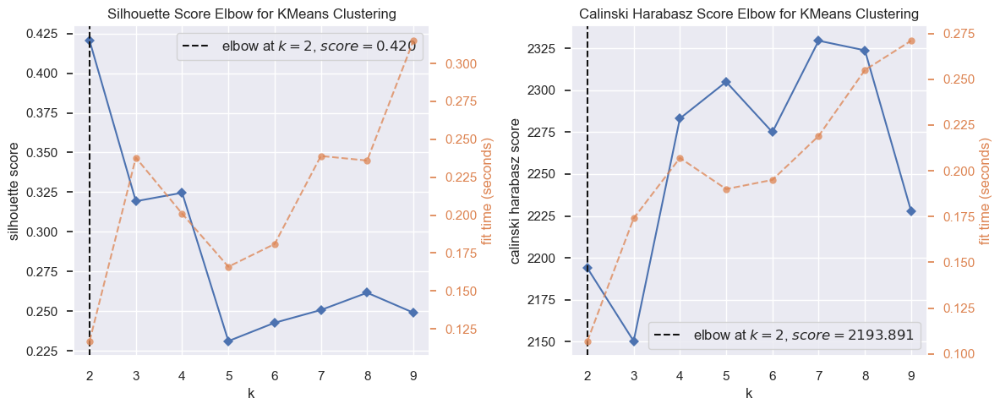

In [187]:
silhouette_score_visualisation(data_sample)

For n_clusters = 4, the average silhouette score is : 0.3243697429839897


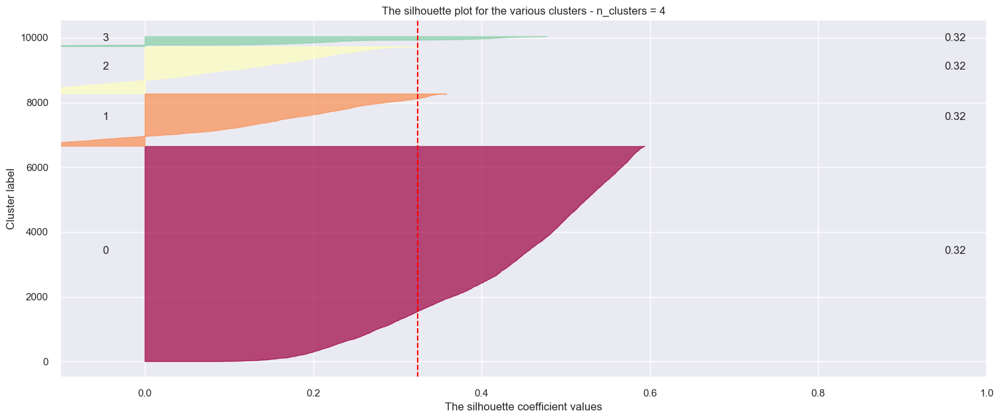

For n_clusters = 5, the average silhouette score is : 0.23119554803962739


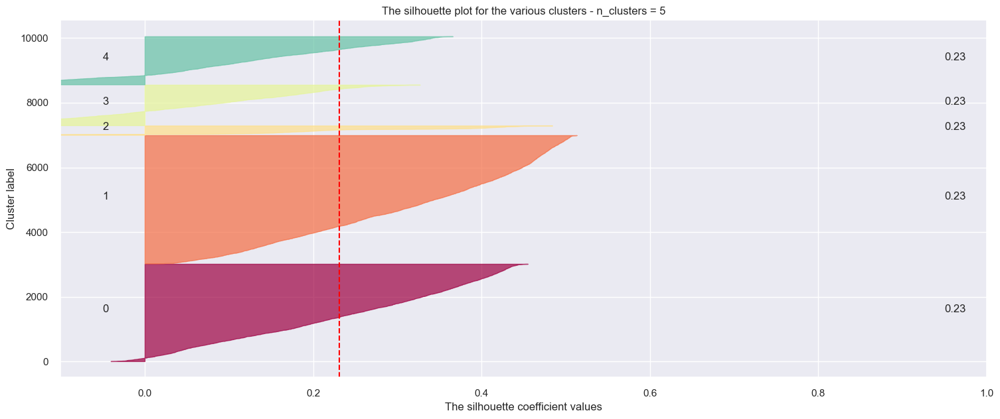

For n_clusters = 6, the average silhouette score is : 0.24277807886372066


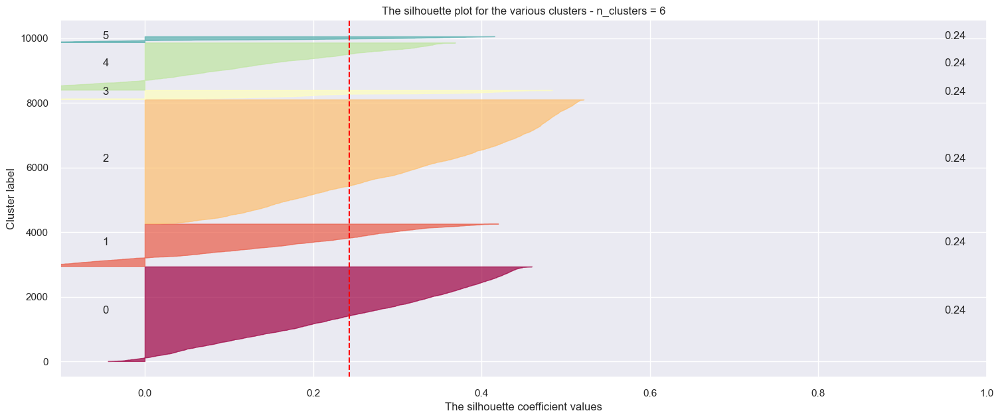

For n_clusters = 7, the average silhouette score is : 0.2552154576867604


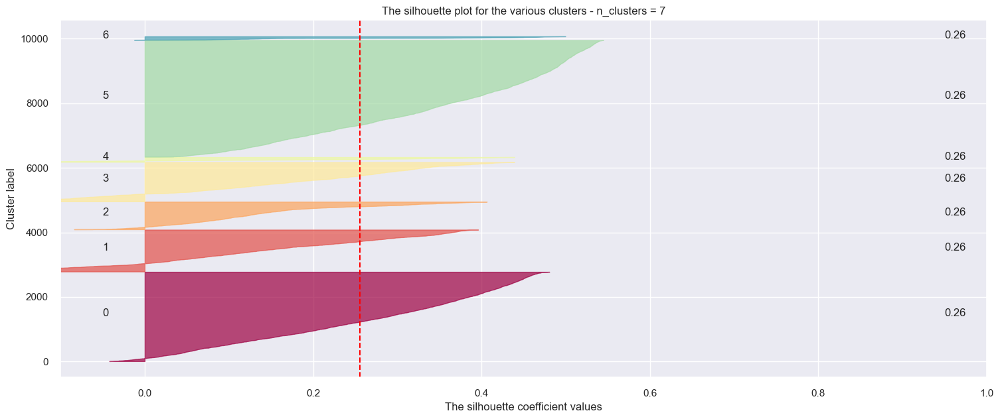

In [188]:
# Range of k values to test
range_n_clusters = [4, 5, 6, 7]
plot_slihouette_score(data_sample, range_n_clusters)

### Entraînement model 

In [189]:
n_clusters = 5
kmeans = KMeans(n_clusters= n_clusters, max_iter= 300, n_init= 10,init= 'k-means++', algorithm= 'auto' )
kmeans.fit_predict(data_scaled)

array([0, 4, 0, ..., 1, 4, 1])

### Visualisations des clusters

#### Analyse graphique : Distributions

In [190]:
data_plot = data_to_cluster.copy()
data_plot['cluster'] = kmeans.labels_
data_plot = data_plot.reset_index()
data_plot

,customer_unique_id,recency,frequency,monetary,payment_installments,quantity_of_items,mean_reviews_scores,mean_days_delivery,cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,236,1,141.90,8.0,1,5.0,6.0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,239,1,27.19,1.0,1,4.0,3.0,4
2,0000f46a3911fa3c0805444483337064,662,1,86.22,8.0,1,3.0,25.0,0
3,0000f6ccb0745a6a4b88665a16c9f078,446,1,43.62,4.0,1,4.0,20.0,1
4,0004aac84e0df4da2b147fca70cf8255,413,1,196.89,6.0,1,5.0,13.0,0
...,...,...,...,...,...,...,...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,572,2,2067.42,10.0,2,5.0,27.0,0
95416,fffea47cd6d3cc0a88bd621562a9d061,387,1,84.58,1.0,1,4.0,30.0,3
95417,ffff371b4d645b6ecea244b27531430a,693,1,112.46,1.0,1,5.0,14.0,1
95418,ffff5962728ec6157033ef9805bacc48,244,1,133.69,5.0,1,5.0,11.0,4


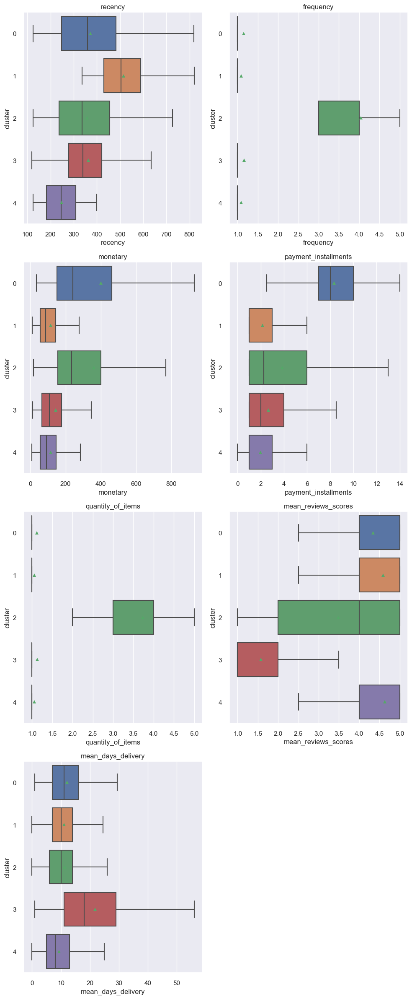

In [191]:
import math
num_cols = len(data_scaled.columns)
num_rows = math.ceil(num_cols / 2)
fig, axs = plt.subplots(nrows=num_rows, ncols=2, figsize=(10, 6*num_rows))

axs = axs.flatten()
# Boxplots
for i, col in enumerate(data_scaled.columns):
    sns.boxplot(x=col, y='cluster', data=data_plot, orient='h', showfliers=False, showmeans=True, ax=axs[i])
    axs[i].set_title(col)

# Hide any extra plots if there are an odd number of columns
for i in range(num_cols, num_rows*2):
    axs[i].axis('off')

plt.tight_layout()  
plt.show()


#### Distribution Clusters Categories

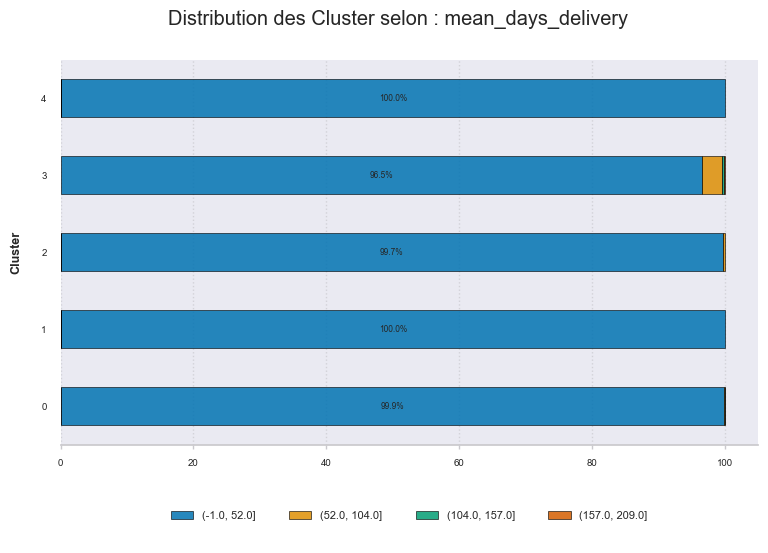

In [192]:
# mean_days_delivery : 

labels = kmeans.labels_
data = data_to_cluster
plot_category(
    data, 
    col_name="mean_days_delivery", 
    num_categories = 4, 
    labels = labels, 
    plot_name ="20_clusters_RFM_plus_Review_Behavior_mean_days_delivery",
    save_fig=True
)

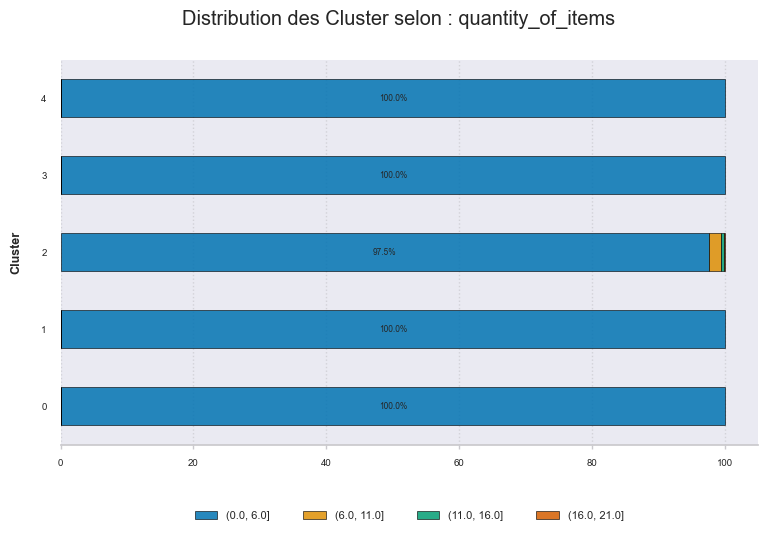

In [193]:
# quantity_of_items : 

labels = kmeans.labels_
data = data_to_cluster
plot_category(
    data, 
    col_name="quantity_of_items", 
    num_categories = 4, 
    labels = labels, 
    plot_name ="21_clusters_RFM_plus_Review_Behavior_quantity_of_items",
    save_fig=True
)

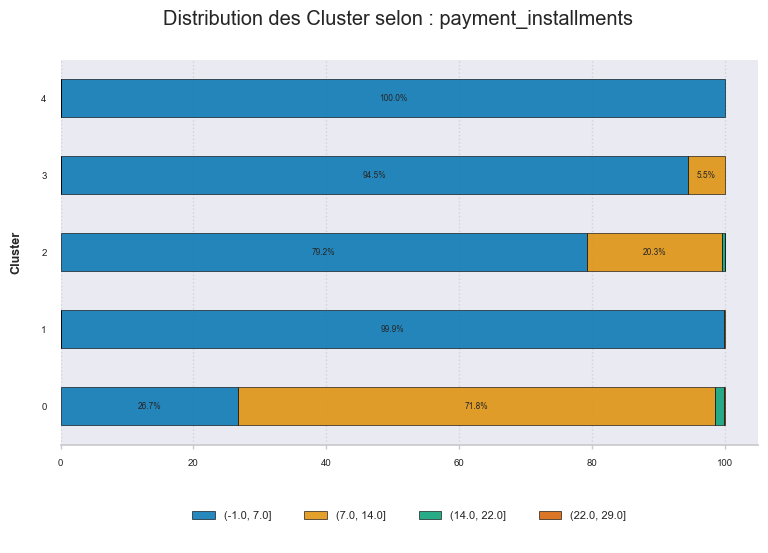

In [194]:
# payment_installments : 

labels = kmeans.labels_
data = data_to_cluster
plot_category(
    data, 
    col_name="payment_installments", 
    num_categories = 4, 
    labels = labels, 
    plot_name ="22_clusters_RFM_plus_Review_Behavior_payment_installments",
    save_fig=True
)

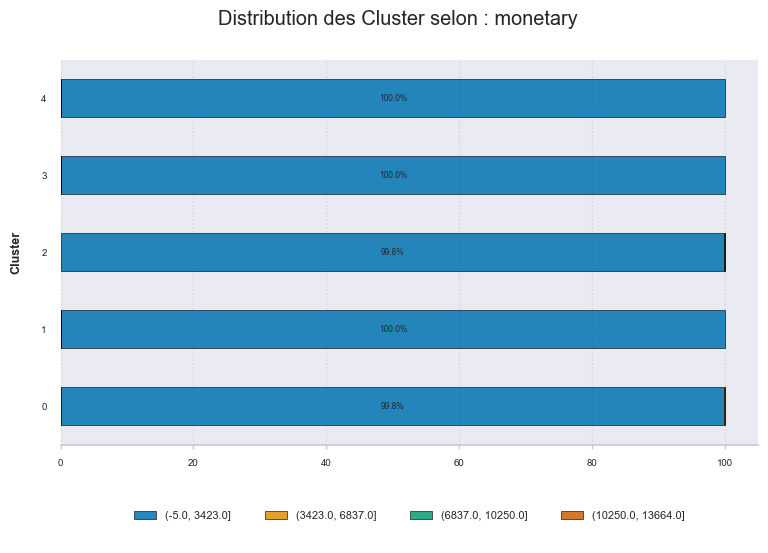

In [195]:
# monetary : 

labels = kmeans.labels_
data = data_to_cluster
plot_category(
    data, 
    col_name="monetary", 
    num_categories = 4, 
    labels = labels, 
    plot_name ="23_clusters_RFM_plus_Review_Behavior_monetary",
    save_fig=True
)

#### Avec réduction de dimension

#### umap visualisation

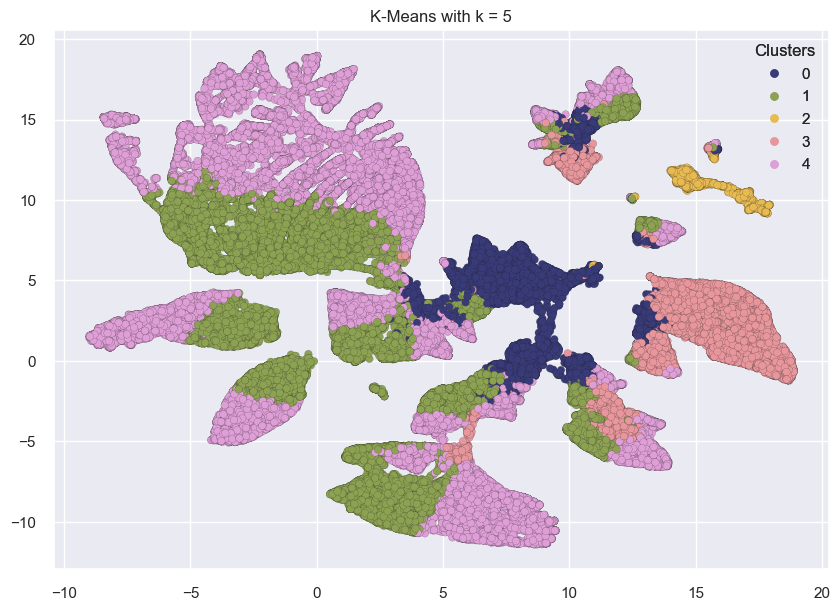

In [196]:
# Cette méthode prends du temps à l'éxécution 
data = data_scaled.values
cluster_labels = kmeans.labels_

k= n_clusters
plot_umap_clusters(data, cluster_labels, title=f"K-Means with k = {k}")

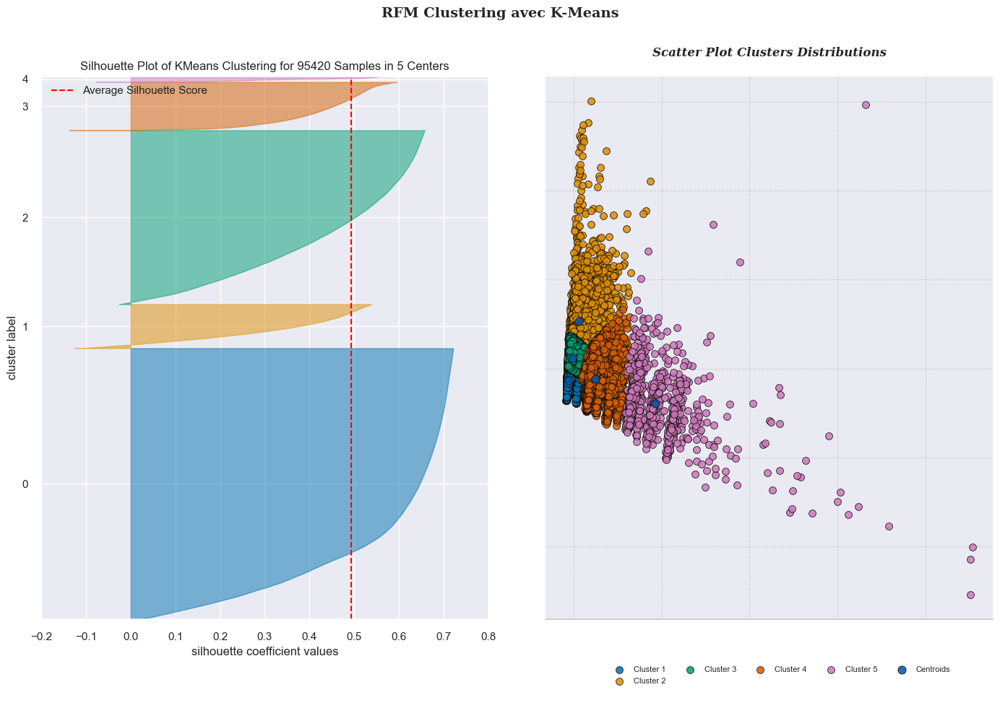

In [197]:
# --- Données brutes ---
X = np.asarray(data_scaled.values)

# --- Application PCA ---
pca = PCA(n_components=2, random_state=24)
X = pca.fit_transform(X)

# --- Implementation K-Means ---
n_cluster = n_clusters
model = KMeans(n_clusters= n_clusters, max_iter= 300, n_init= 10,init= 'k-means++', algorithm= 'auto' )
clusters_tag = model.fit_predict(X)

# --- Fonction  K-Means  ---
visualizer(model, clusters_tag)

##  **DBSCAN**

In [198]:
X = data_sample.values
X

array([[ 0.56475918, -0.2905643 , -0.44049724, ..., -0.26556591,
         0.67284798, -0.43274924],
       [-0.53213261, -0.2905643 , -0.19194423, ..., -0.26556591,
         0.67284798, -0.85456653],
       [-0.65618585, -0.2905643 ,  0.17600639, ..., -0.26556591,
         0.67284798, -0.22184059],
       ...,
       [-0.35584643, -0.2905643 , -0.53400955, ..., -0.26556591,
         0.67284798, -0.53820356],
       [ 0.48640977, -0.2905643 , -0.37783947, ..., -0.26556591,
        -0.08232655,  0.62179399],
       [-1.45926735, -0.2905643 , -0.48860865, ..., -0.26556591,
         0.67284798, -0.64365789]])

In [199]:
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# hyperparametres 
eps_range = [0.5, 1.0, 1.5]
min_samples_range = [2, 5, 10]

#  DataFrame vide pour stocker les résultats
results_df = pd.DataFrame(columns=['eps', 'min_samples', 'n_clusters', 'silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'])

# boucle sur les valeurs eps et min_samples et calcule les métriques d'évaluation pour chaque combinaison
for eps in eps_range:
    for min_samples in min_samples_range:
        
        # DBSCAN et fit data
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X)

        # calculate the evaluation metrics calculer les métriques d'évaluation
        
        silhouette_avg = silhouette_score(X, labels)
        db_index = davies_bouldin_score(X, labels)
        ch_index = calinski_harabasz_score(X, labels)

        # Nombre de cluster
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Résultats
        results_df = results_df.append({'eps': eps,
                                        'min_samples': min_samples,
                                        'n_clusters': n_clusters,
                                        'silhouette_score': silhouette_avg,
                                        'davies_bouldin_score': db_index,
                                        'calinski_harabasz_score': ch_index},
                                       ignore_index=True)

# print the results DataFrame
results_df


,eps,min_samples,n_clusters,silhouette_score,davies_bouldin_score,calinski_harabasz_score
0,0.5,2.0,248.0,-0.227863,1.426056,23.243393
1,0.5,5.0,35.0,-0.172164,1.685903,108.839047
2,0.5,10.0,11.0,-0.117174,2.138865,271.562406
3,1.0,2.0,65.0,-0.023461,1.422064,56.640621
4,1.0,5.0,10.0,0.048639,1.936740,265.133165
5,1.0,10.0,4.0,0.079978,2.216581,615.773064
6,1.5,2.0,33.0,0.054140,1.578298,119.949155
7,1.5,5.0,10.0,0.102516,1.905827,335.573598
8,1.5,10.0,6.0,0.096915,2.266733,483.063216


## **Clustering hiérarchique**

### Choix du nombre de clusters

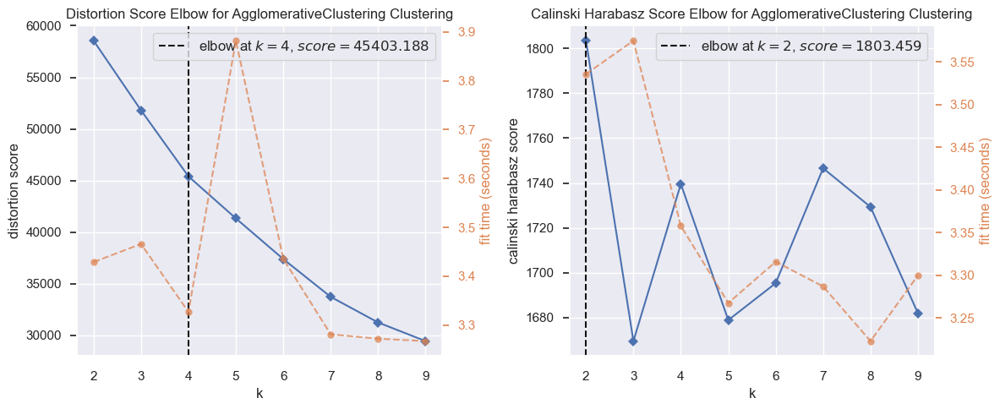

In [200]:
plot_Elbow_CalinskiHarabasz_H(data_sample)

### Entraînement model 

In [201]:
n_clusters = 5
H_clustering = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward')
H_clustering = H_clustering.fit(data_sample)

### Visualisations des clusters

#### Analyse graphique : Distributions

In [202]:
labels = H_clustering.labels_
cluster_means = means_center_clusters_CAH(data_sample, labels)
cluster_means

,cluster,recency,frequency,monetary,payment_installments,quantity_of_items,mean_reviews_scores,mean_days_delivery
0,0,0.064499,-0.290564,-0.241831,-0.406912,-0.265566,0.366312,-0.300291
1,1,-0.209674,-0.123365,0.908847,1.635041,-0.092106,0.368198,-0.225530
2,2,-0.084588,-0.271787,-0.088251,-0.035664,-0.252478,-1.218345,1.080582
3,3,-0.057494,4.562325,0.571947,0.303881,4.446356,-0.201269,-0.132039
4,4,-0.056929,1.430461,0.012509,-0.121948,1.209738,-0.317571,-0.143738


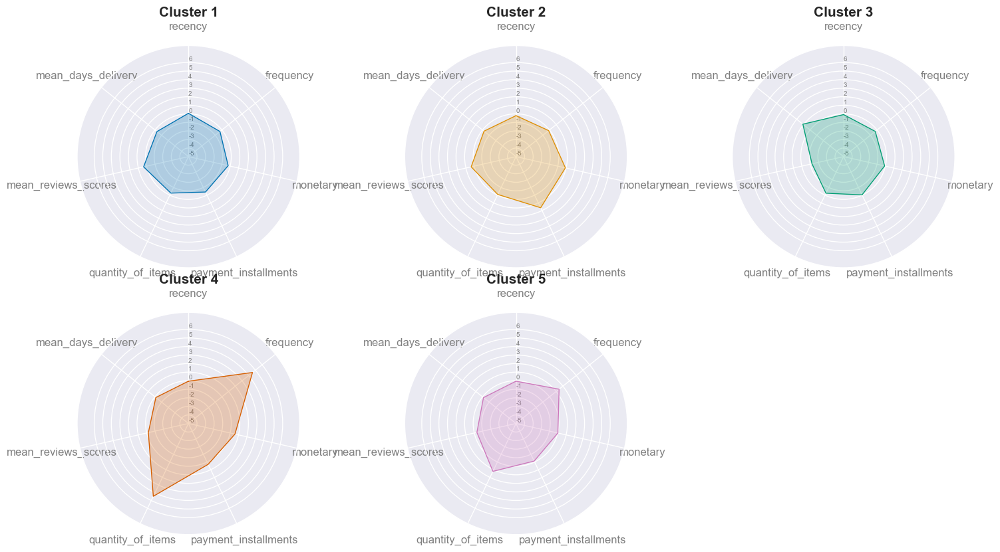

In [203]:
plot_radar_chart(cluster_means, n_clusters = n_clusters)

#### umap visualisation

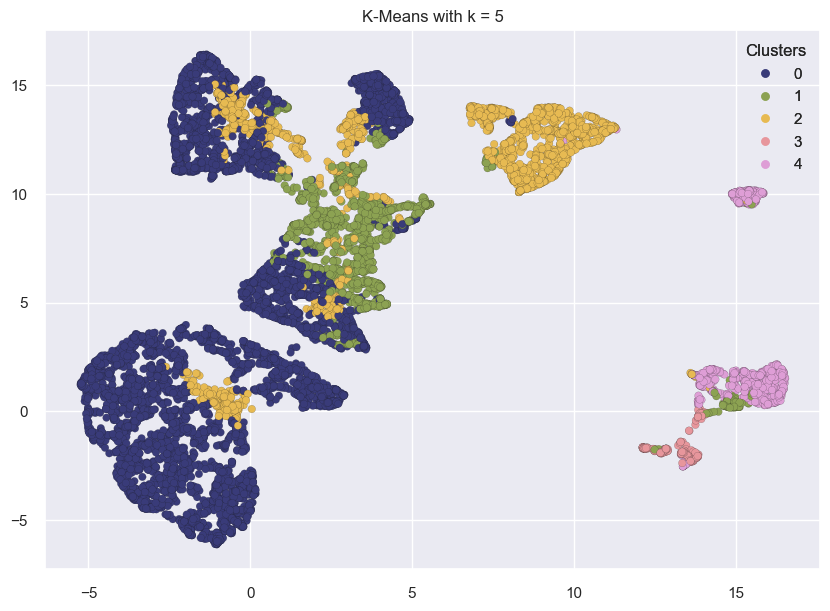

In [204]:
# Cette méthode prends du temps à l'éxécution 
data = data_sample.values
cluster_labels = H_clustering.labels_

k= n_clusters
plot_umap_clusters(data, cluster_labels, title=f"K-Means with k = {k}")

#### Dendrogram

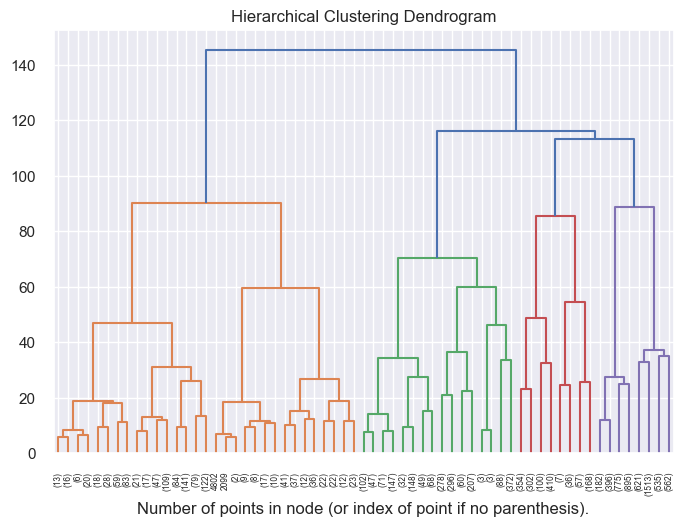

In [205]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(data_sample)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=5)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

##  Evaluation models

In [206]:
from time import time

# --- Transform into Array ---
X = np.asarray(data_sample.values)

# --- Applying PCA ---
pca = PCA(n_components=2, random_state=24)
X = pca.fit_transform(X)

models = {
    "K-Means" : KMeans(n_clusters= n_clusters, max_iter= 300, n_init= 10,init= 'k-means++', algorithm= 'auto' ),
    "DBSCAN": DBSCAN(eps=0.5, min_samples=4),
    "Hierarchical Clustering" : AgglomerativeClustering(n_clusters=n_cluster, linkage='ward')
}
names = []
db_index = []
sl_score = []
clinharab = []
TIME = []
for model in list(models.values()):

    names.append(type(model).__name__)
    t0 = time()
    y = model.fit_predict(X)
    fit_time = time() - t0
    TIME.append(fit_time)


    daviesboulin_index = round(davies_bouldin_score(X, y), 3)
    silhouett_score = round(silhouette_score(X, y), 3)
    clinskiharaba_index = round(calinski_harabasz_score(X, y), 3)
    
    
    db_index.append(daviesboulin_index)
    sl_score.append(silhouett_score)
    clinharab.append(clinskiharaba_index)
    
eval_df_set_3 = pd.DataFrame({
        "Model": names,
        "Silhouette Score" : sl_score,
        "calinski_harabasz_score": clinharab,
        "davies_bouldin_score": db_index,
        "Time Taken": TIME
    })  
eval_df_set_3

,Model,Silhouette Score,calinski_harabasz_score,davies_bouldin_score,Time Taken
0,KMeans,0.491,10059.842,0.659,0.127999
1,DBSCAN,0.648,499.215,1.594,0.445000
2,AgglomerativeClustering,0.503,8064.699,0.803,2.963004


# **Recap**

In [207]:
# Evaluation des models sur le premier set de données RFM
eval_df

,Model,Silhouette Score,calinski_harabasz_score,davies_bouldin_score,Time Taken
0,KMeans,0.429,9455.170,0.713,0.187998
1,DBSCAN,0.441,841.113,0.514,0.342045
2,AgglomerativeClustering,0.383,7558.215,0.824,2.825042


In [208]:
# Evaluation des models sur le set_2 RFM + Reviews Scores
eval_df_set_2

,Model,Silhouette Score,calinski_harabasz_score,davies_bouldin_score,Time Taken
0,KMeans,0.414,7432.300,0.799,0.214993
1,DBSCAN,0.739,514.590,2.021,0.330000
2,AgglomerativeClustering,0.353,5735.414,0.858,2.738998


In [209]:
# Evaluation des models sur le set_3 RFM + Reviews Scores + Behavior
eval_df_set_3

,Model,Silhouette Score,calinski_harabasz_score,davies_bouldin_score,Time Taken
0,KMeans,0.491,10059.842,0.659,0.127999
1,DBSCAN,0.648,499.215,1.594,0.445000
2,AgglomerativeClustering,0.503,8064.699,0.803,2.963004


***
En prenons en compte le temps d'exécution et silhouette Score : 

- l'algorithme qui perfomre le plus c'est le `K-Means.` 

- Une visualisation rapide et facile des cluters et leurs distributions.

- Le nombre de Cluters optimal pour chaque data set est égal à 5. 
***

# **All columns**

Dans cette partie, nous utiliserons toutes les colonnes afin de réaliser un clusering, 

In [210]:
data_to_cluster = cleaned_merged_customer[rfm_columns  + behavior + categories ]
data_to_cluster

,recency,frequency,monetary,payment_installments,quantity_of_items,mean_reviews_scores,mean_days_delivery,catg_construction,catg_electronics,catg_fashion,catg_furniture,catg_home,catg_others,catg_sports_leisure
customer_unique_id,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,236,1,141.90,8.0,1,5.0,6.0,0,0,0,1,0,0,0
0000b849f77a49e4a4ce2b2a4ca5be3f,239,1,27.19,1.0,1,4.0,3.0,0,0,1,0,0,0,0
0000f46a3911fa3c0805444483337064,662,1,86.22,8.0,1,3.0,25.0,0,0,0,0,0,1,0
0000f6ccb0745a6a4b88665a16c9f078,446,1,43.62,4.0,1,4.0,20.0,0,1,0,0,0,0,0
0004aac84e0df4da2b147fca70cf8255,413,1,196.89,6.0,1,5.0,13.0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,572,2,2067.42,10.0,2,5.0,27.0,0,0,2,0,0,0,0
fffea47cd6d3cc0a88bd621562a9d061,387,1,84.58,1.0,1,4.0,30.0,0,0,0,0,0,1,0
ffff371b4d645b6ecea244b27531430a,693,1,112.46,1.0,1,5.0,14.0,0,0,0,0,0,1,0


In [211]:
rapport_df(data_to_cluster)

Le Taux de remplissage total est égal à : 100.0 %
Le Nombre de features vides est égal à : 0 Features
Les Features vides sont : []

*****Nombre de catégorie features catégorielles******



##  **K-means**

### Préparation des données

In [212]:
# Préparation des données pour le clustering avec différents Algo : 

#---Data Scaled------: 
# data_scaled

#-----Sample data scaled----: 
# data_sample avec n = 10000 Clients

#----Transformation-----: 
# Nous utiliserons un StandarScaler() : transformer = 'standard'
#                     MinMaxScaler()  : transformer = 'minmax'
#                     RobustScaler()  : transformer = 'robust'

#----Inverse_transform-----: 
# La fonction nous permet aussi de récupérer l'inverse de la transformation avec inverse_transform = True
# Ne pas oublier d'ajouter data_origine dans les return

data_scaled, data_sample = scale_transform_sample(data_to_cluster, n= 10000, transformer="robust", inverse_transform=False)

In [213]:
data_scaled

,recency,frequency,monetary,payment_installments,quantity_of_items,mean_reviews_scores,mean_days_delivery,catg_construction,catg_electronics,catg_fashion,catg_furniture,catg_home,catg_others,catg_sports_leisure
customer_unique_id,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.461538,0.0,0.313968,2.000000,0.0,0.0,-0.444444,0.0,0.0,0.0,1.0,0.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.448718,0.0,-0.684791,-0.333333,0.0,-1.0,-0.777778,0.0,0.0,1.0,0.0,0.0,0.0,0.0
0000f46a3911fa3c0805444483337064,1.358974,0.0,-0.170828,2.000000,0.0,-2.0,1.666667,0.0,0.0,0.0,0.0,0.0,1.0,0.0
0000f6ccb0745a6a4b88665a16c9f078,0.435897,0.0,-0.541738,0.666667,0.0,-1.0,1.111111,0.0,1.0,0.0,0.0,0.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,0.294872,0.0,0.792756,1.333333,0.0,0.0,0.333333,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,0.974359,1.0,17.079123,2.666667,1.0,0.0,1.888889,0.0,0.0,2.0,0.0,0.0,0.0,0.0
fffea47cd6d3cc0a88bd621562a9d061,0.183761,0.0,-0.185107,-0.333333,0.0,-1.0,2.222222,0.0,0.0,0.0,0.0,0.0,1.0,0.0
ffff371b4d645b6ecea244b27531430a,1.491453,0.0,0.057639,-0.333333,0.0,0.0,0.444444,0.0,0.0,0.0,0.0,0.0,1.0,0.0


### Choix du nombre de clusters

#### Elbow method avec visualiseur : KElbowVisualizer

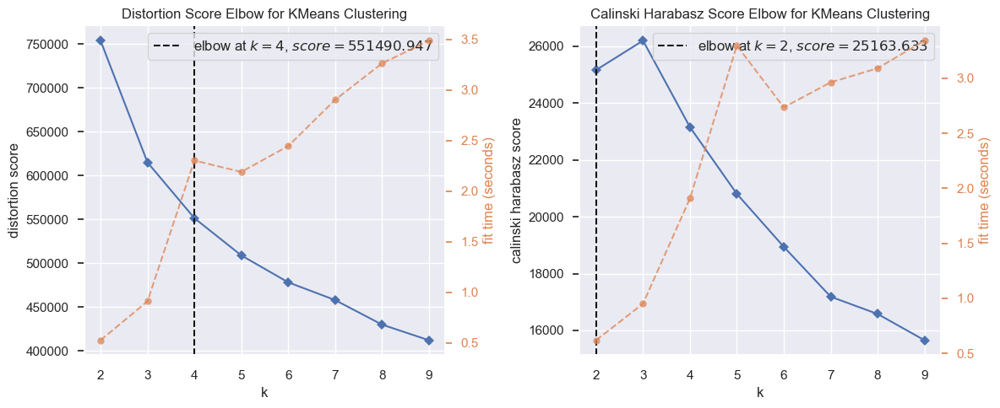

In [214]:
# K-means
plot_Elbow_CalinskiHarabasz(data_scaled)

#### Avec réduction de dimension

In [215]:
# --- Données brutes ---
X = np.asarray(data_scaled.values)

# --- Application PCA ---
pca = PCA(n_components=7, random_state=24)
X = pca.fit_transform(X)

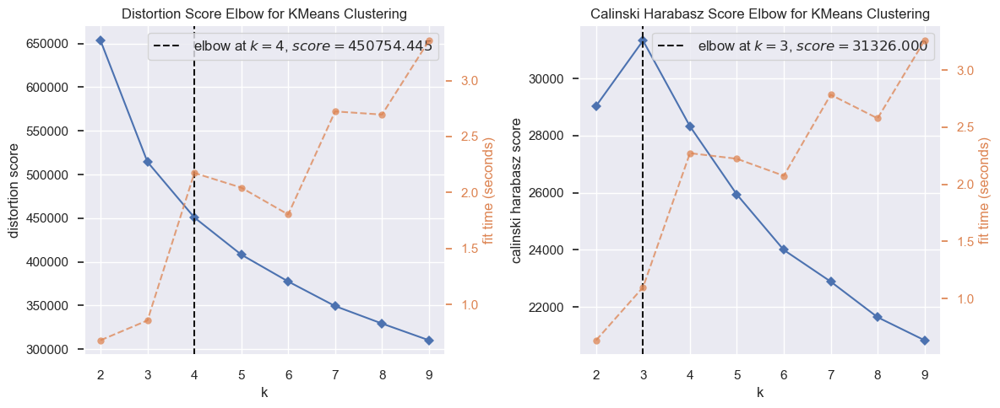

In [216]:
plot_Elbow_CalinskiHarabasz(X)

In [217]:
data_scaled.columns

Index(['recency', 'frequency', 'monetary', 'payment_installments',
       'quantity_of_items', 'mean_reviews_scores', 'mean_days_delivery',
       'catg_construction', 'catg_electronics', 'catg_fashion',
       'catg_furniture', 'catg_home', 'catg_others', 'catg_sports_leisure'],
      dtype='object')

In [218]:
fetures_acp = ['recency', 'frequency', 'monetary', 'payment_installments',
       'quantity_of_items', 'mean_reviews_scores', 'mean_days_delivery',
       'catg_construction', 'catg_electronics', 'catg_fashion',
       'catg_furniture', 'catg_home', 'catg_others', 'catg_sports_leisure']
X = data_scaled[data_scaled.columns[data_scaled.columns.isin(fetures_acp)]]
X

,recency,frequency,monetary,payment_installments,quantity_of_items,mean_reviews_scores,mean_days_delivery,catg_construction,catg_electronics,catg_fashion,catg_furniture,catg_home,catg_others,catg_sports_leisure
customer_unique_id,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.461538,0.0,0.313968,2.000000,0.0,0.0,-0.444444,0.0,0.0,0.0,1.0,0.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.448718,0.0,-0.684791,-0.333333,0.0,-1.0,-0.777778,0.0,0.0,1.0,0.0,0.0,0.0,0.0
0000f46a3911fa3c0805444483337064,1.358974,0.0,-0.170828,2.000000,0.0,-2.0,1.666667,0.0,0.0,0.0,0.0,0.0,1.0,0.0
0000f6ccb0745a6a4b88665a16c9f078,0.435897,0.0,-0.541738,0.666667,0.0,-1.0,1.111111,0.0,1.0,0.0,0.0,0.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,0.294872,0.0,0.792756,1.333333,0.0,0.0,0.333333,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,0.974359,1.0,17.079123,2.666667,1.0,0.0,1.888889,0.0,0.0,2.0,0.0,0.0,0.0,0.0
fffea47cd6d3cc0a88bd621562a9d061,0.183761,0.0,-0.185107,-0.333333,0.0,-1.0,2.222222,0.0,0.0,0.0,0.0,0.0,1.0,0.0
ffff371b4d645b6ecea244b27531430a,1.491453,0.0,0.057639,-0.333333,0.0,0.0,0.444444,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [219]:
# --- Données brutes ---
X = np.asarray(data_scaled.values)

# --- Application PCA ---
pca = PCA(n_components=7, random_state=24)
X = pca.fit_transform(X)

In [220]:
X

array([[ 0.01913169, -1.06692669, -0.13046746, ..., -0.63274597,
        -0.57338976, -0.79312136],
       [-1.3345247 , -0.26961062, -0.90856904, ..., -0.33396367,
        -0.41392603,  0.47790172],
       [-0.17174991,  1.7021559 ,  1.12281427, ..., -0.71930662,
         0.92664195,  0.14027885],
       ...,
       [-0.61212807, -0.63850402,  0.73584649, ...,  0.2570746 ,
         1.35300025,  0.03427422],
       [-0.20429383, -0.86296637,  0.33511269, ..., -0.43791068,
        -0.62415205,  0.5382333 ],
       [-0.81586983, -0.95606298,  0.11776703, ..., -0.40105973,
         0.97947625,  0.66176511]])

In [221]:
pca.explained_variance_ratio_

array([0.38741793, 0.19672427, 0.09226537, 0.07326046, 0.068846  ,
       0.04198825, 0.03376605])

In [222]:
# Enregistrons cela dans une variable :
scree = (pca.explained_variance_ratio_*100).round(2)
scree

array([38.74, 19.67,  9.23,  7.33,  6.88,  4.2 ,  3.38])

In [223]:
# La somme cumulée : 
scree_cum = scree.cumsum().round()
scree_cum

array([39., 58., 68., 75., 82., 86., 89.])

In [224]:
# Définisons ensuite une variable avec la liste de nos composantes :
x_list = range(1, 8)
x_list = list(x_list)

<AxesSubplot:>

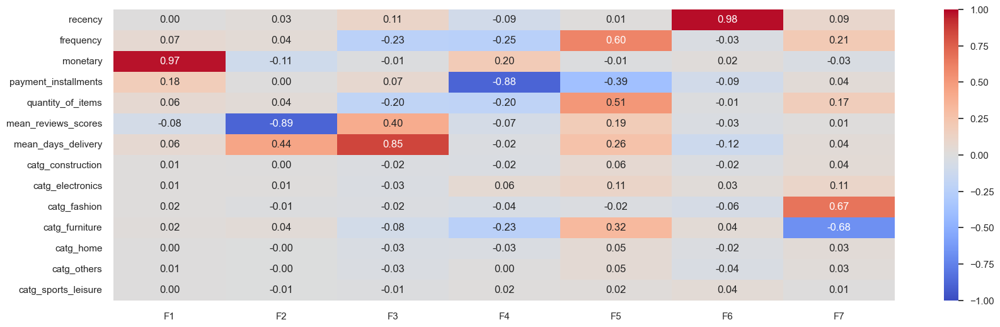

In [225]:
# Calcul des composantes principales : 
pcs = pca.components_
pcs = pd.DataFrame(pcs)
pcs.columns = fetures_acp
pcs.index = [f"F{i}" for i in x_list]
# Contribution dans le calcul de chaque composante : 
fig, ax = plt.subplots(figsize=(20, 6))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")



 PCA :

[[ 3.35977038e-03  2.92267946e-02  1.14582758e-01 -9.09793602e-02
   1.11230305e-02  9.82821686e-01  8.60194385e-02]
 [ 6.53391761e-02  3.94566417e-02 -2.27382256e-01 -2.48808008e-01
   5.98032012e-01 -2.63170029e-02  2.09200358e-01]
 [ 9.72970318e-01 -1.05509729e-01 -7.97291521e-03  1.99343490e-01
  -1.01268583e-02  2.16257860e-02 -3.22468521e-02]
 [ 1.84815543e-01  2.45447612e-03  7.08941314e-02 -8.84023771e-01
  -3.89875009e-01 -8.66530072e-02  3.53564750e-02]
 [ 6.28147872e-02  3.81967570e-02 -2.01044464e-01 -2.04851813e-01
   5.08768166e-01 -1.33402259e-02  1.74087446e-01]
 [-7.62311799e-02 -8.89302682e-01  4.00587398e-01 -6.69310987e-02
   1.93167899e-01 -2.89248131e-02  8.64851817e-03]
 [ 6.49768808e-02  4.38622268e-01  8.47702762e-01 -1.85213589e-02
   2.60855056e-01 -1.20169574e-01  3.66804121e-02]
 [ 9.53721123e-03  2.56929284e-03 -1.87922950e-02 -2.37366833e-02
   6.30022823e-02 -2.23038082e-02  4.32770736e-02]
 [ 1.16968976e-02  1.42017380e-02 -2.96442905e-02  5.8

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\decomposition\_factor_analysis.py:288: ConvergenceWarning: FactorAnalysis did not converge. You might want to increase the number of iterations.
  warnings.warn(




 Unrotated FA :

[[ 4.64506282e-03 -1.59809719e-02 -9.15034806e-03 -2.09392563e-02
  -2.59269459e-03  5.62452759e-02 -4.45209330e-02]
 [ 5.39838175e-01  2.27807669e-01  1.56607801e-01  8.28511988e-02
   1.05698193e-01 -2.48009686e-04 -4.27065405e-04]
 [ 2.49180782e-01  1.78388098e-01  1.02843374e-01  3.04274835e-02
   2.88198698e-02  1.15157162e+00  1.24690561e+00]
 [ 8.10938747e-02  3.63023993e-02 -8.62741014e-02  9.35711587e-03
  -1.07262603e-03  2.37812837e-01  2.19306641e-01]
 [ 4.36794481e-01  1.74417197e-01  1.25588402e-01  6.97810035e-02
   9.10212263e-02  1.29123035e-02  1.66342685e-02]
 [-1.34003715e-01 -1.61956345e-02 -3.71250921e-02  1.15785712e-02
   1.15736037e-02 -3.68582890e-01  2.74781886e-01]
 [ 9.11545183e-03 -4.20430298e-02 -8.72750985e-03 -3.59435718e-02
  -3.08376350e-02  7.49366224e-01 -5.72589765e-01]
 [ 3.31001259e-02  1.37314695e-02  2.36167728e-02  1.66408757e-02
   1.58585608e-01  1.24081743e-02  5.14147932e-04]
 [ 4.47961572e-02  2.23426467e-03  4.07823348

KeyboardInterrupt: 

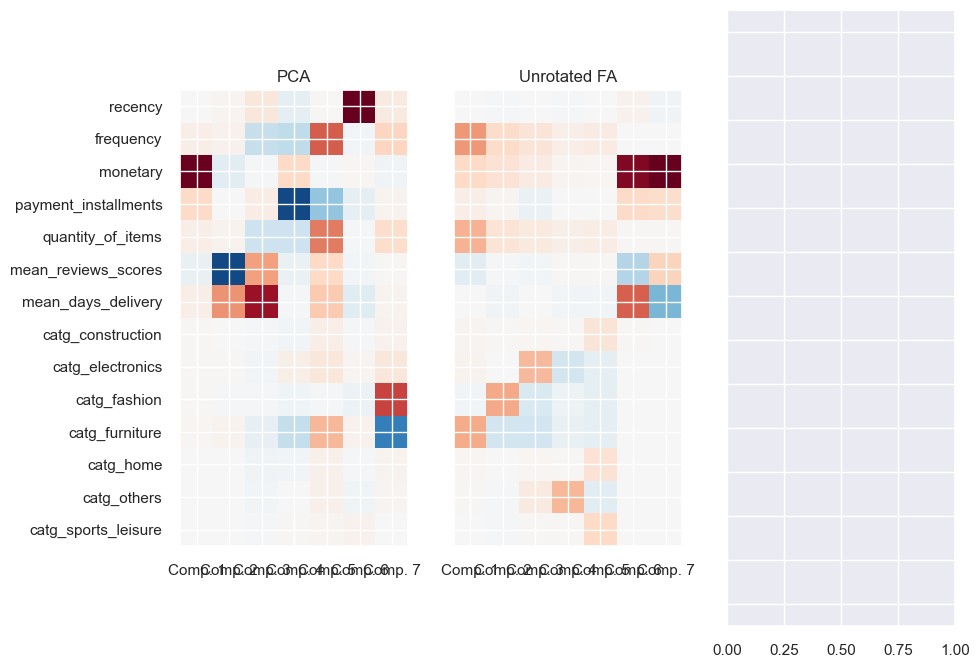

In [226]:
from sklearn.decomposition import FactorAnalysis, PCA
from sklearn.decomposition import NMF
from sklearn.preprocessing import MinMaxScaler

n_comps = 7
rand_stat = 24

methods = [
    ("PCA", PCA()),
    ("Unrotated FA", FactorAnalysis()),
    ("Varimax FA", FactorAnalysis(rotation="varimax"))
]



fig, axes = plt.subplots(ncols=len(methods), figsize=(10, 8), sharey=True)

for ax, (method, fa) in zip(axes, methods):
    fa.set_params(n_components=n_comps, random_state=rand_stat)
    fa.fit(data_scaled)

    components = fa.components_.T
    print("\n\n %s :\n" % method)
    print(components)

    vmax = np.abs(components).max()
    ax.imshow(components, cmap="RdBu_r", vmax=vmax, vmin=-vmax)
    ax.set_yticks(np.arange(len(fetures_acp)))
    ax.set_yticklabels(fetures_acp)
    ax.set_title(str(method))
    ax.set_xticks([i for i in range(n_comps)])
    ax.set_xticklabels(['Comp. {}'.format(i+1) for i in range(n_comps)])
    
fig.suptitle("Factors")
plt.tight_layout()
plt.show()

In [227]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations
    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """
    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 7), dpi=100)

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):
        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )
        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    # J'ai copié collé le code sans le lire
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

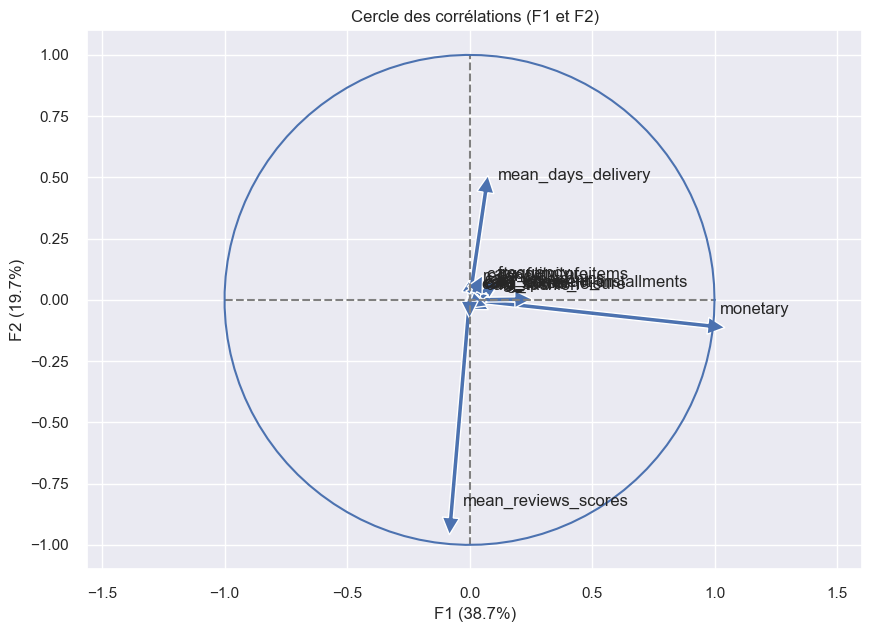

In [228]:
# F1 et F2
x_y = (0,1)
correlation_graph(pca, x_y, fetures_acp)

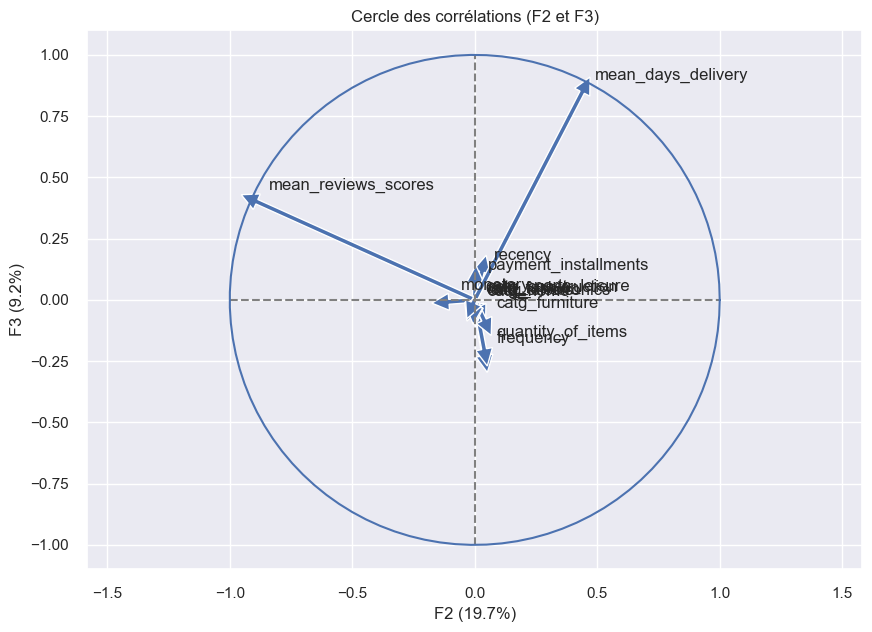

In [229]:
# F3 et F4
x_y = (1,2)
correlation_graph(pca, x_y, fetures_acp)

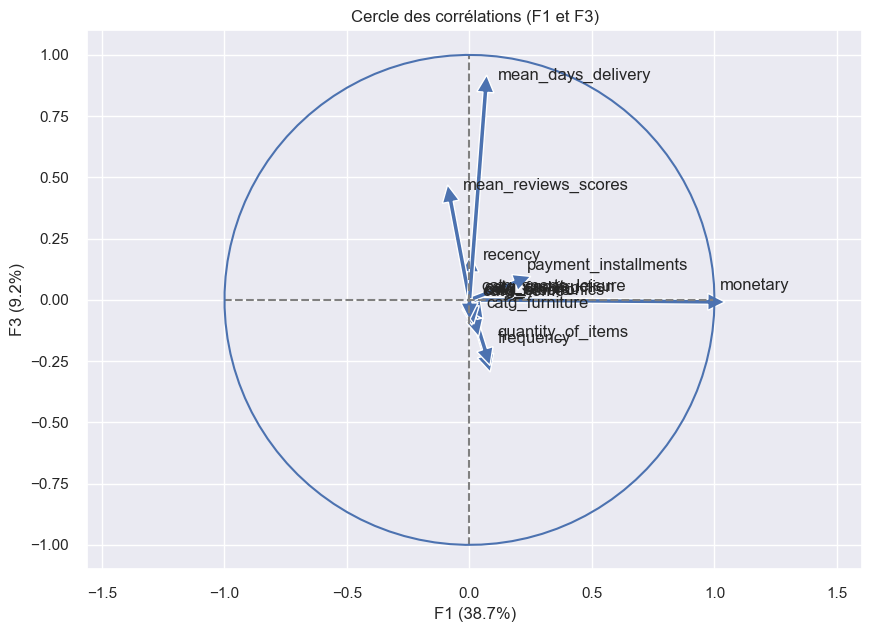

In [230]:
# F3 et F4
x_y = (0,2)
correlation_graph(pca, x_y, fetures_acp)

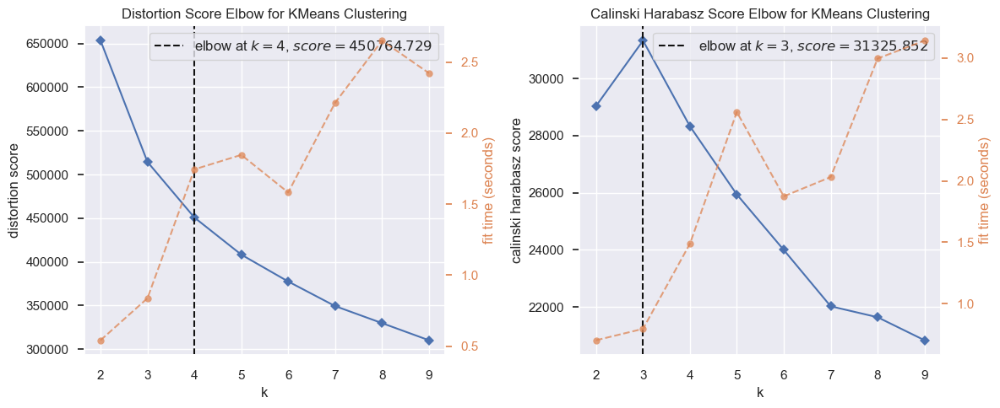

In [231]:
plot_Elbow_CalinskiHarabasz(X)

In [232]:
# create a dataframe with PCA results
pca_df = pd.DataFrame(X, columns=['Monetary', 'Satisfaction', 'Delivery', 'Payments', 'Frequent', 'Recence', 'Fashion'])
pca_df

,Monetary,Satisfaction,Delivery,Payments,Frequent,Recence,Fashion
0,0.019132,-1.066927,-0.130467,-1.617859,-0.632746,-0.573390,-0.793121
1,-1.334525,-0.269611,-0.908569,0.509404,-0.333964,-0.413926,0.477902
2,-0.171750,1.702156,1.122814,-1.546099,-0.719307,0.926642,0.140279
3,-0.888254,0.594138,0.855239,-0.360417,-0.094759,0.229122,0.096598
4,0.406137,-0.779603,0.616966,-0.723439,-0.379478,0.126150,0.045125
...,...,...,...,...,...,...,...
95415,16.748794,-1.744733,1.537123,0.655920,0.309827,0.661146,1.289105
95416,-0.660961,1.017964,1.694383,0.543476,0.515562,-0.122188,-0.013824
95417,-0.612128,-0.638504,0.735846,0.438889,0.257075,1.353000,0.034274
95418,-0.204294,-0.862966,0.335113,-0.569786,-0.437911,-0.624152,0.538233


In [233]:
n_clusters = 4
kmeans = KMeans(n_clusters= n_clusters, max_iter= 300, n_init= 10,init= 'k-means++', algorithm= 'auto' )
kmeans.fit_predict(pca_df)
labels = kmeans.labels_

In [234]:
pca_df['Cluster Labels'] = labels

In [235]:
pca_df

,Monetary,Satisfaction,Delivery,Payments,Frequent,Recence,Fashion,Cluster Labels
0,0.019132,-1.066927,-0.130467,-1.617859,-0.632746,-0.573390,-0.793121,1
1,-1.334525,-0.269611,-0.908569,0.509404,-0.333964,-0.413926,0.477902,1
2,-0.171750,1.702156,1.122814,-1.546099,-0.719307,0.926642,0.140279,0
3,-0.888254,0.594138,0.855239,-0.360417,-0.094759,0.229122,0.096598,1
4,0.406137,-0.779603,0.616966,-0.723439,-0.379478,0.126150,0.045125,1
...,...,...,...,...,...,...,...,...
95415,16.748794,-1.744733,1.537123,0.655920,0.309827,0.661146,1.289105,2
95416,-0.660961,1.017964,1.694383,0.543476,0.515562,-0.122188,-0.013824,1
95417,-0.612128,-0.638504,0.735846,0.438889,0.257075,1.353000,0.034274,1
95418,-0.204294,-0.862966,0.335113,-0.569786,-0.437911,-0.624152,0.538233,1


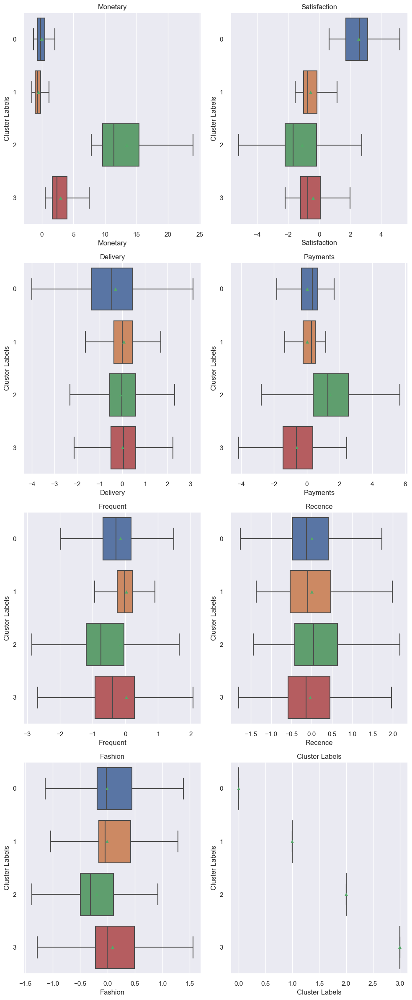

In [236]:
import math
num_cols = len(pca_df.columns)
num_rows = math.ceil(num_cols / 2)
fig, axs = plt.subplots(nrows=num_rows, ncols=2, figsize=(10, 6*num_rows))

axs = axs.flatten()
# Boxplots
for i, col in enumerate(pca_df.columns):
    sns.boxplot(x=col, y='Cluster Labels', data=pca_df, orient='h', showfliers=False, showmeans=True, ax=axs[i])
    axs[i].set_title(col)

# Hide any extra plots if there are an odd number of columns
for i in range(num_cols, num_rows*2):
    axs[i].axis('off')

plt.tight_layout()  
plt.show()

In [ ]:
# # Cette méthode prends du temps à l'éxécution 
# data = pca_df.iloc[:,:-1].values
# cluster_labels = kmeans.labels_

# k= n_clusters
# plot_umap_clusters(data, cluster_labels, title=f"K-Means with k = {k}")

#### Avec les colonnes catégories

In [237]:
data_to_cluster = cleaned_merged_customer[categories ]
data_to_cluster

,catg_construction,catg_electronics,catg_fashion,catg_furniture,catg_home,catg_others,catg_sports_leisure
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0,0,0,1,0,0,0
0000b849f77a49e4a4ce2b2a4ca5be3f,0,0,1,0,0,0,0
0000f46a3911fa3c0805444483337064,0,0,0,0,0,1,0
0000f6ccb0745a6a4b88665a16c9f078,0,1,0,0,0,0,0
0004aac84e0df4da2b147fca70cf8255,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,0,0,2,0,0,0,0
fffea47cd6d3cc0a88bd621562a9d061,0,0,0,0,0,1,0
ffff371b4d645b6ecea244b27531430a,0,0,0,0,0,1,0


In [238]:
data_scaled, data_sample = scale_transform_sample(data_to_cluster, n= 10000, transformer="standard", inverse_transform=False)

In [239]:
n_clusters = 5
kmeans = KMeans(n_clusters= n_clusters, max_iter= 300, n_init= 10,init= 'k-means++', algorithm= 'auto' )
kmeans.fit_predict(data_scaled)

array([1, 2, 4, ..., 4, 2, 2])

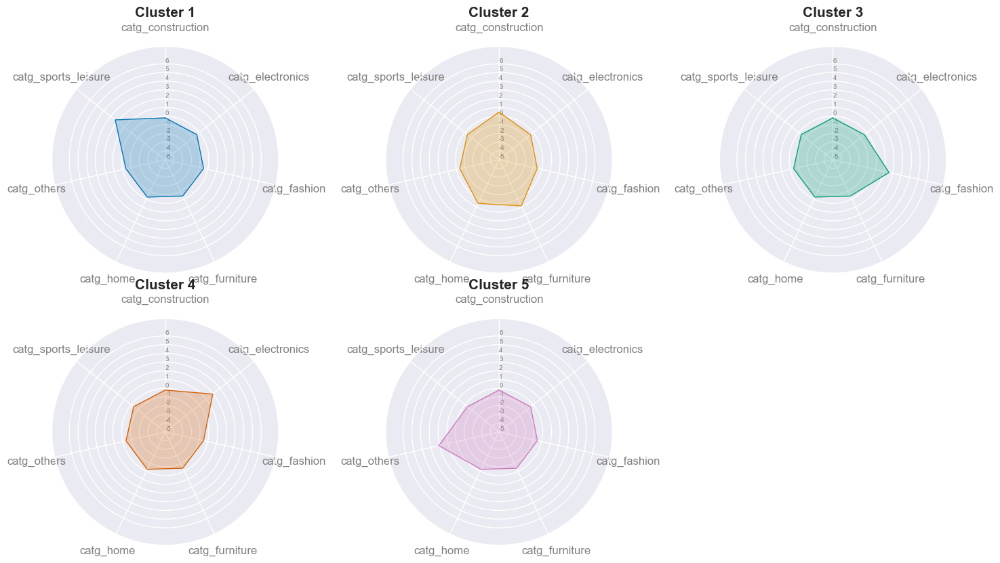

In [240]:
centroids = kmeans.cluster_centers_
plot_radar_chart(centroids, n_clusters = n_clusters)